In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import seaborn as sns
import matplotlib.pyplot as plt
import ROOT
try:
#     plt.style.use('belle2')
    #plt.style.use('belle2_serif')
    plt.style.use('belle2_modern')
except OSError:
    print("Please install belle2 matplotlib style")   

px = 1/plt.rcParams['figure.dpi']
# plt.figure(figsize=(576*px, 396*px))

Welcome to JupyROOT 6.26/04


In [2]:
import os
import pandas as pd
import numpy as np
from pandas import HDFStore
from os import path
from yaml import safe_load

from hist.get_data import get_data
from hist.bkg_stack import generic_ntuple, get_data_in_module
from read_yaml_to_dict import read_yaml_to_dict
from src.sample_name import sample_name
from src.combine_cuts import combine_cuts
print(os.getcwd())

For optimal usage set `plt.style.use('belle2')`
['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'belle2', 'belle2_modern', 'belle2_serif', 'belle2_wg1', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']
/home/jykim/workspace/DRAW/read_yaml_to_dict.py
/home/jykim/workspace/DRAW
/home/jykim/workspace/DRAW


In [3]:

from hist.draw_stack import draw_stack_include_signal
from hist.draw_stack import draw_stack_except_signal,draw_stack_no_signal,draw_stack_no_signal_omega

In [4]:
location='lab_ssd'
option = 'train_v2_pre'
sample_info = read_yaml_to_dict("samples")

In [5]:
sample_info

{'pid_0_5': {'ccbar': '/ccbar/pid_0_5_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'pid_0_5_no_signal': {'ccbar': '/ccbar/pid_0_5_no_signal_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'location': {'kekcc': '/group/belle/users/jaeyoung/storage/01_recon/merge_generic_bkg',
  'lab_nas': '/home/jykim/nas/storage/01_recon/merge_generi

In [6]:
sample_loc=sample_name(option=option, location=location, sample_info=sample_info) 
#sample_loc=sample_name(option='pid_0_5_no_signal', location=location) 
print(sample_loc )

{'ccbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ccbar/train_v2_pre_ccbar_recon_output_0*.root', 'charged': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/charged/train_v2_pre_charged_recon_output_0*.root', 'mixed': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/mixed/train_v2_pre_mixed_recon_output_0*.root', 'uubar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/uubar/train_v2_pre_uubar_recon_output_0*.root', 'ddbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ddbar/train_v2_pre_ddbar_recon_output_0*.root', 'ssbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ssbar/train_v2_pre_ssbar_recon_output_0*.root', 'taupair': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/taupair/train_v2_pre_taupair_recon_output_0*.root'}


In [7]:
List = ['phi', 'antiKstar', 'rho', 'omega']
extract_variables = "plot_variables"

In [8]:
plot_variables = read_yaml_to_dict(extract_variables )

In [9]:
plot_variables

{'vars': ['D0_M',
  'Dstarp_Q',
  'D0_cosHel_0',
  'Dstarp_CMS_p',
  'gamma_E',
  'gamma_clusterSecondMoment',
  '__ncandidates__',
  '__experiment__',
  '__run__',
  '__event__',
  'Dstarp_isSignal',
  'D0_isSignal']}

In [40]:
for mode in List:
    if mode == 'phi':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        plot_variables['vars'].append('phi_Kp_nCDCHits')
        plot_variables['vars'].append('phi_Km_nCDCHits')
        pd_phi = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'antiKstar':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_antiKstar = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'rho':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_rho = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'omega':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_omega = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
        

['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'phi_Kp_nCDCHits', 'phi_Km_nCDCHits', 'Phi_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'antiKstar_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'Rho_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', '

In [41]:
def get_data(file='file', figname='name', tree='tree', base_filter=None,variables=None):
    
    tree=tree
    f = file
    base_filter  = base_filter    
    
    ROOT_df_start = ROOT.RDataFrame(tree, f)  
    col_dict  = ROOT_df_start.AsNumpy(variables)
    
    if base_filter !=None:
        ROOT_df_filtered  = ROOT_df_start.Filter(base_filter)                            
        col_dict  = ROOT_df_filtered.AsNumpy(variables)
    
    pd_df  = pd.DataFrame(col_dict)
    
    return pd_df

In [42]:
plot_variables = read_yaml_to_dict(extract_variables )
plot_variables['vars'].append('Pi0_Prob')
plot_variables['vars'].append('Eta_Prob')
plot_variables['vars'].append('Pis_charge')
plot_variables['vars'].append('Omega_InvM')

In [43]:
base_filter = 'omega_rank_Dstp==1'

file = '/media/jykim/ssd_T5/storage/01_recon/omega/specific_bkg/pre_extraction_D2omegapi0_mdst_700fb.root'
pd_omegapi0 = get_data(file=file, tree='omega', base_filter=base_filter, variables=plot_variables['vars'])
pd_omegapi0['class']='omegapi0'


file = '/media/jykim/ssd_T5/storage/01_recon/omega/specific_bkg/pre_extraction_D2omegaeta_mdst_700fb.root'
pd_omegaeta = get_data(file=file, tree='omega', base_filter=base_filter, variables=plot_variables['vars'])
pd_omegaeta['class']='omegaeta'

file = '/media/jykim/ssd_T5/storage/01_recon/omega/specific_bkg/pre_extraction_D2pippimpi0eta_mdst_700fb.root'
pd_pippimpi0eta = get_data(file=file, tree='omega', base_filter=base_filter, variables=plot_variables['vars'])
pd_pippimpi0eta['class']='pippimpi0eta'

# Watch variation according to signal extraction

In [44]:
# print(var_name_phi)

In [45]:
# Watching_vars = ['D0_M','Dstarp_CMS_p','Dstarp_Q','class','Pi0_Prob','phi_Kp_nCDCHits','phi_Km_nCDCHits']
#
Watching_vars = ['D0_M','Dstarp_CMS_p','Dstarp_Q','class','Pi0_Prob','Pis_charge']

## phi

In [46]:
pd_phi.Dstarp_Q.max()

0.020428746938705444

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


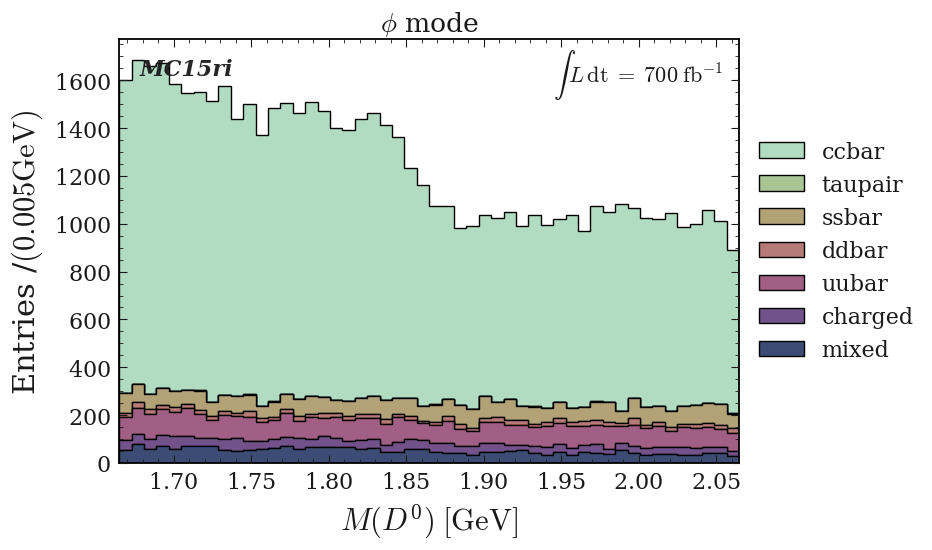

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


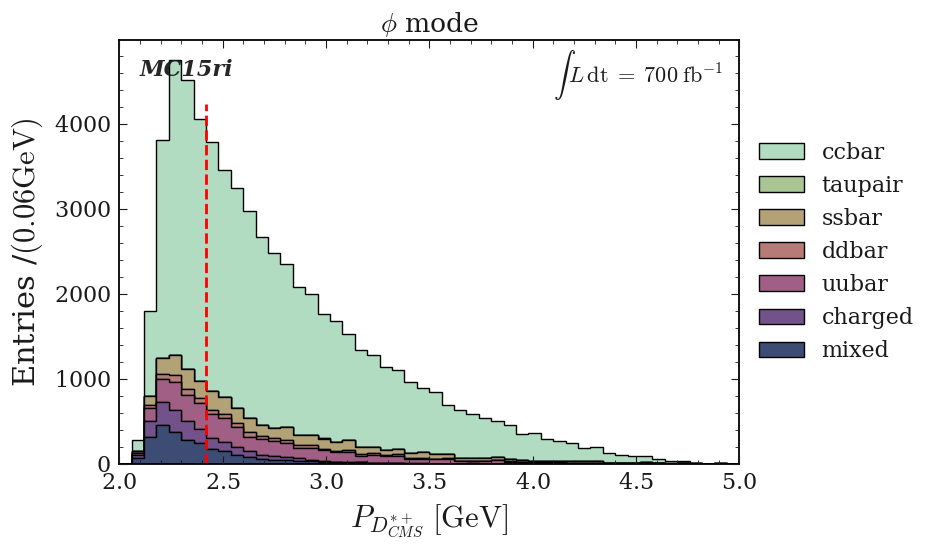

Q
$Q \; [\mathrm{GeV}]$


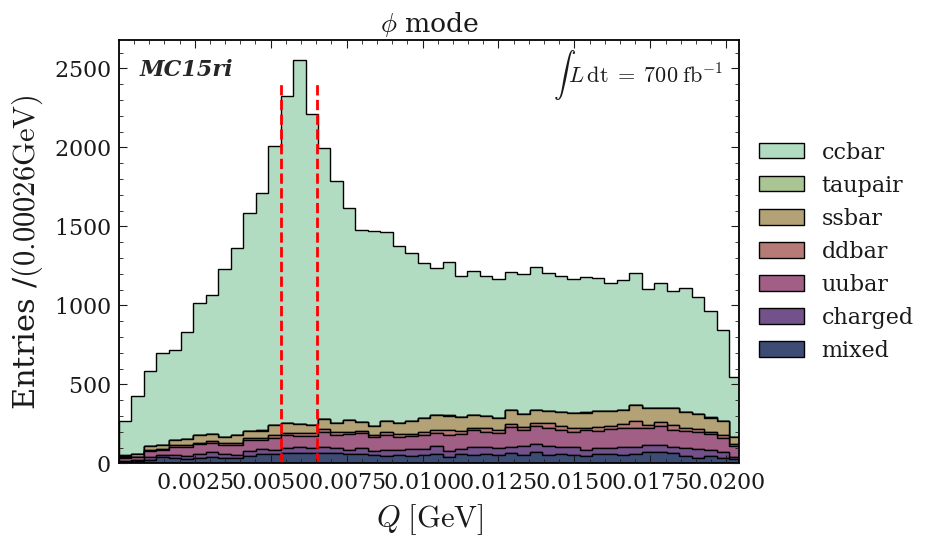

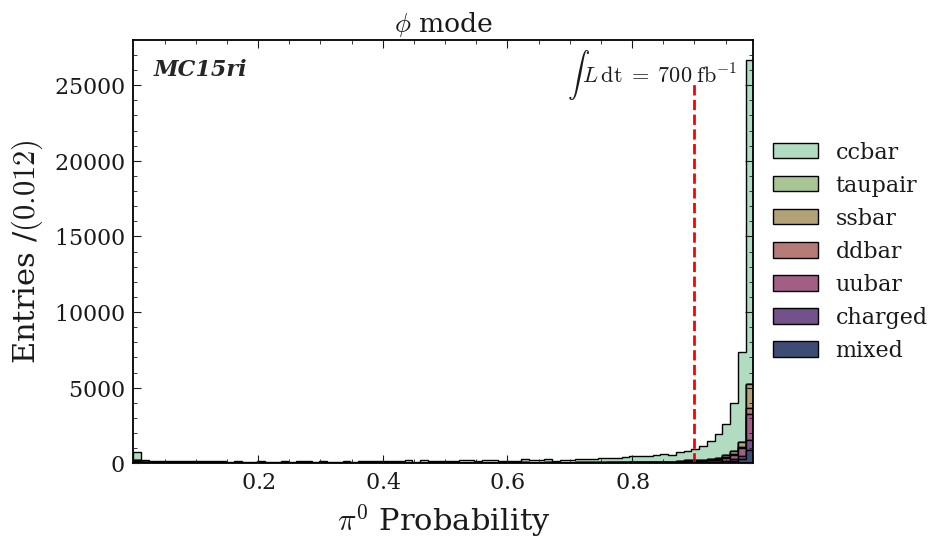

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


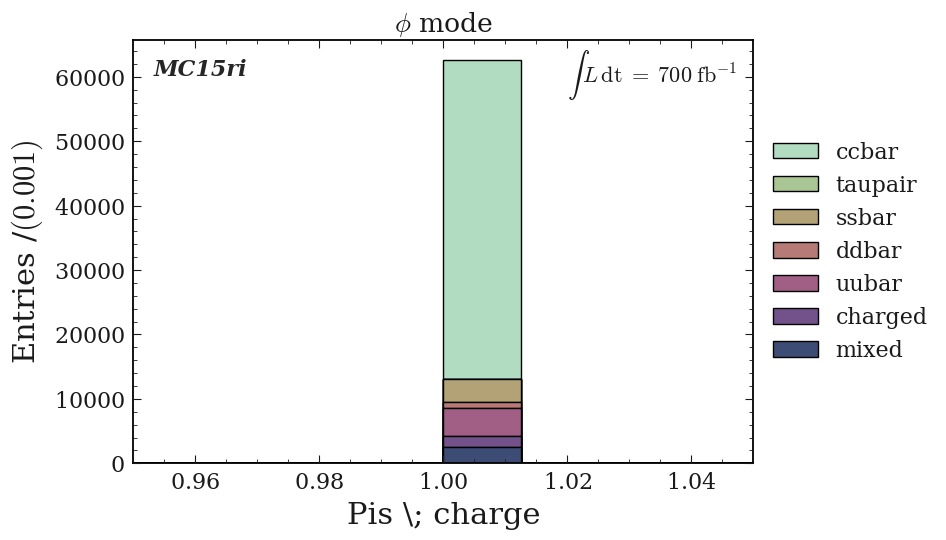

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


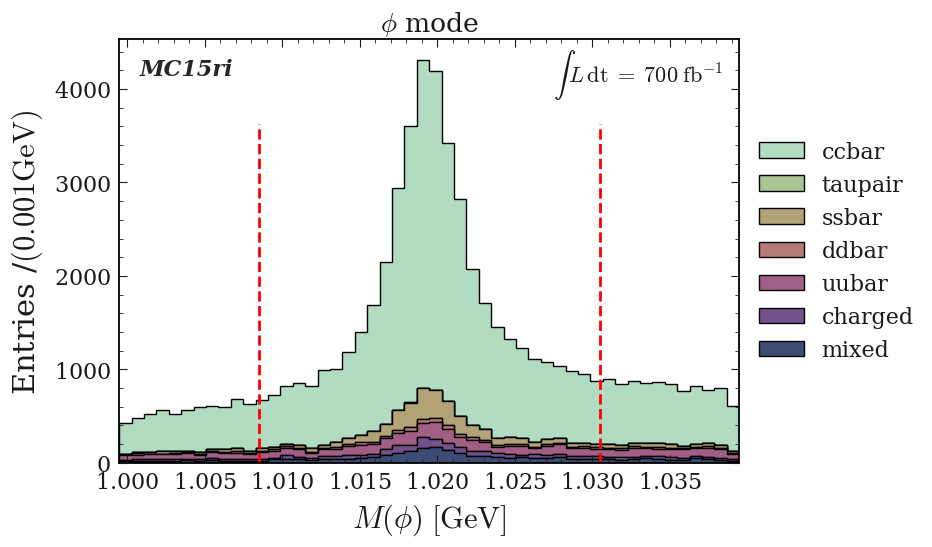

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [47]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi = pd_phi.query("(Pis_charge==1) and (Phi_InvM < 1.0195+0.02) and (Phi_InvM > 1.0195-0.02) and (D0_M>1.665) and (D0_M<2.065)")
draw_stack_no_signal(figname='Before_0_No_cut', df=pd_phi,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


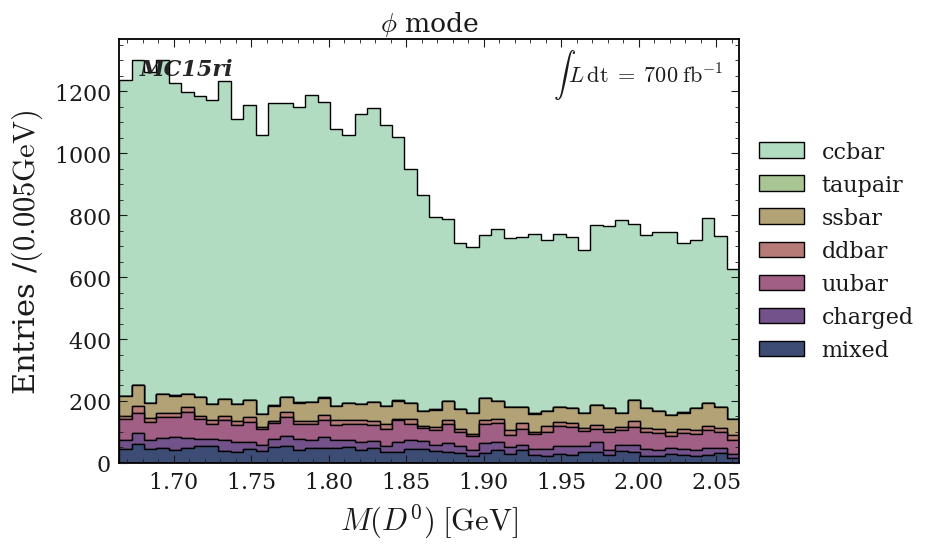

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


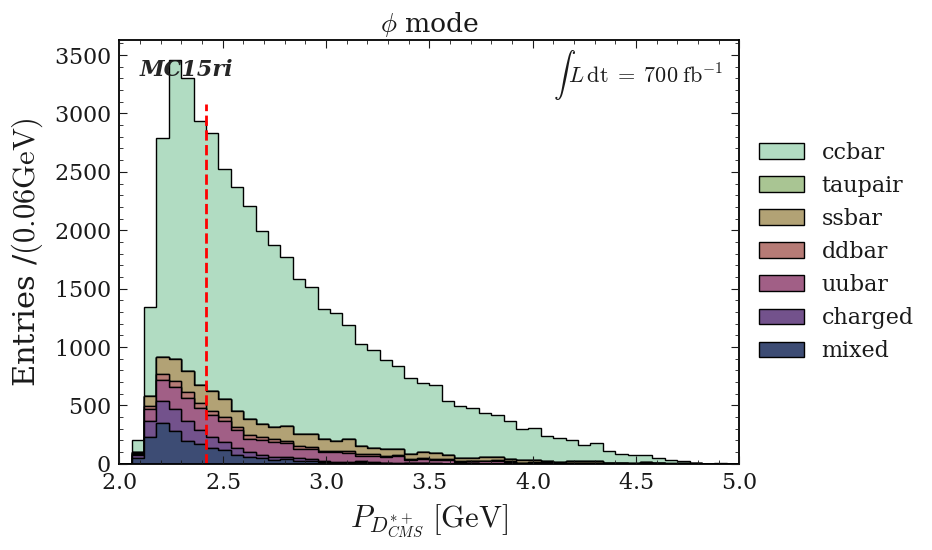

Q
$Q \; [\mathrm{GeV}]$


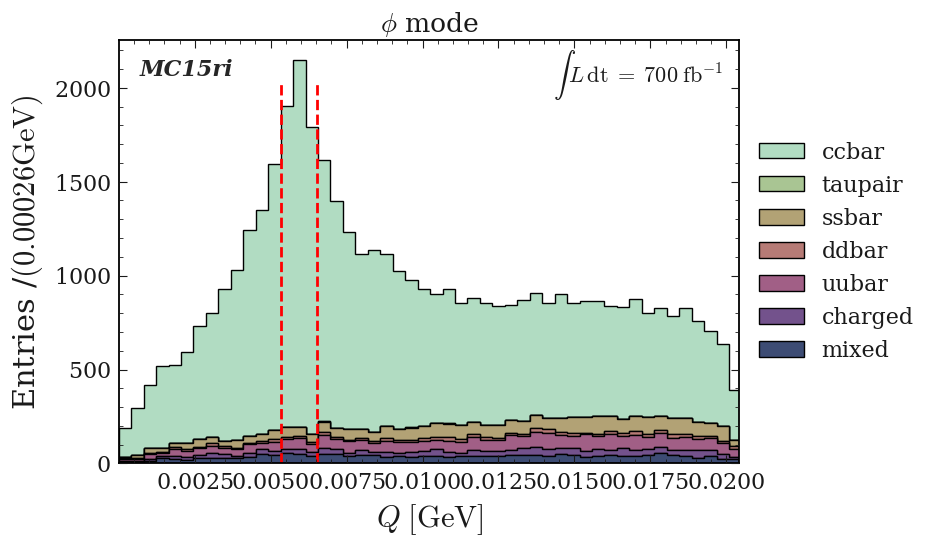

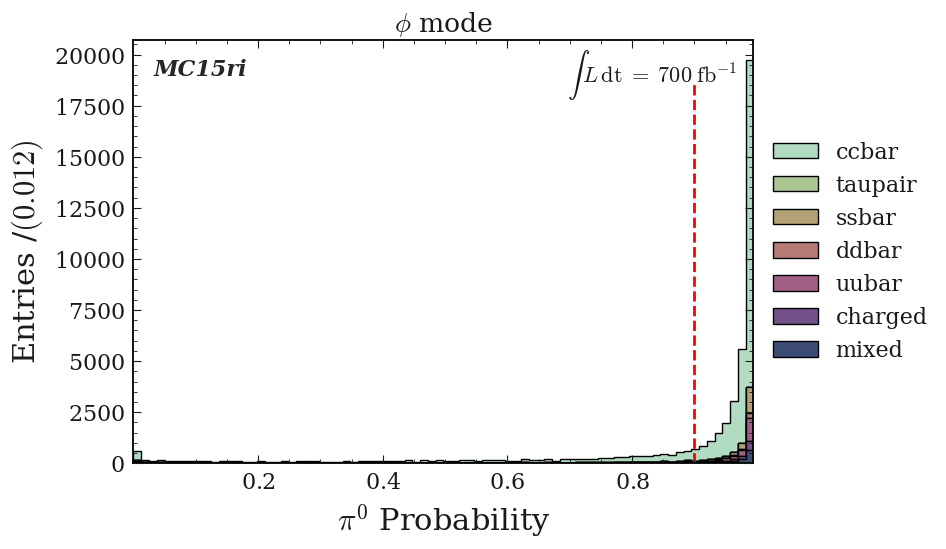

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


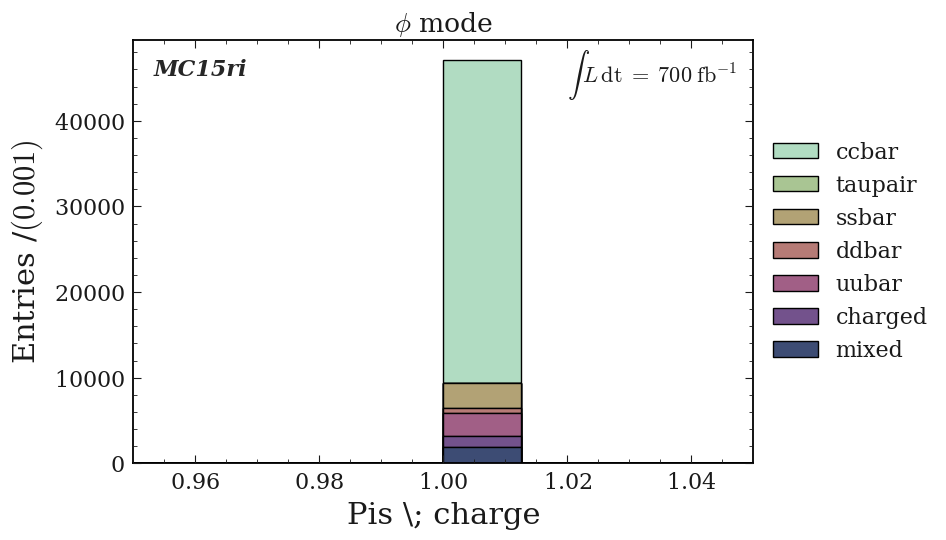

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


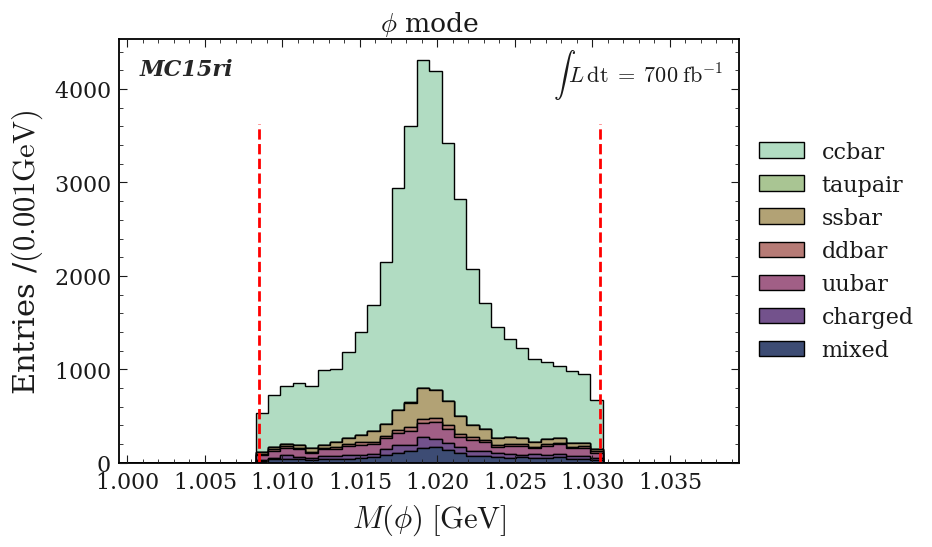

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [48]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut1 = pd_phi.query("(Phi_InvM < 1.0195+0.011) and (Phi_InvM > 1.0195-0.011)")
draw_stack_no_signal(figname='1_vector_cut', df=pd_phi_cut1,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


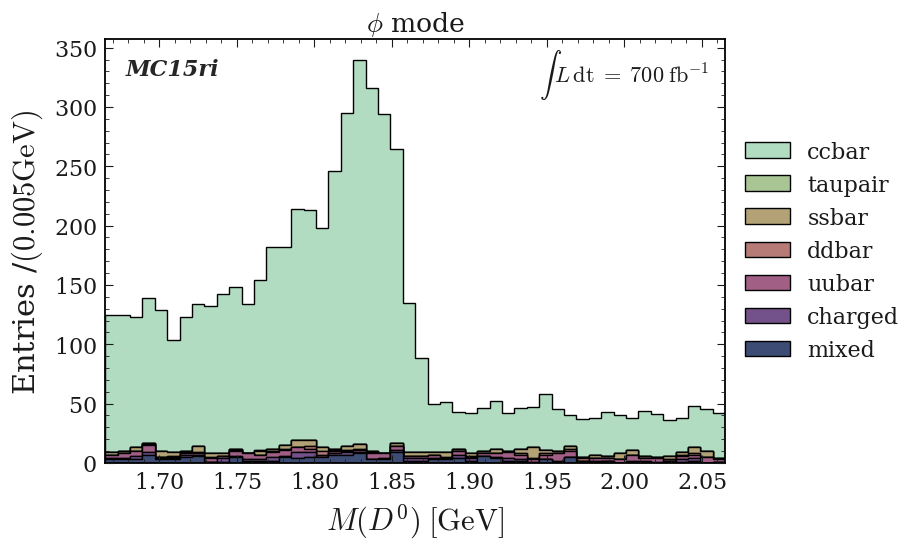

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


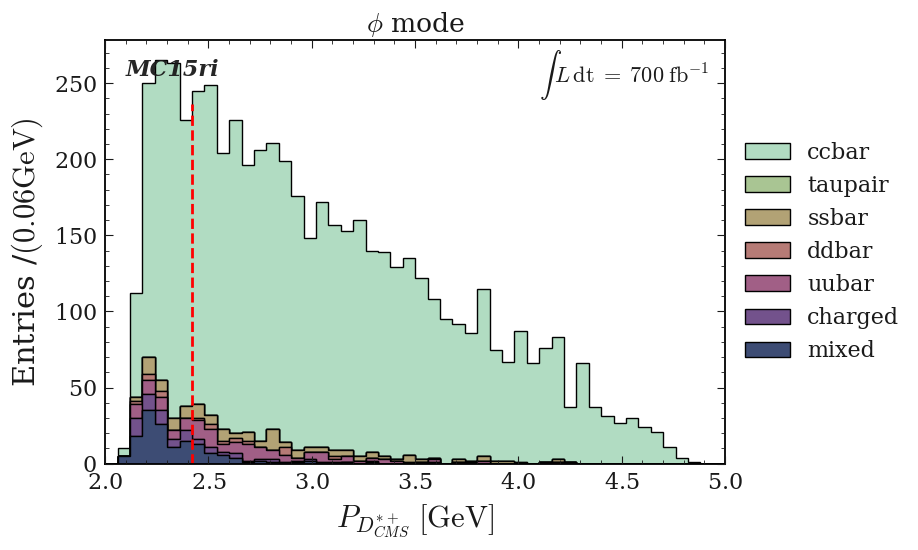

Q
$Q \; [\mathrm{GeV}]$


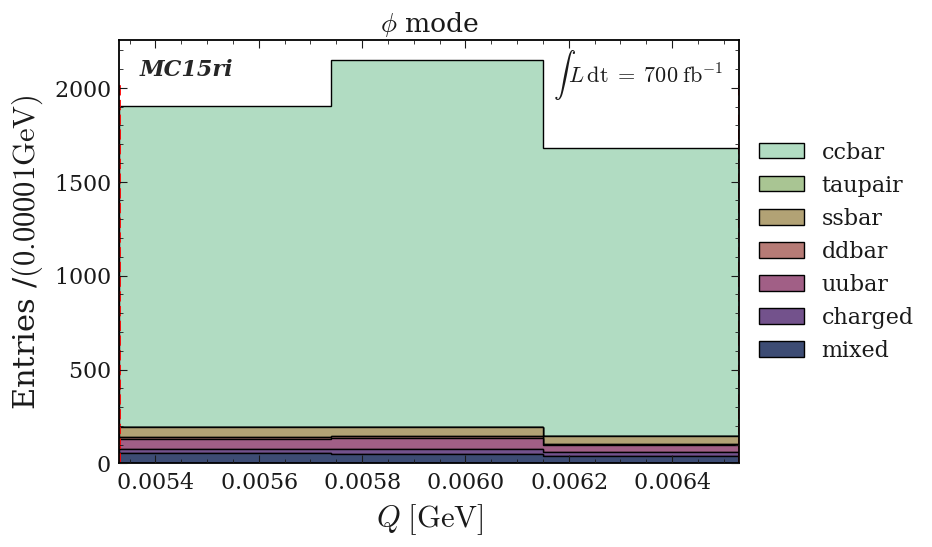

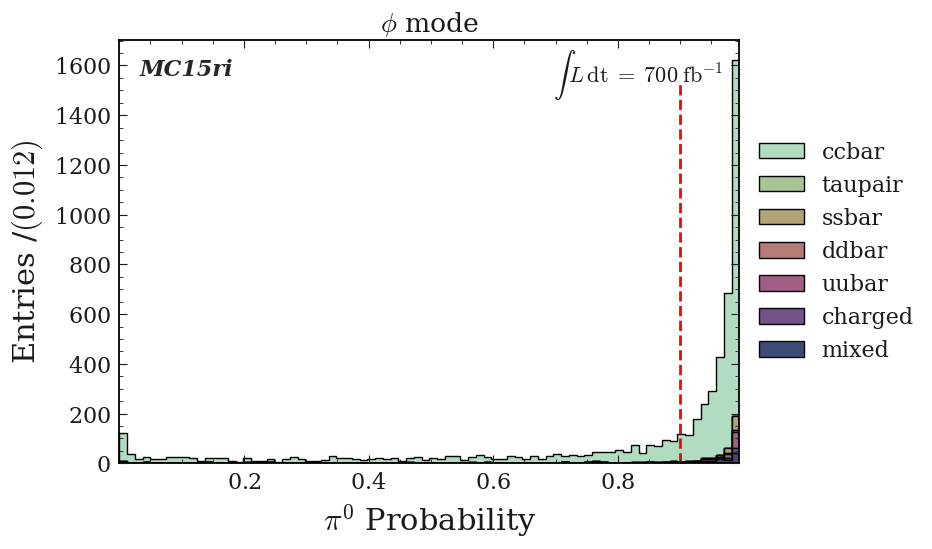

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


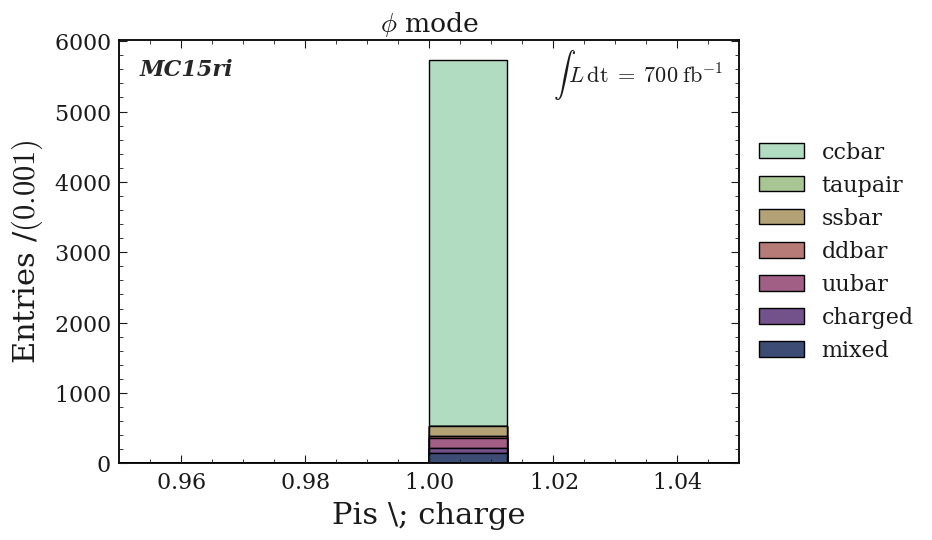

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


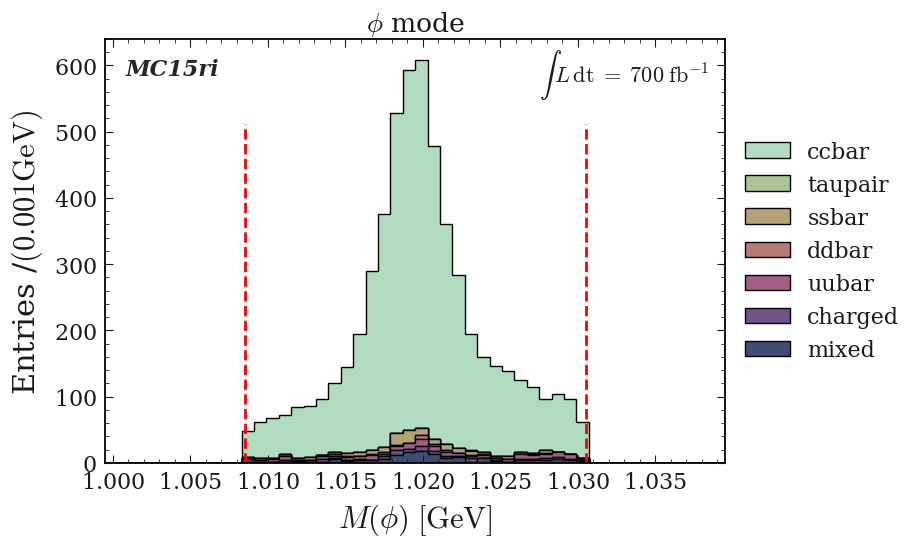

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [49]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut2 = pd_phi_cut1.query("abs(Dstarp_Q - 0.00593)<0.0006 and (Pis_charge==1)")
draw_stack_no_signal(figname='2_Q_cut', df=pd_phi_cut2,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


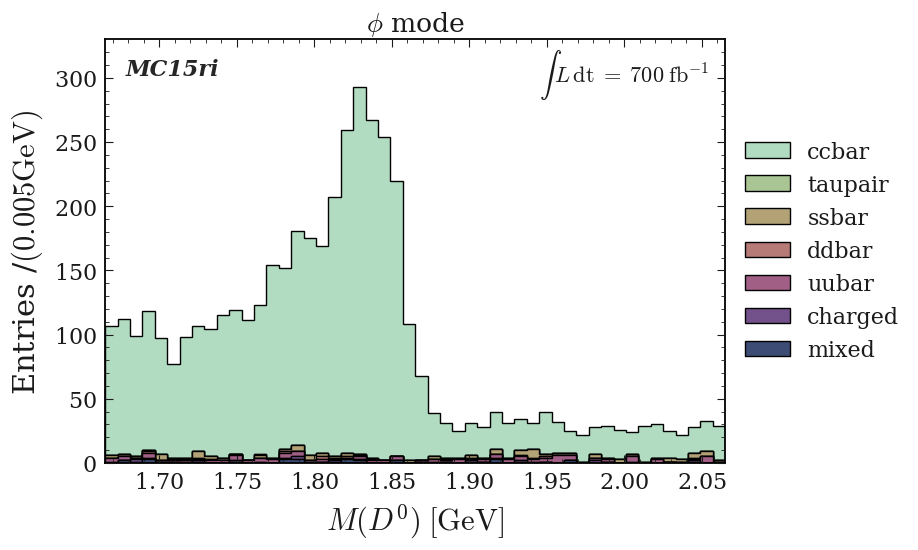

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


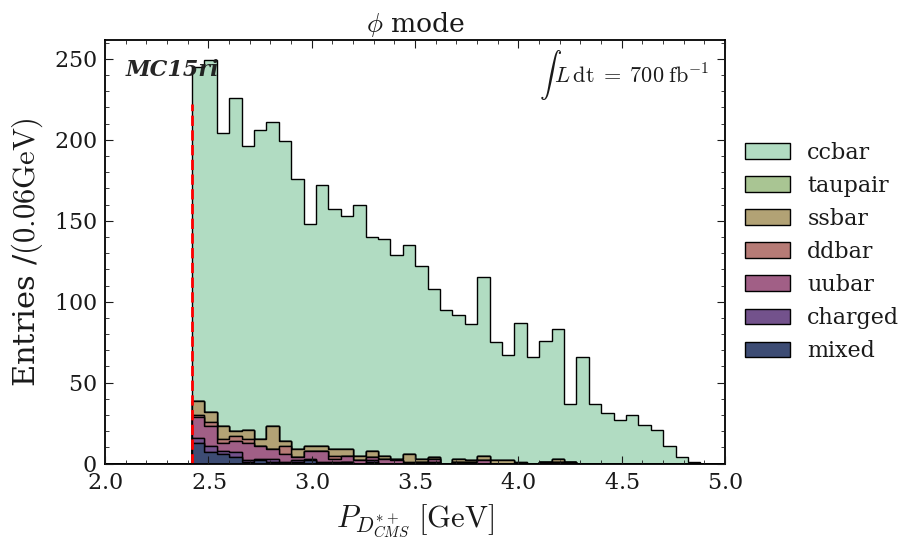

Q
$Q \; [\mathrm{GeV}]$


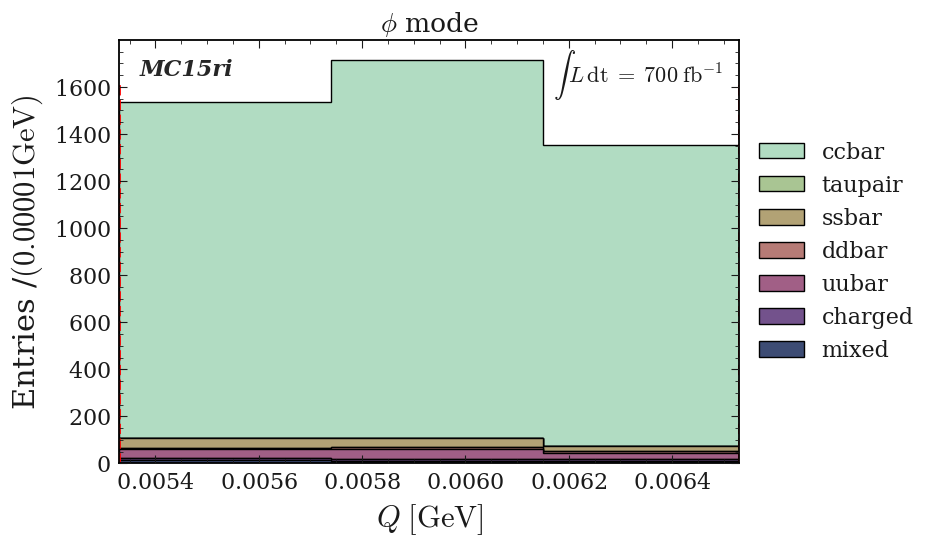

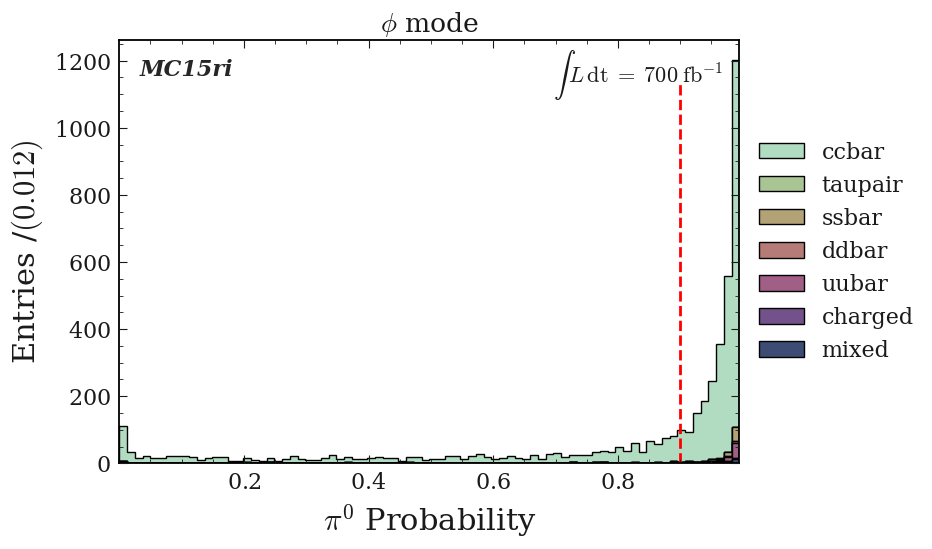

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


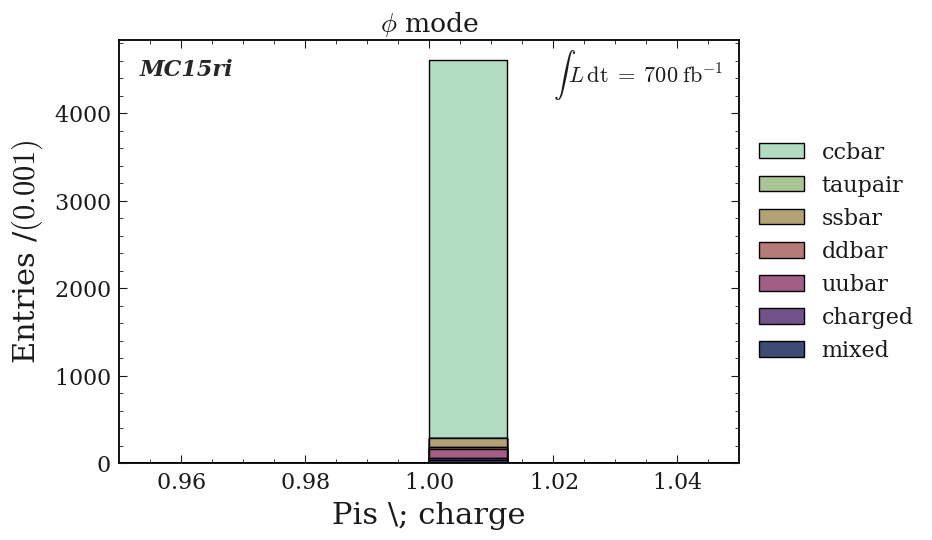

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


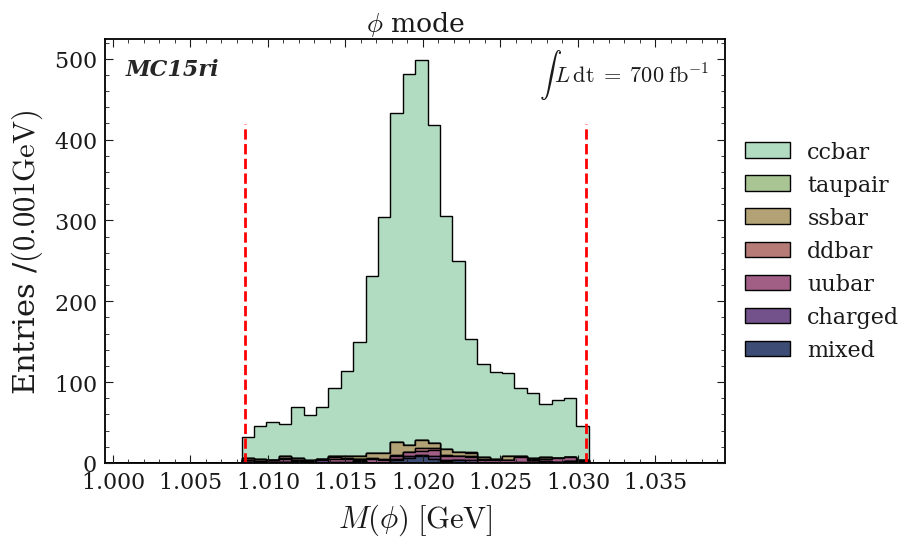

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [54]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut3 = pd_phi_cut2.query("Dstarp_CMS_p > 2.42")
draw_stack_no_signal(figname='3_Dst_CMS_p_cut', df=pd_phi_cut3,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


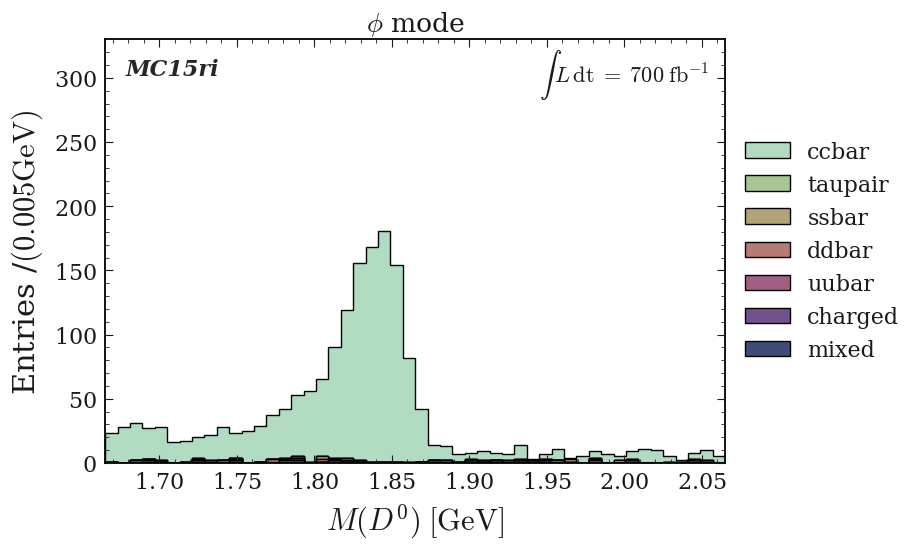

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


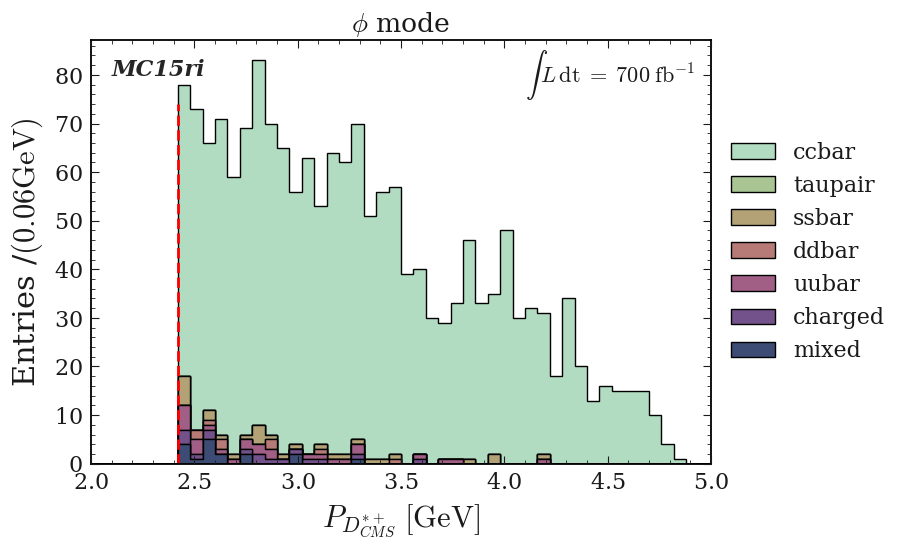

Q
$Q \; [\mathrm{GeV}]$


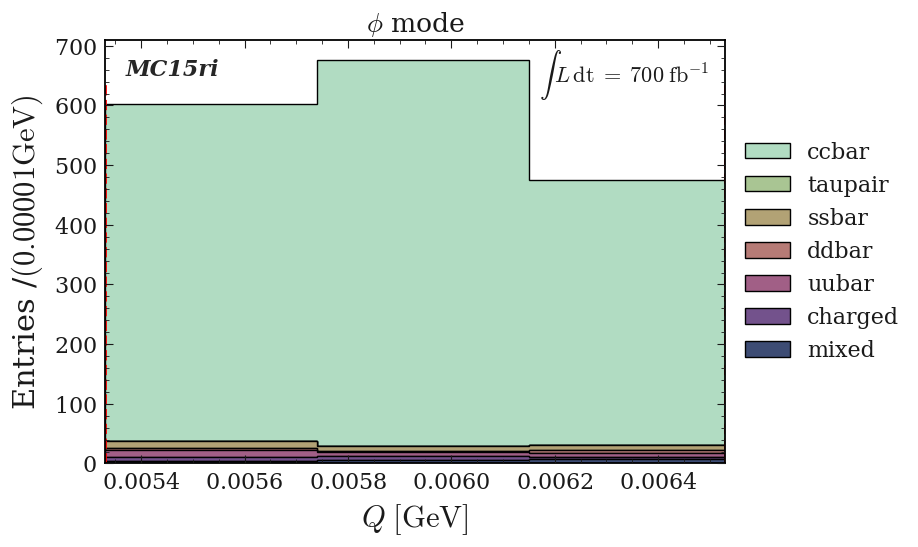

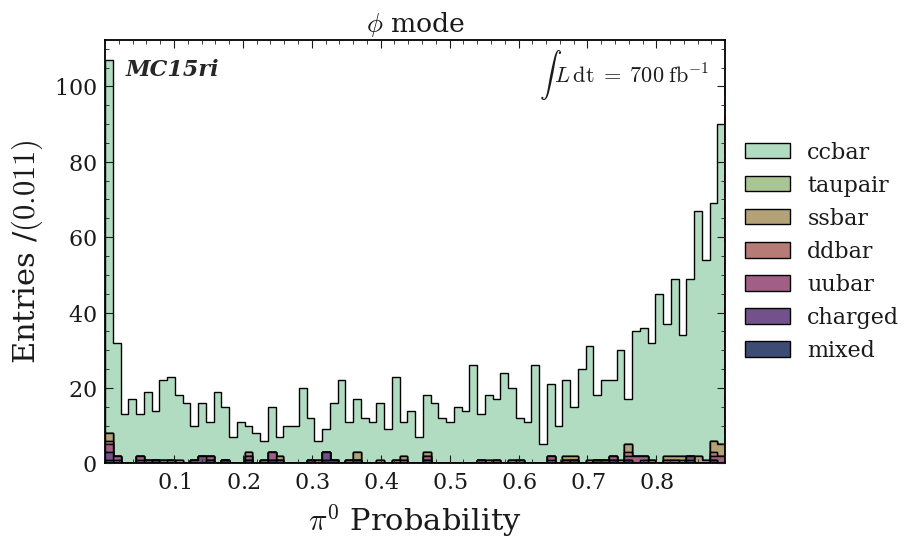

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


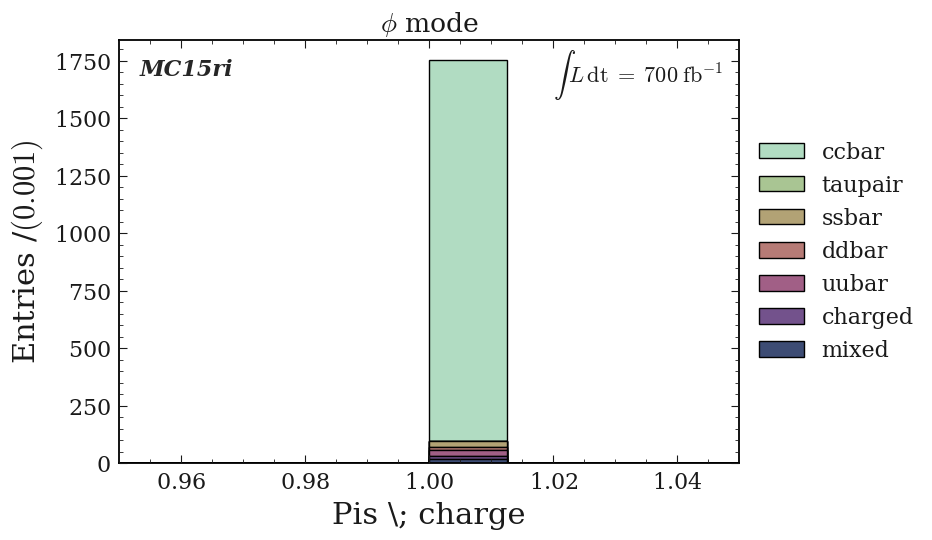

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


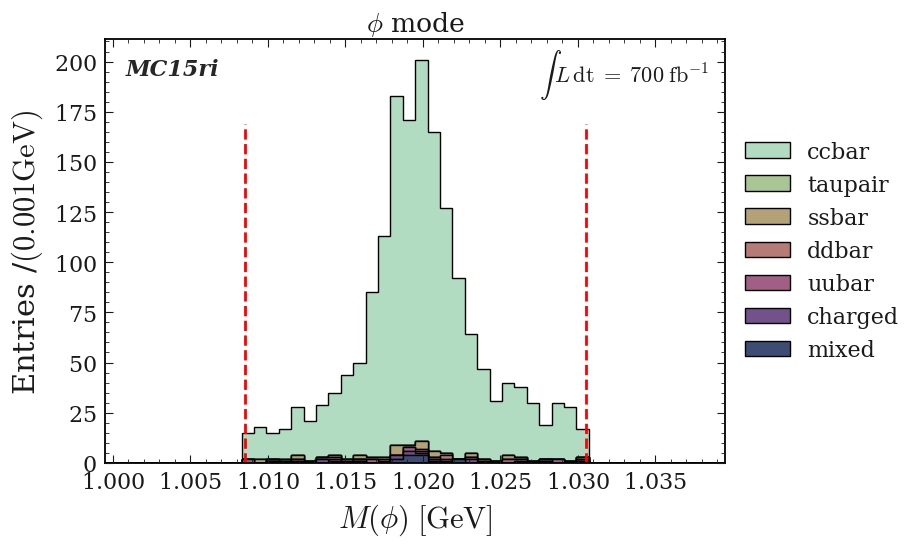

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [55]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut_pi0veto = pd_phi_cut3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname='4_pi0_veto_cut', df=pd_phi_cut_pi0veto,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

## rho

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


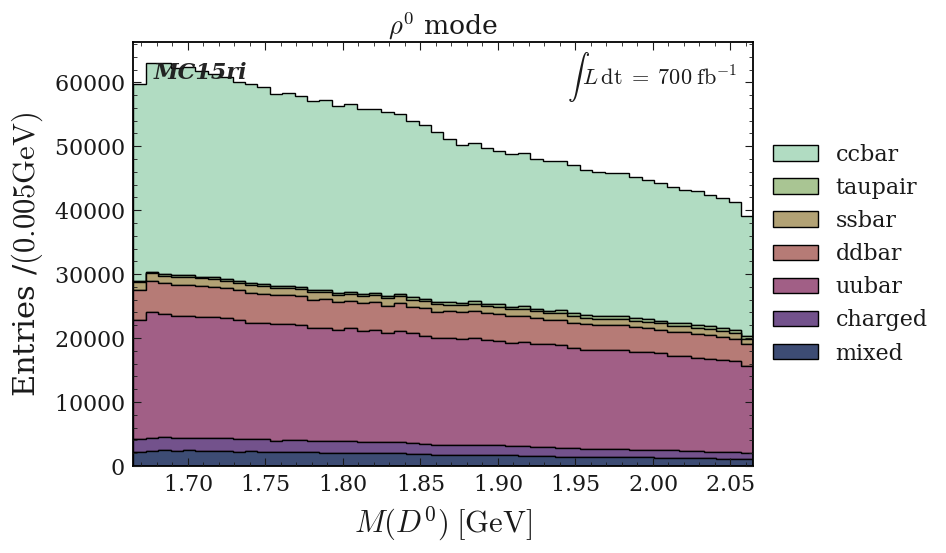

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


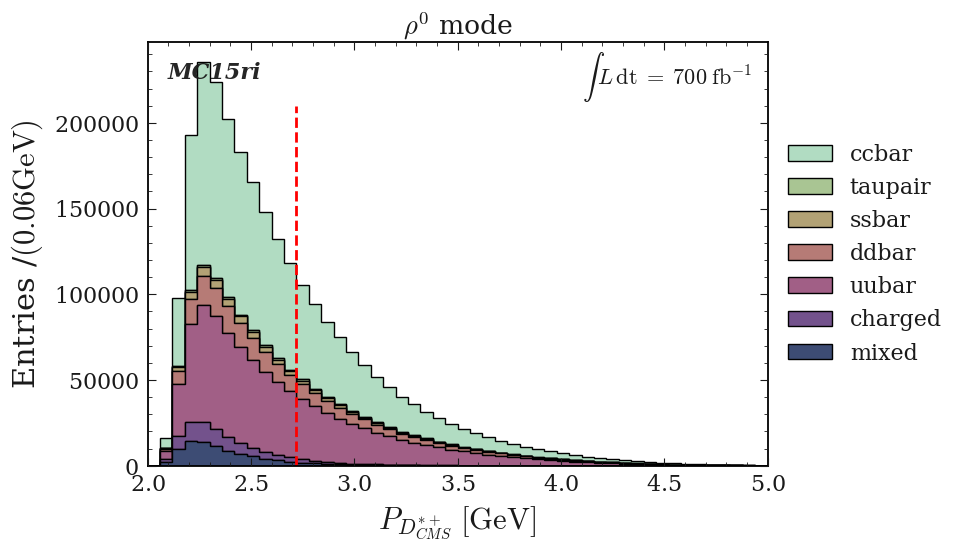

Q
$Q \; [\mathrm{GeV}]$


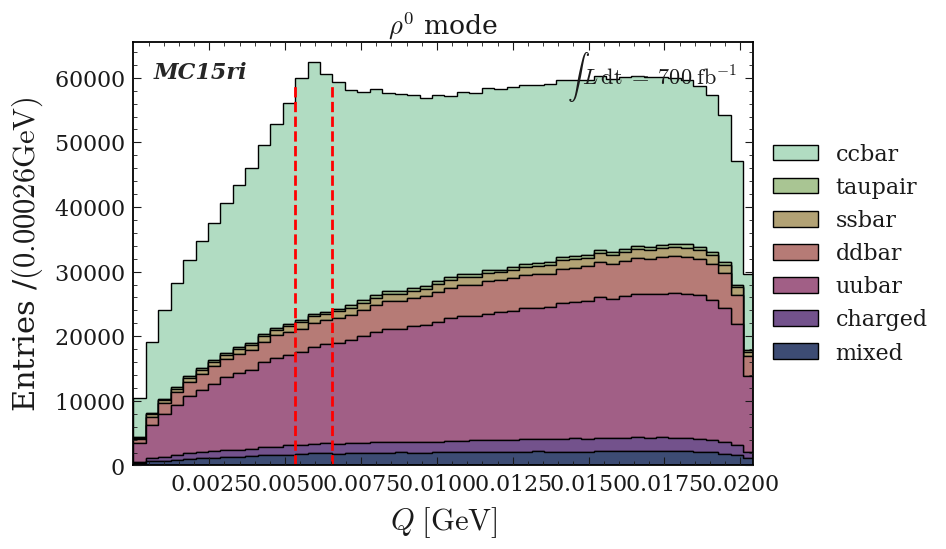

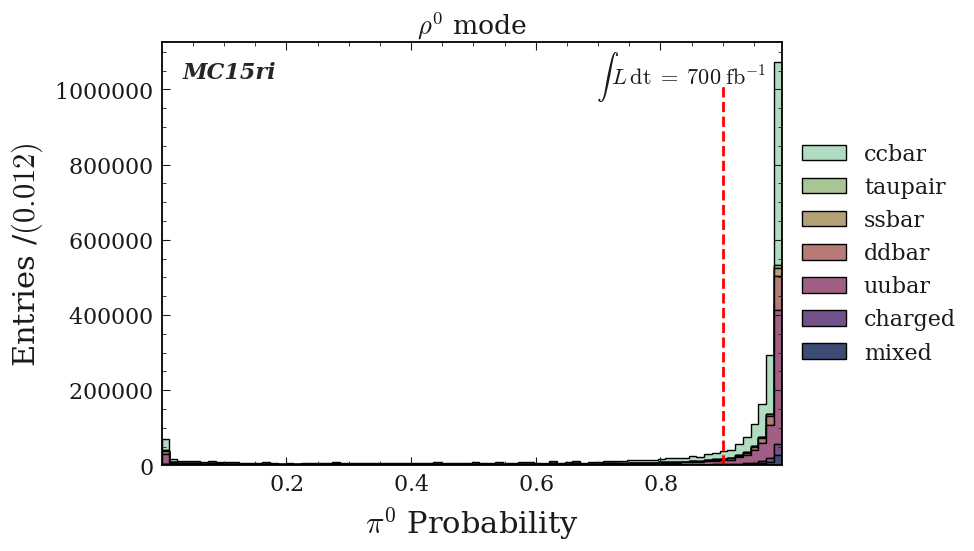

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


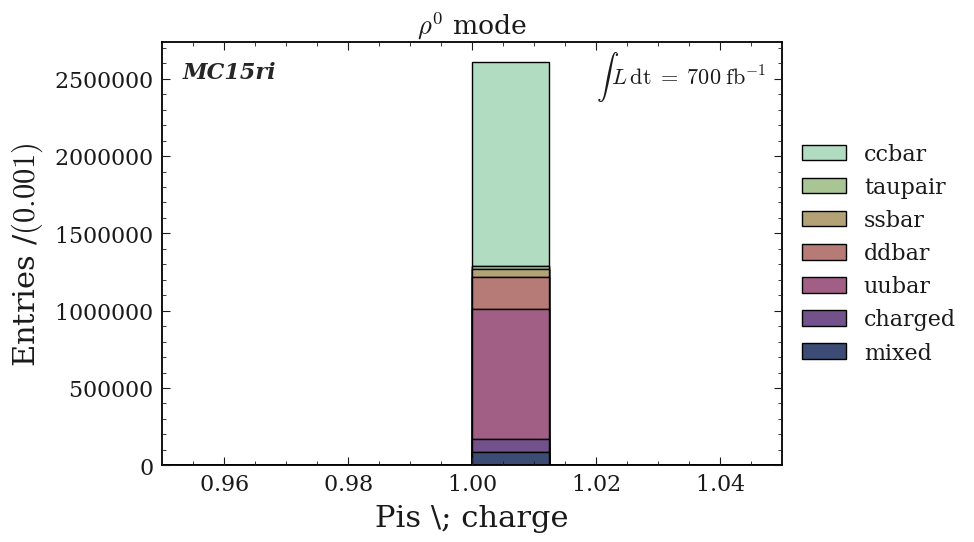

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


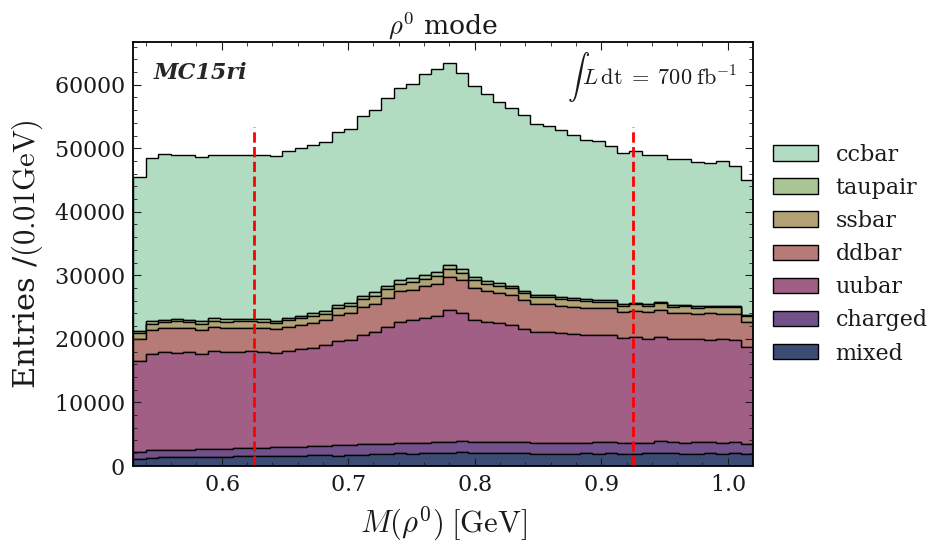

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [59]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

plot_title = r'$\rho^0$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_rho = pd_rho.query("(Rho_InvM < 0.77526+0.245) and (Rho_InvM > 0.77526-0.245) and (Pis_charge==1)  and (D0_M>1.665) and (D0_M<2.065)")
draw_stack_no_signal(figname='Before_0_No_cut',df=pd_rho,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


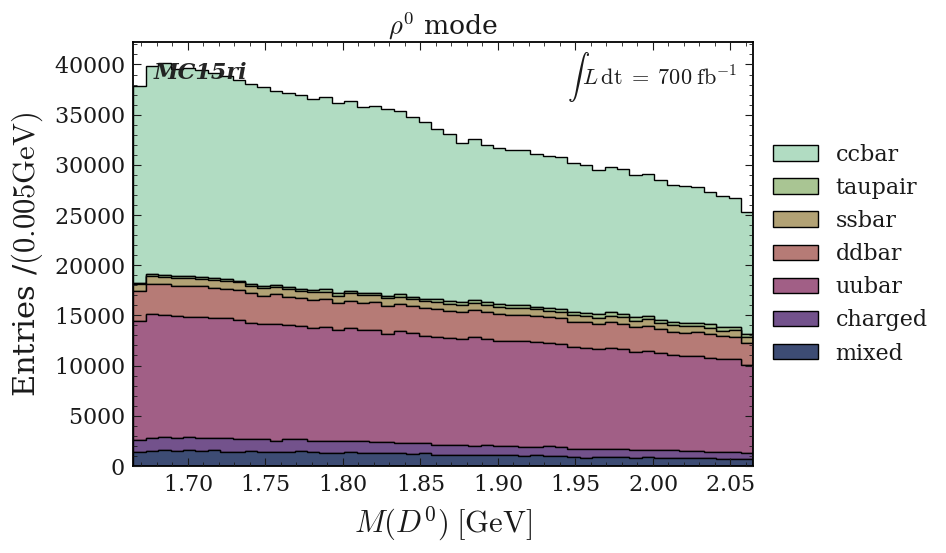

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


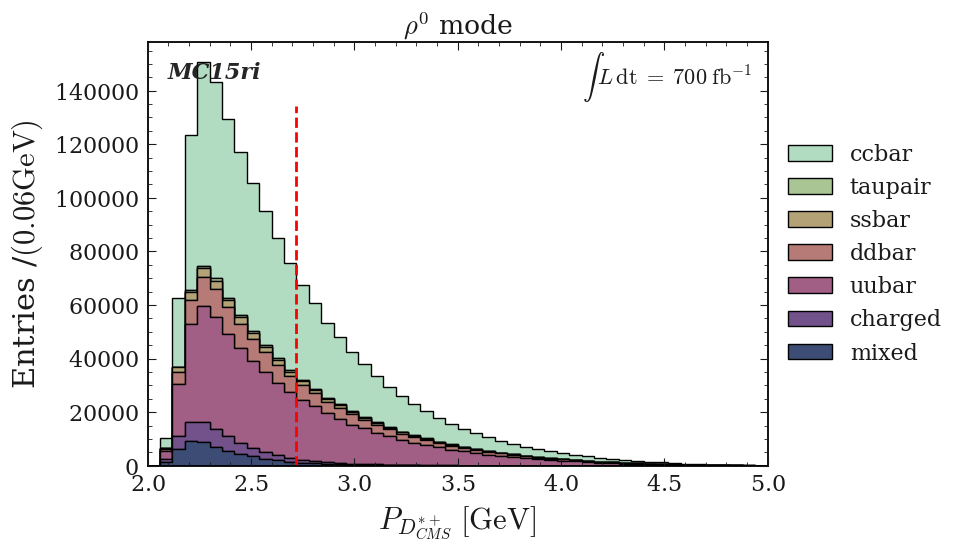

Q
$Q \; [\mathrm{GeV}]$


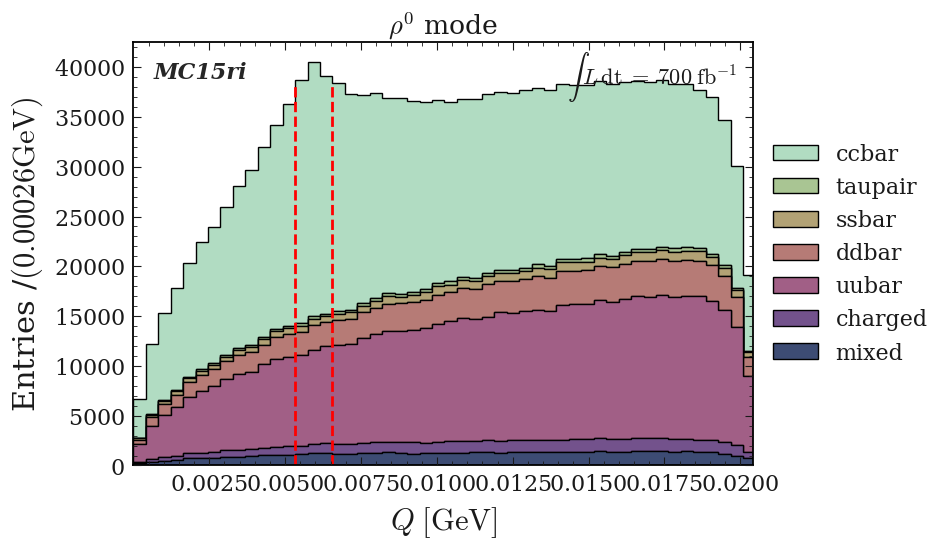

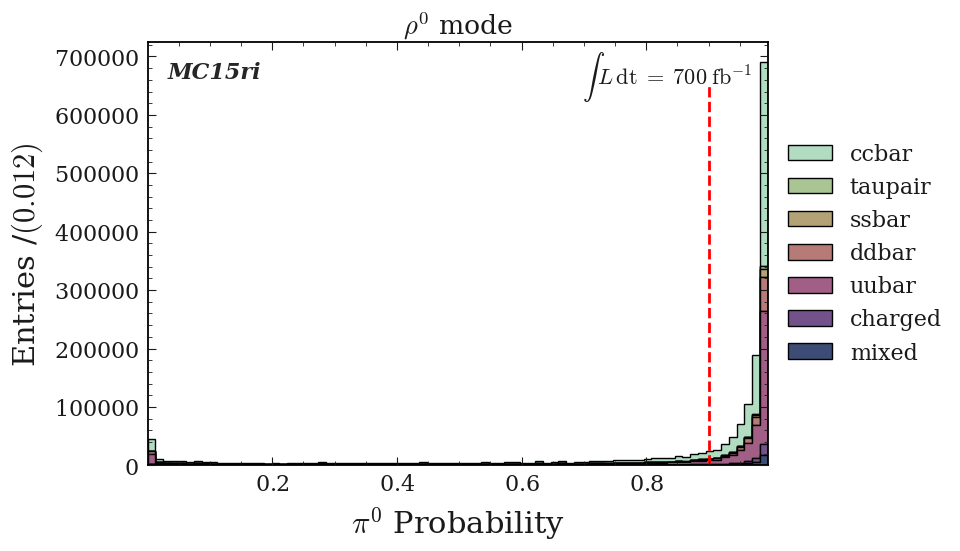

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


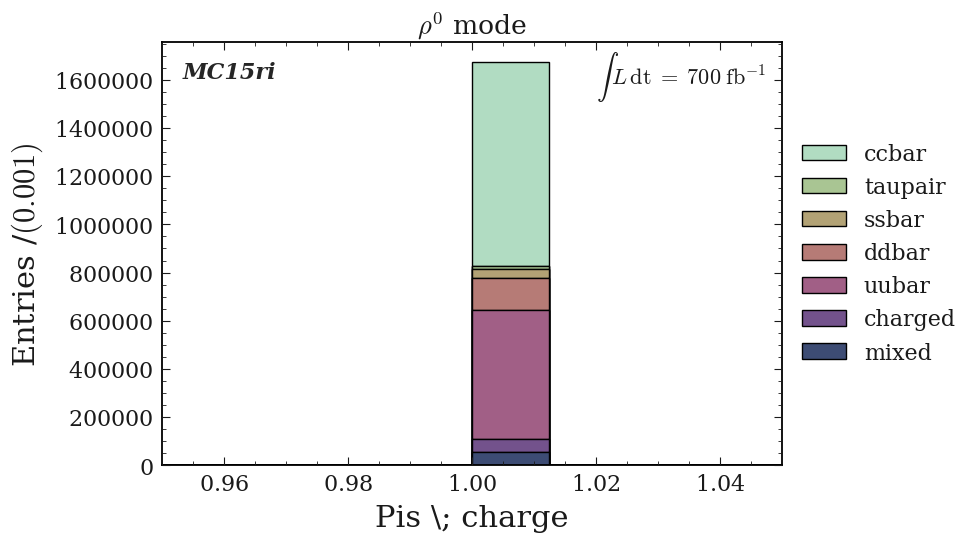

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


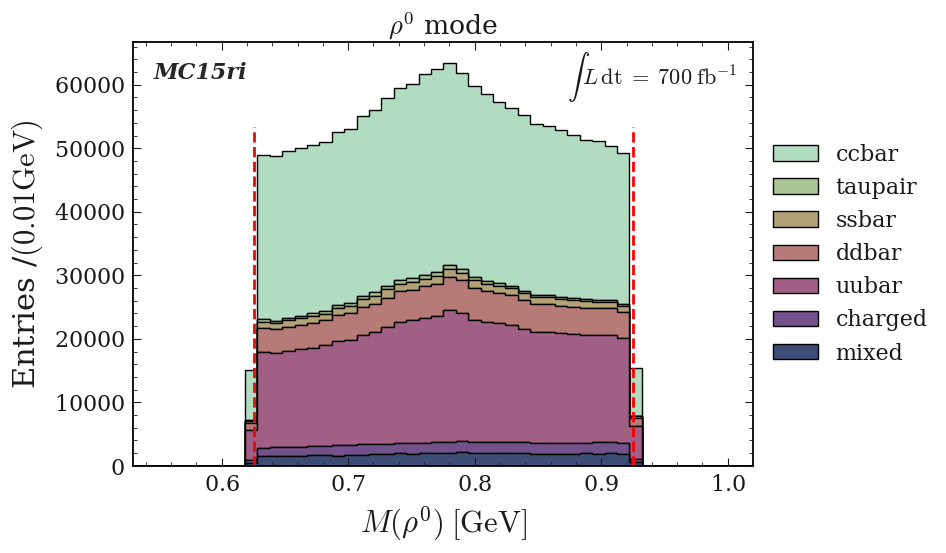

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [60]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut1 = pd_rho.query("abs(Rho_InvM - 0.77526)<0.150")
draw_stack_no_signal(figname='1_vector_cut',df=pd_rho_cut1,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


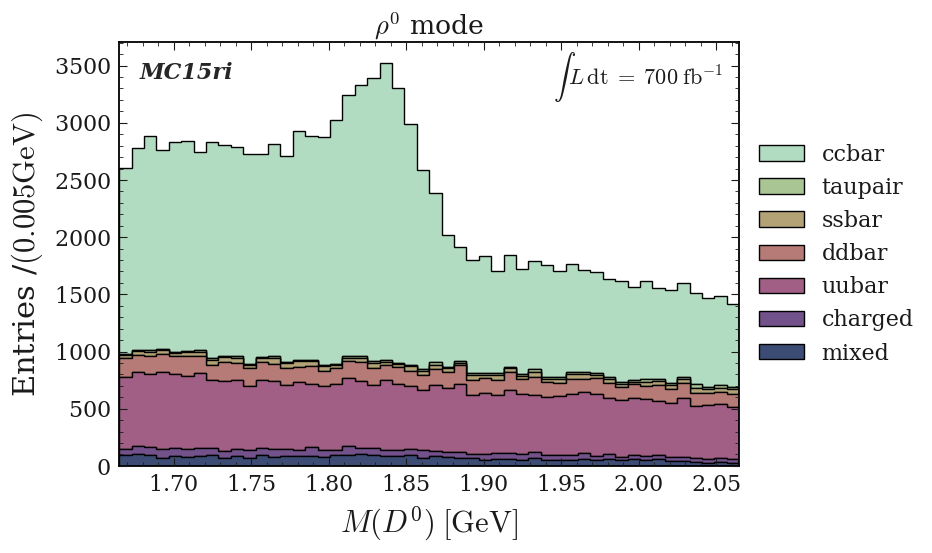

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


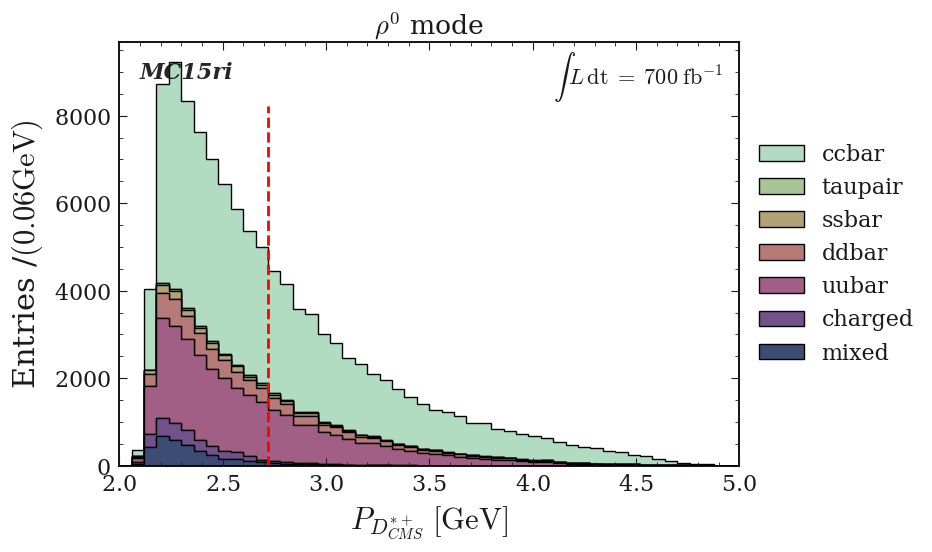

Q
$Q \; [\mathrm{GeV}]$


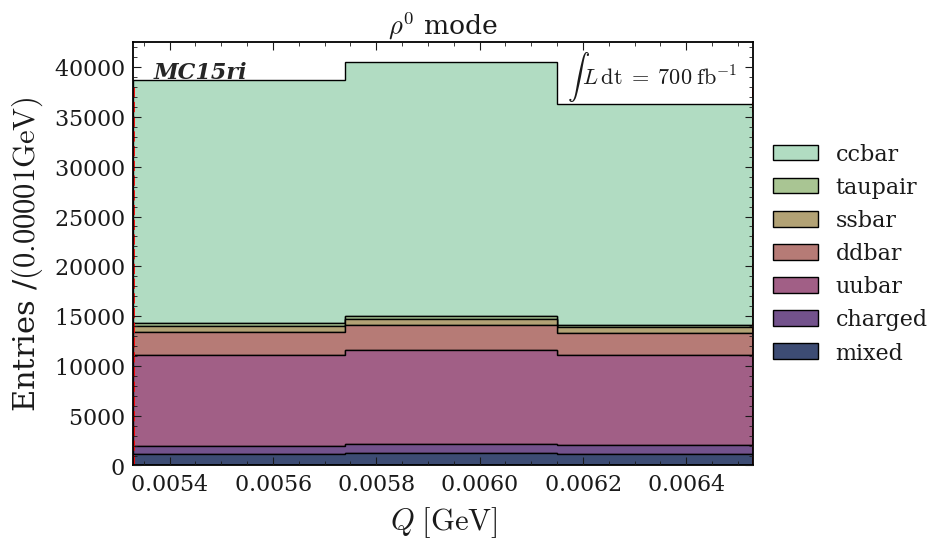

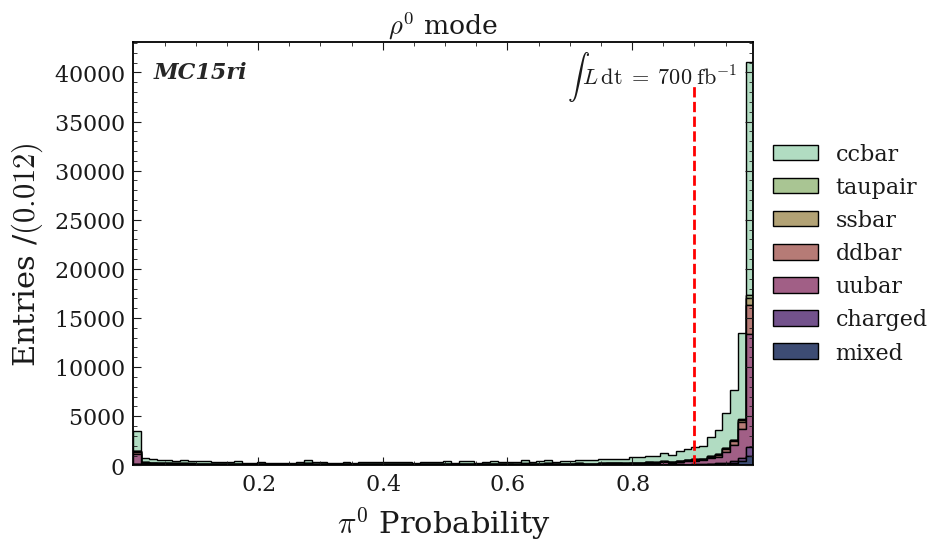

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


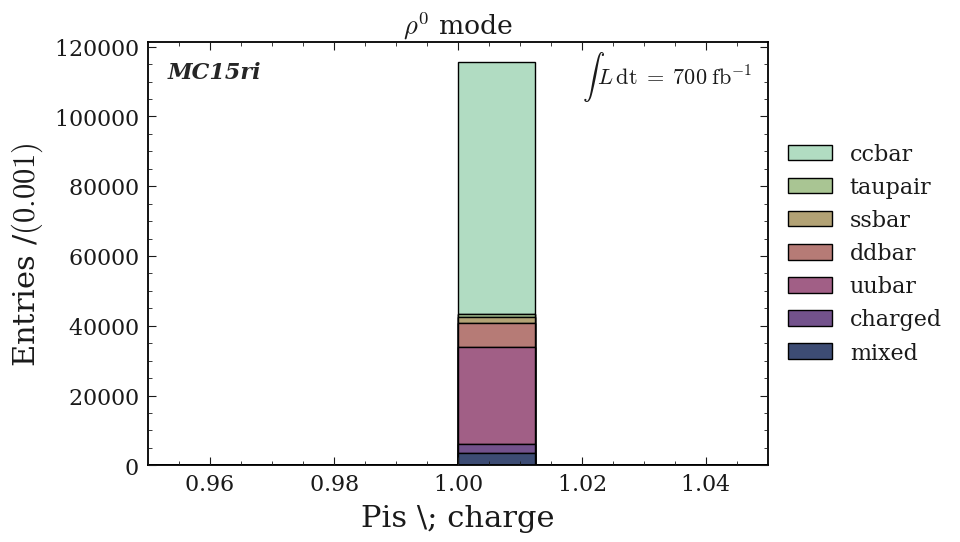

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


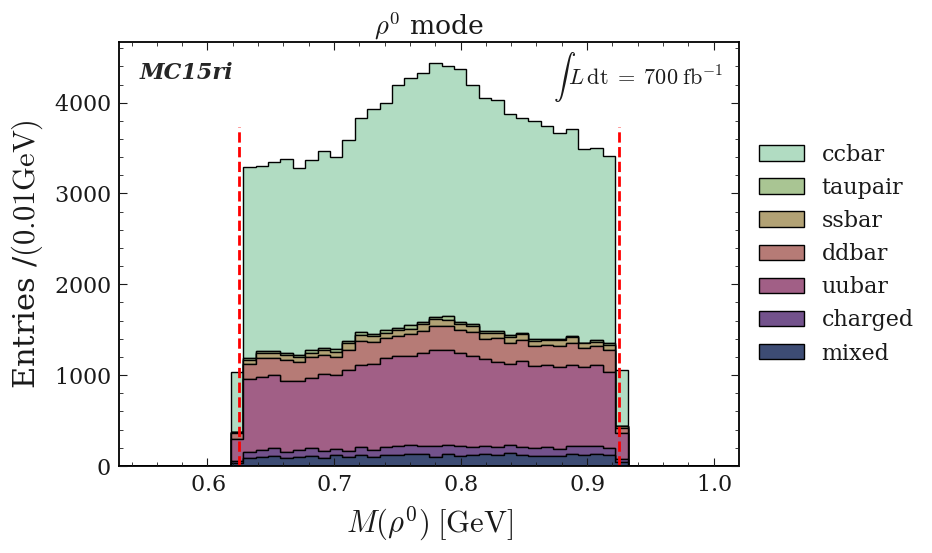

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [61]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut2 = pd_rho_cut1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname='2_Q_cut',df=pd_rho_cut2,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


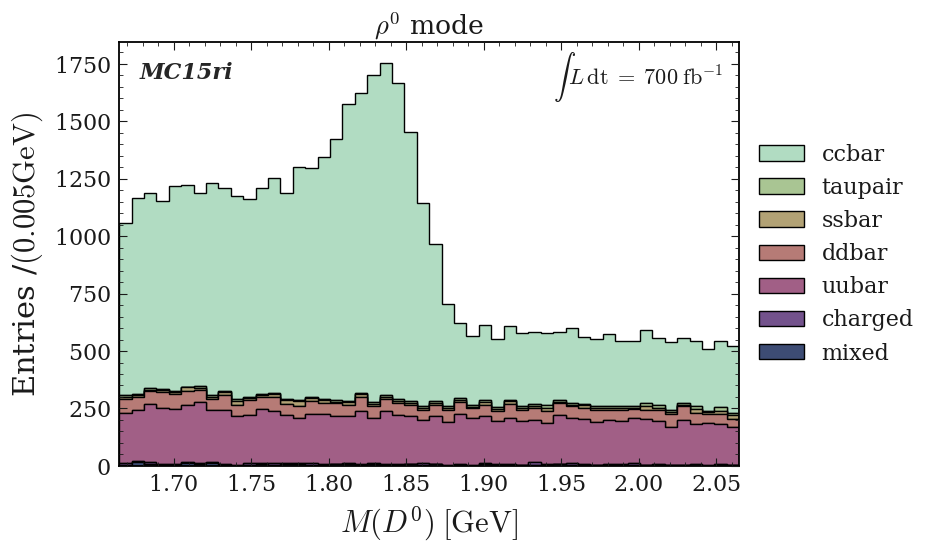

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


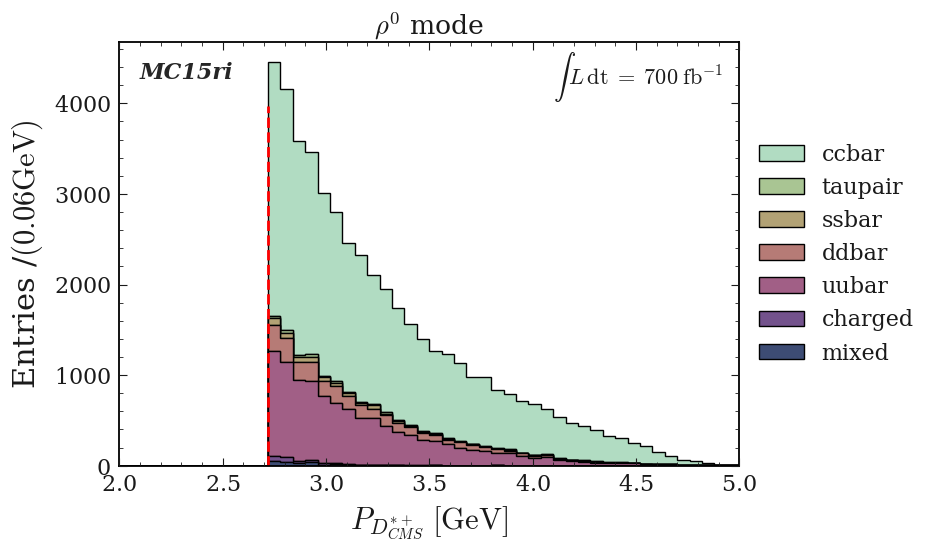

Q
$Q \; [\mathrm{GeV}]$


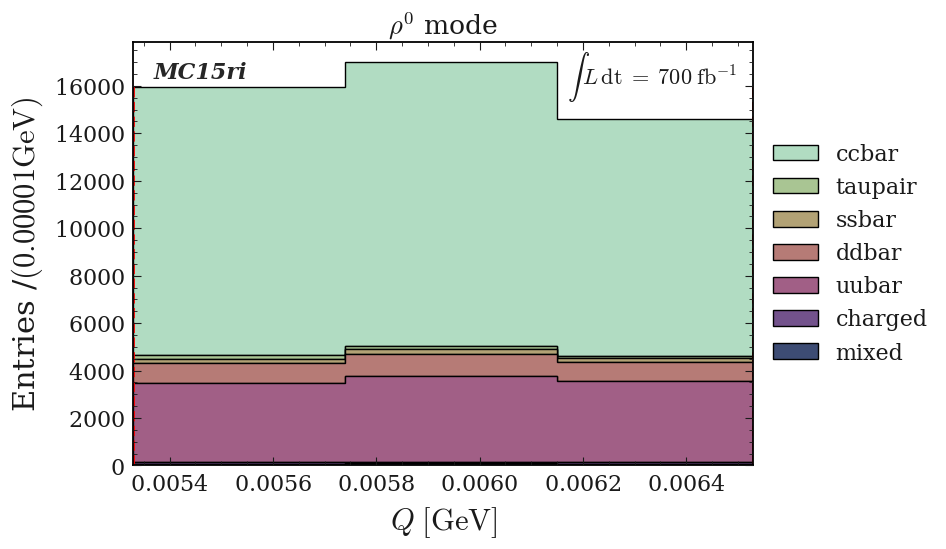

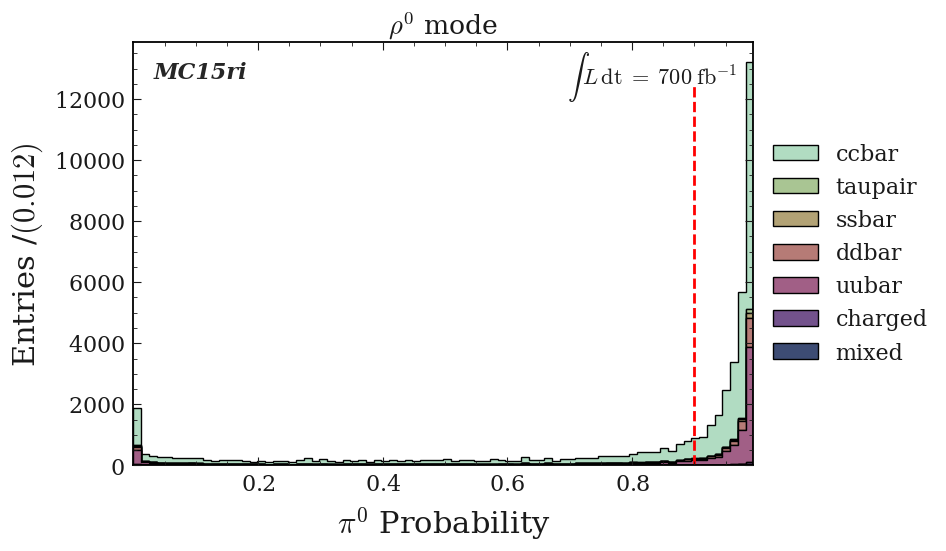

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


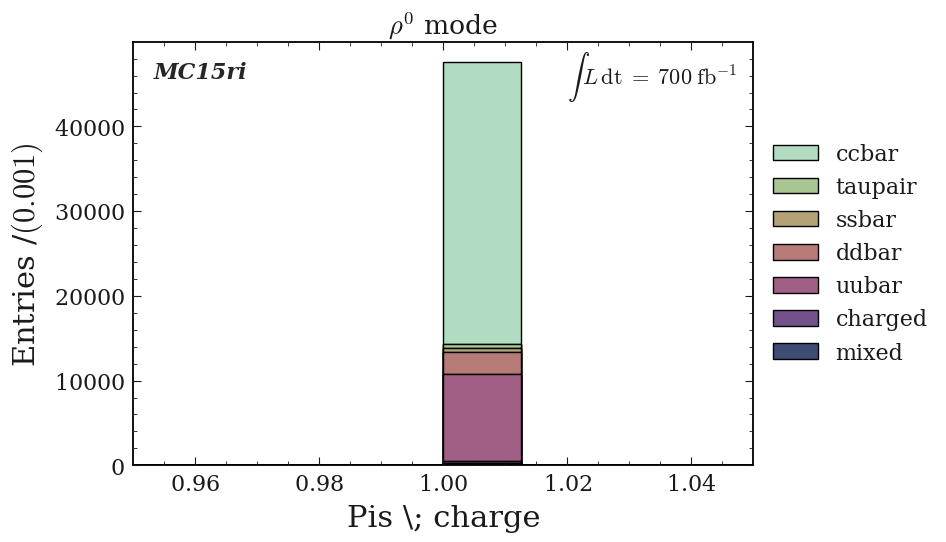

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


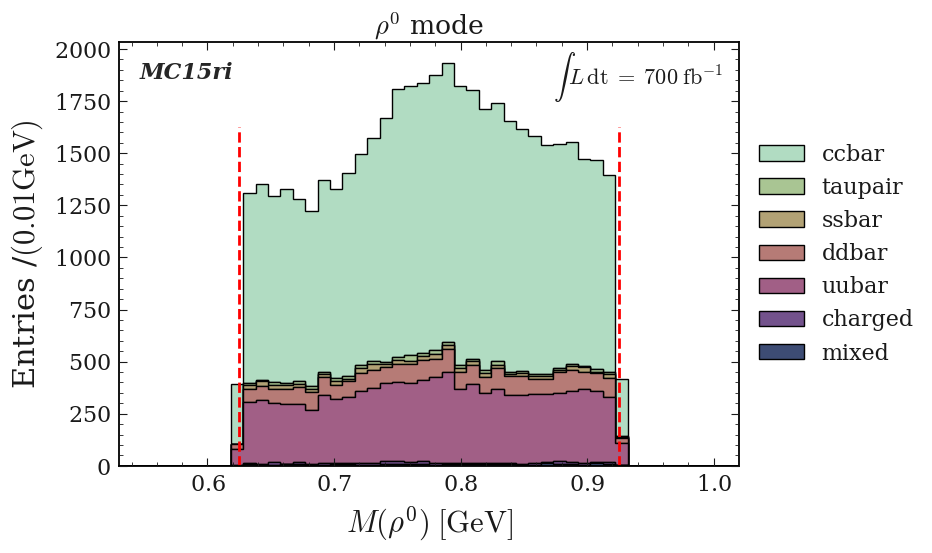

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [62]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut3 = pd_rho_cut2.query("Dstarp_CMS_p > 2.72")
draw_stack_no_signal(figname='3_CMS_p_cut',df=pd_rho_cut3,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


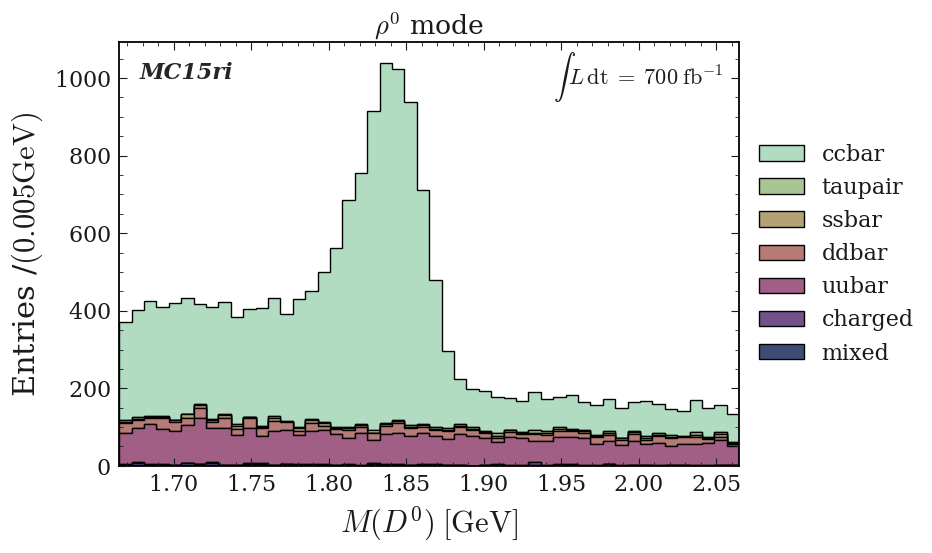

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


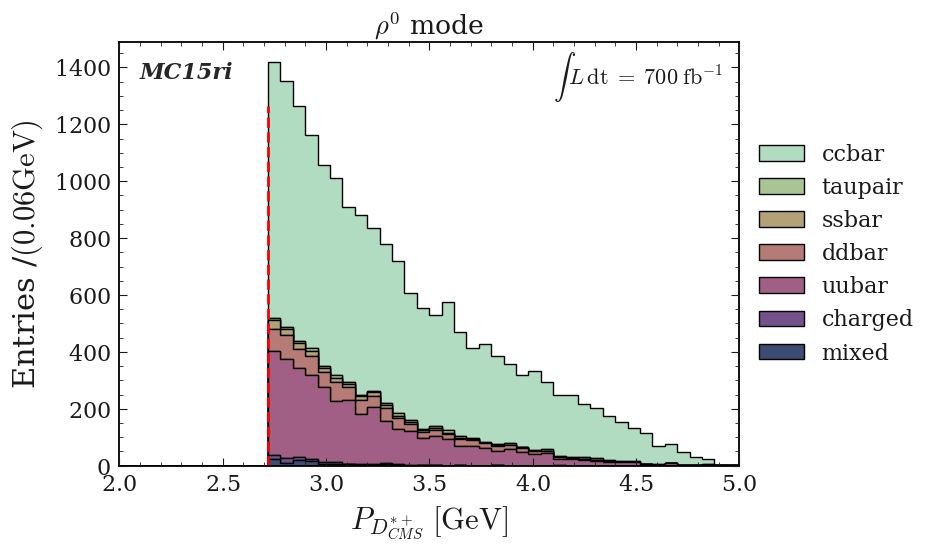

Q
$Q \; [\mathrm{GeV}]$


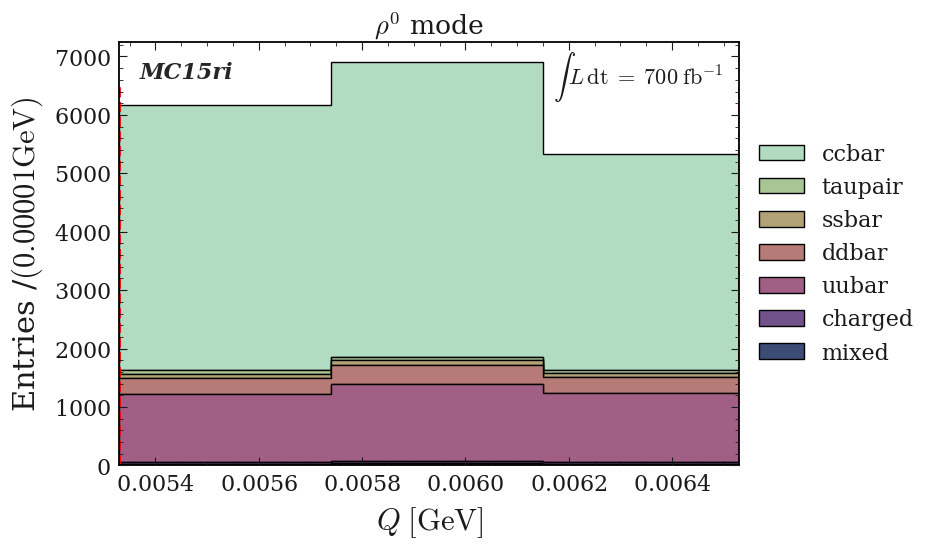

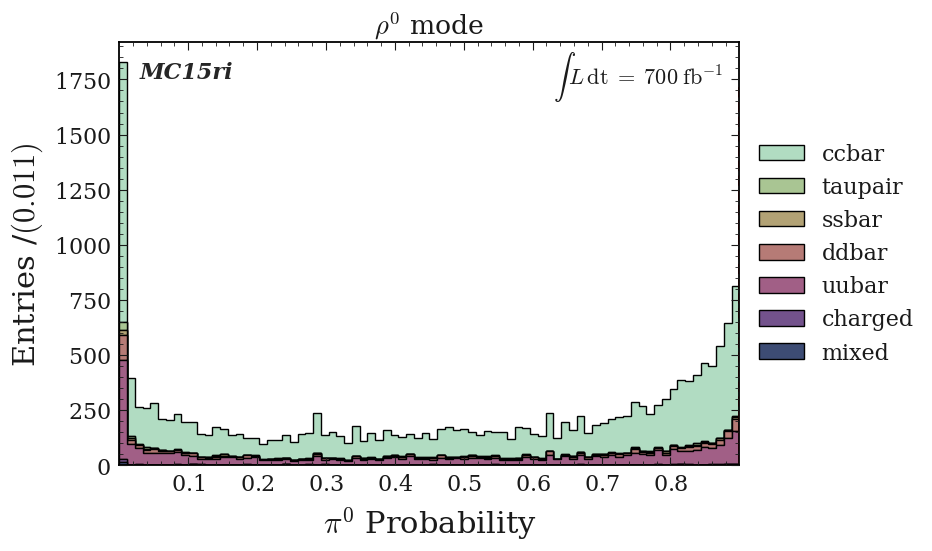

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


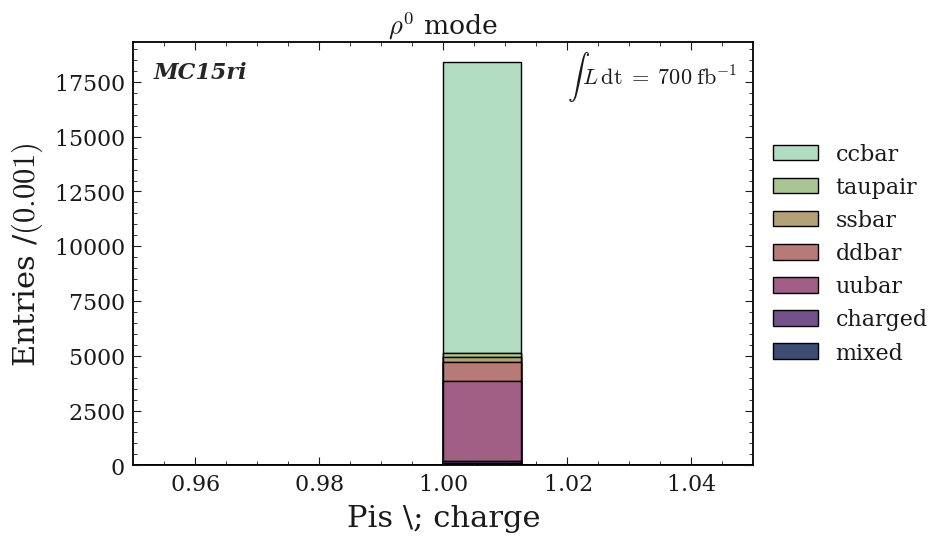

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


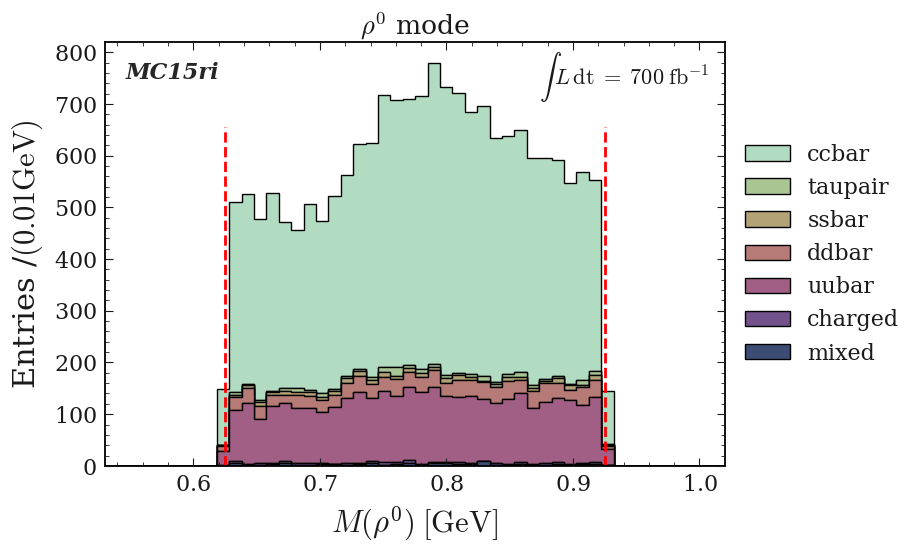

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [63]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut_pi0veto = pd_rho_cut3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname='Final_4_pi0_veto_cut',df=pd_rho_cut_pi0veto,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

In [64]:
pd_rho_cut_pi0veto.describe()

,D0_M,Dstarp_Q,D0_cosHel_0,Dstarp_CMS_p,gamma_E,gamma_clusterSecondMoment,__ncandidates__,__experiment__,__run__,__event__,Dstarp_isSignal,D0_isSignal,Pi0_Prob,Eta_Prob,Pis_charge,Rho_InvM
count,18409.000000,18409.000000,18409.000000,18409.000000,18409.000000,18409.000000,18409.000000,18409.0,18409.0,1.840900e+04,16954.0,17121.000000,18409.000000,18403.000000,18409.0,18409.000000
mean,1.825771,0.005922,-0.095675,3.333205,1.590862,0.984008,1.532457,1003.0,0.0,1.378542e+08,0.0,0.000117,0.478366,0.550045,1.0,0.780653
std,0.094495,0.000335,0.676107,0.490824,0.927261,0.195545,1.008247,0.0,0.0,8.168172e+07,0.0,0.010808,0.319273,0.311506,0.0,0.082151
min,1.665061,0.005330,-0.999986,2.720005,0.298135,0.039062,1.000000,1003.0,0.0,2.303200e+04,0.0,0.000000,0.000003,0.000076,1.0,0.625280
25%,1.755271,0.005643,-0.721981,2.928518,0.700277,0.859375,1.000000,1003.0,0.0,6.617741e+07,0.0,0.000000,0.150744,0.275045,1.0,0.716241
50%,1.825774,0.005921,-0.262082,3.211076,1.570971,0.976562,1.000000,1003.0,0.0,1.382818e+08,0.0,0.000000,0.522025,0.549623,1.0,0.784191
75%,1.865941,0.006200,0.615351,3.639396,2.310312,1.093750,2.000000,1003.0,0.0,2.070328e+08,0.0,0.000000,0.793247,0.855528,1.0,0.847989
max,2.064874,0.006530,0.999982,6.481069,6.019554,1.484375,18.000000,1003.0,0.0,3.209958e+08,0.0,1.000000,0.899849,0.999713,1.0,0.925236


## antiKstar

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


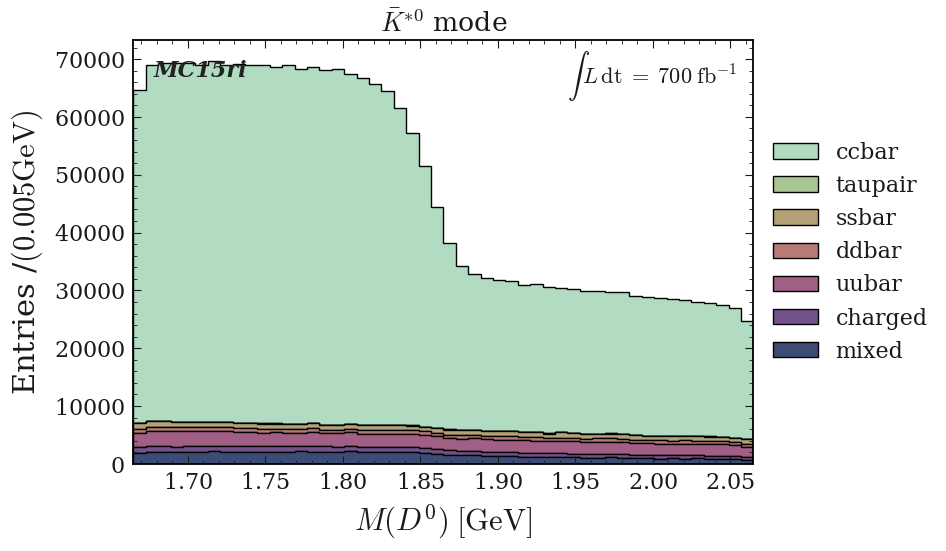

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


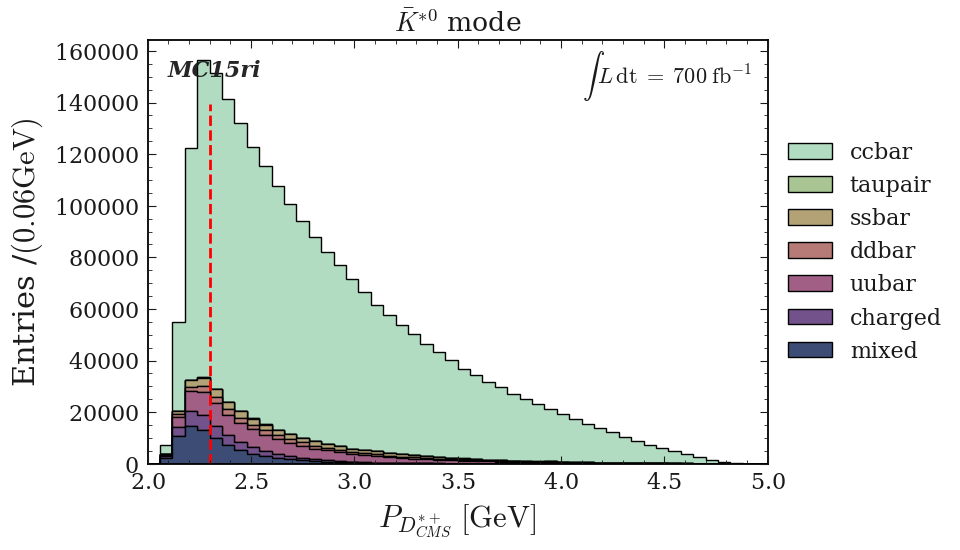

Q
$Q \; [\mathrm{GeV}]$


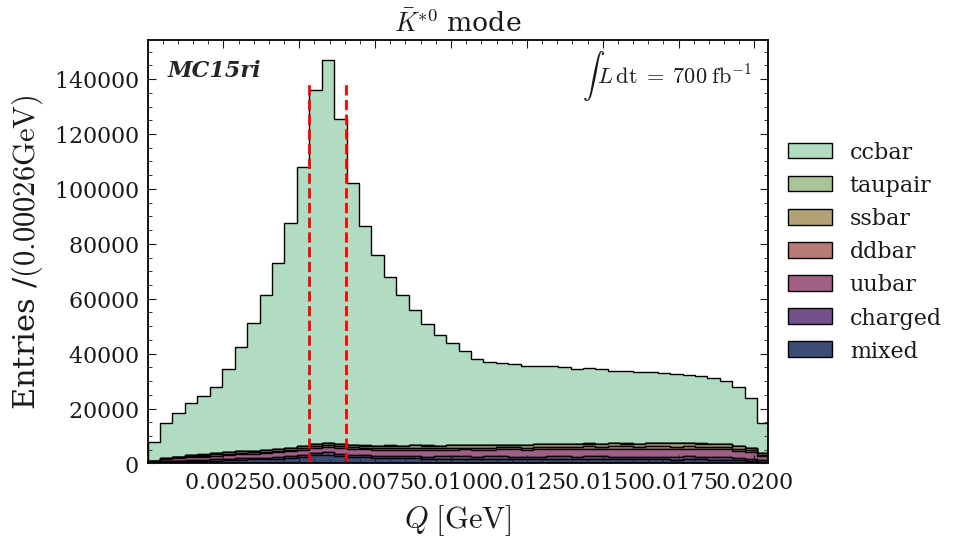

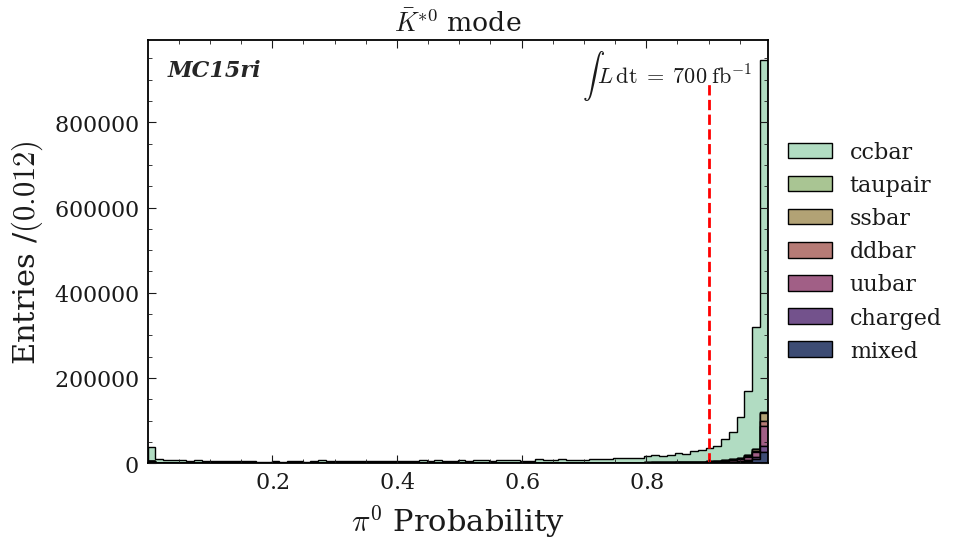

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


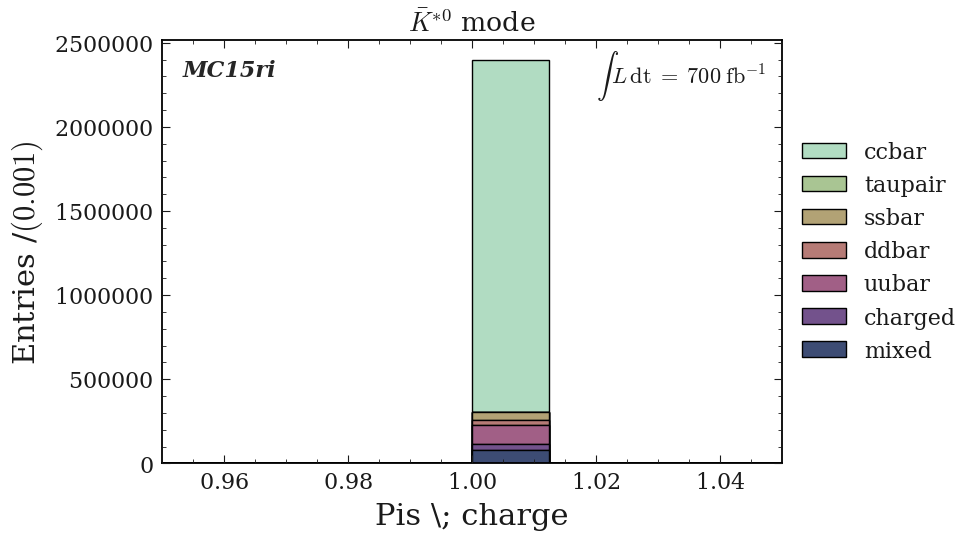

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


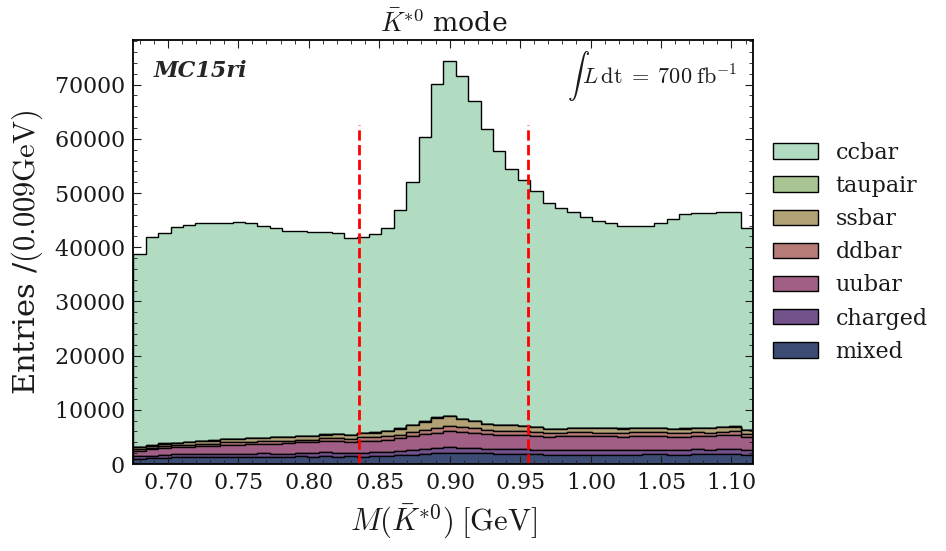

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [72]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']

plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']
# var_name['antiKstar_InvM'] = r"M(\bar{K^{*0})"
# print(var_name['antiKstar_InvM'])

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

pd_antiKstar = pd_antiKstar.query("(antiKstar_InvM < 0.89555+0.220) and (antiKstar_InvM > 0.89555-0.220) and (Pis_charge==1)")
draw_stack_no_signal(figname="0_No_cut",df=pd_antiKstar,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


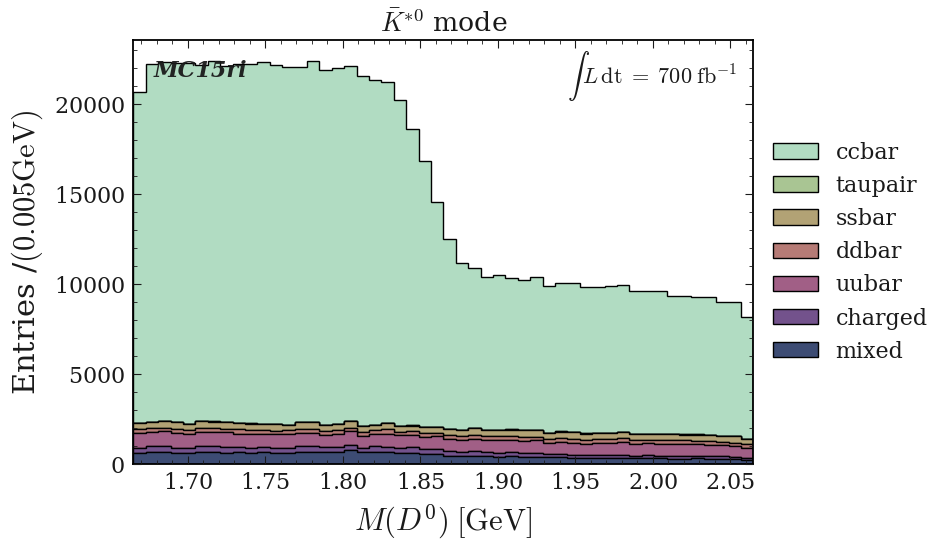

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


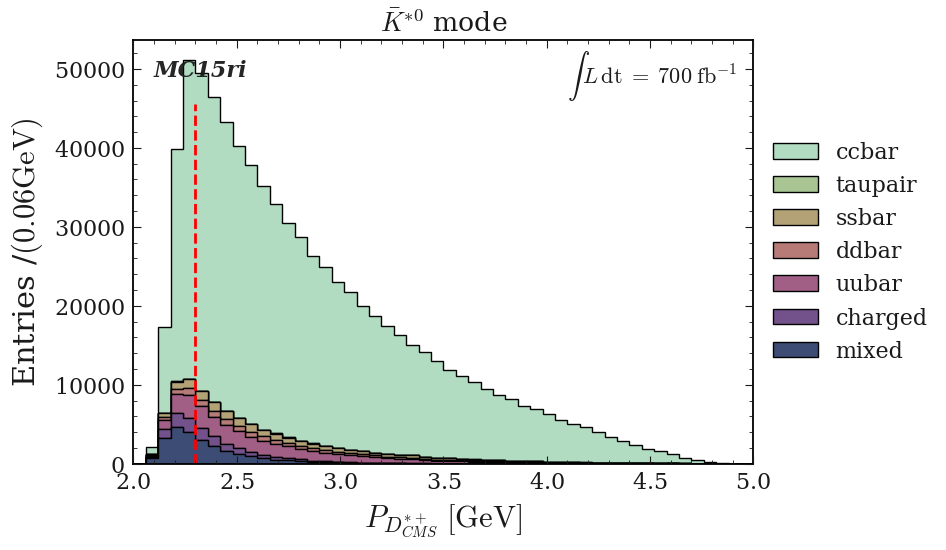

Q
$Q \; [\mathrm{GeV}]$


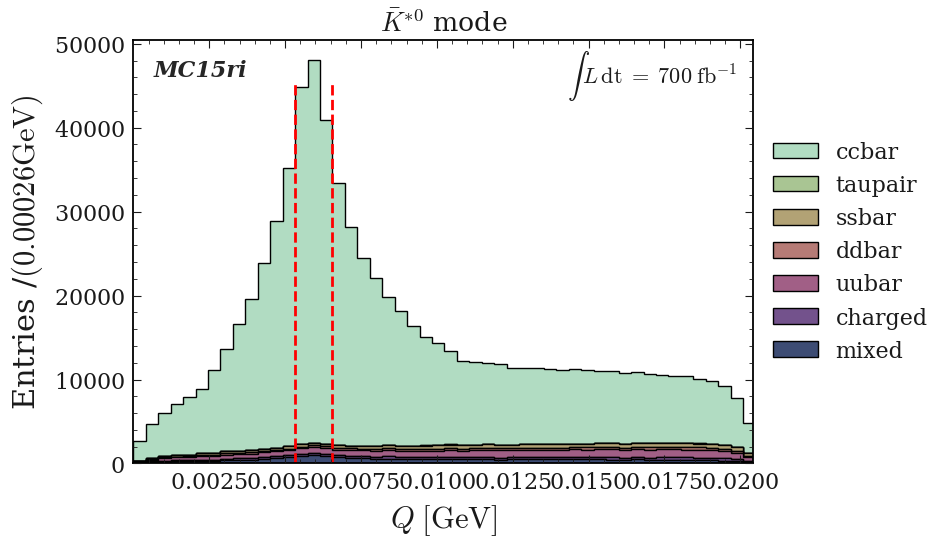

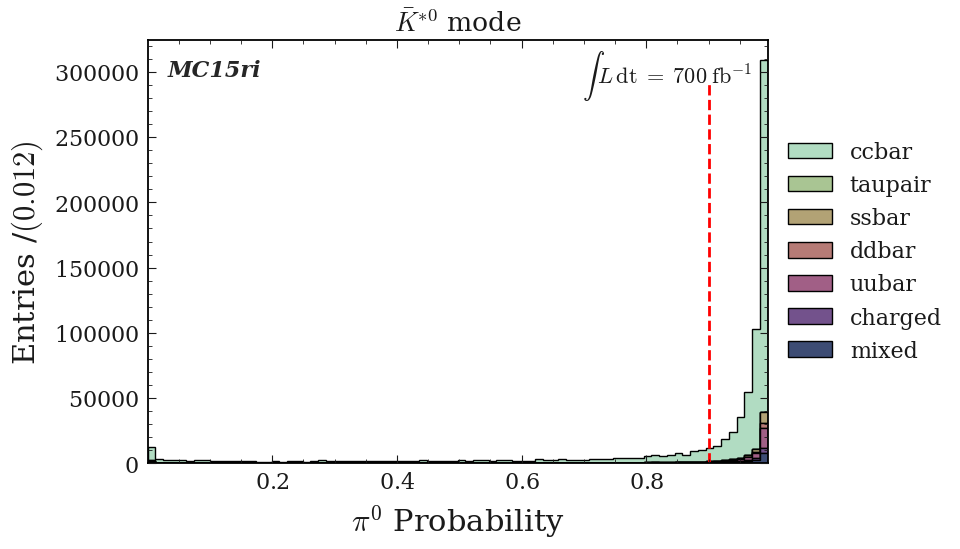

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


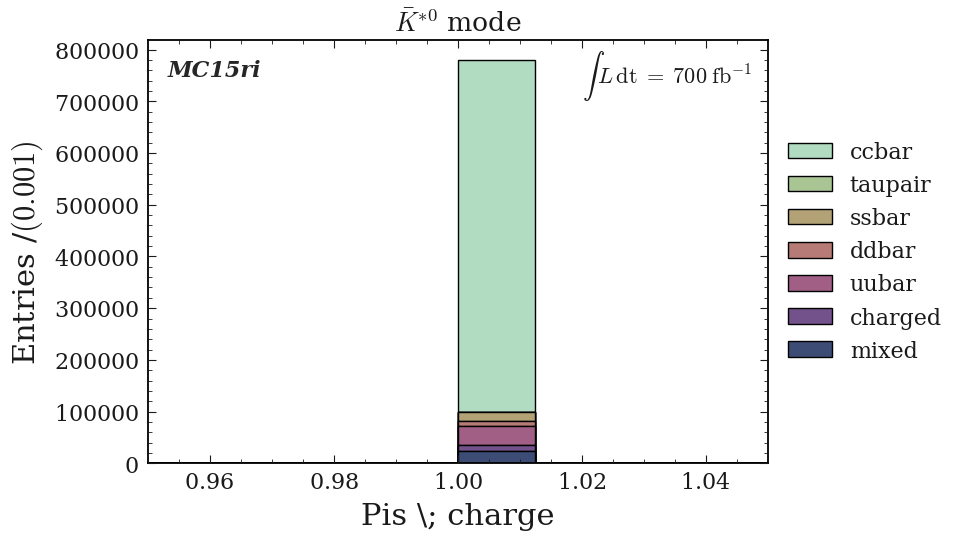

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


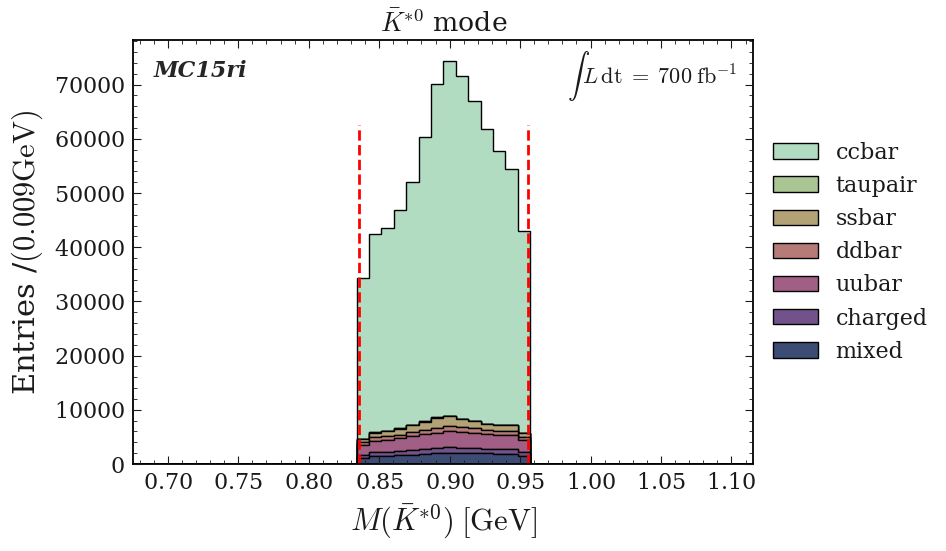

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [73]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']

plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']
# var_name['antiKstar_InvM'] = r"M(\bar{K^{*0})"
# print(var_name['antiKstar_InvM'])

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

pd_antiKstar1 = pd_antiKstar.query("(antiKstar_InvM < 0.89555+0.06) and (antiKstar_InvM > 0.89555-0.06)")
draw_stack_no_signal(figname="1_vector_cut",df=pd_antiKstar1,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


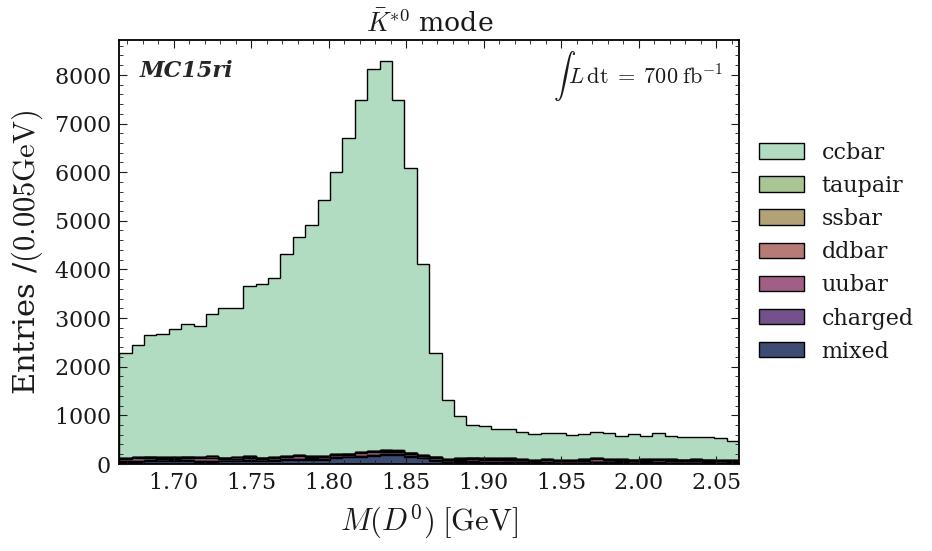

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


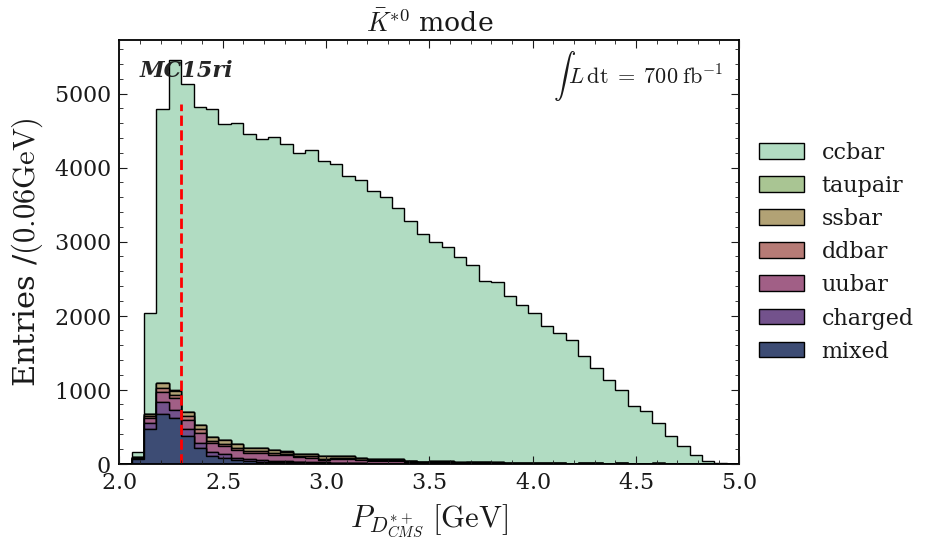

Q
$Q \; [\mathrm{GeV}]$


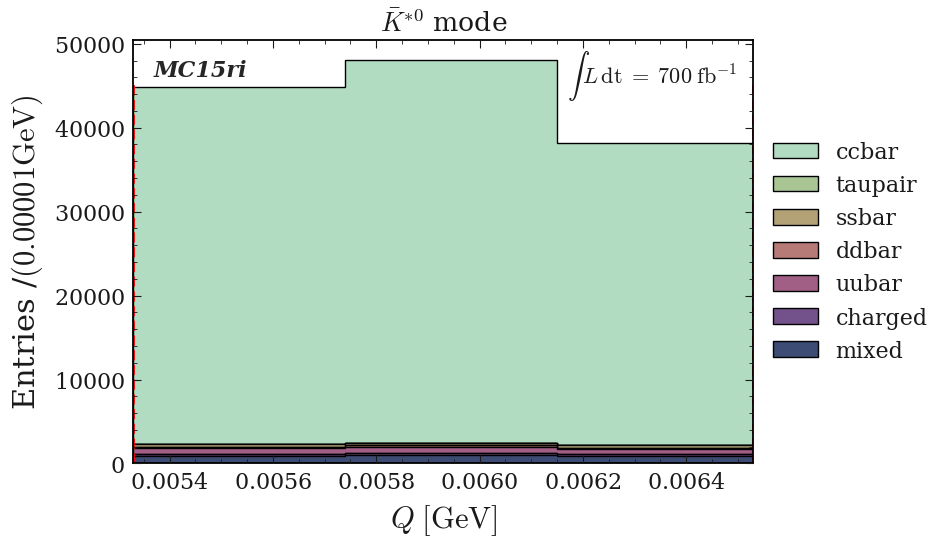

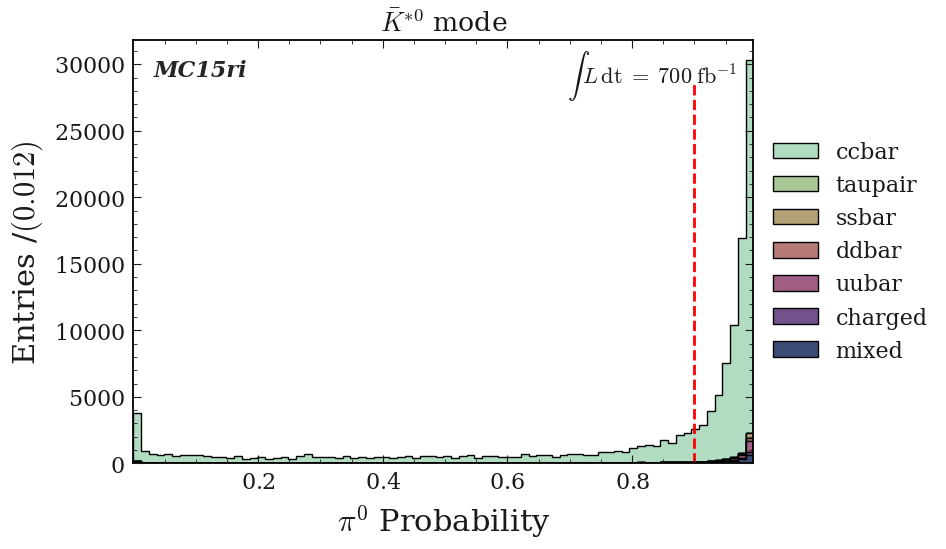

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


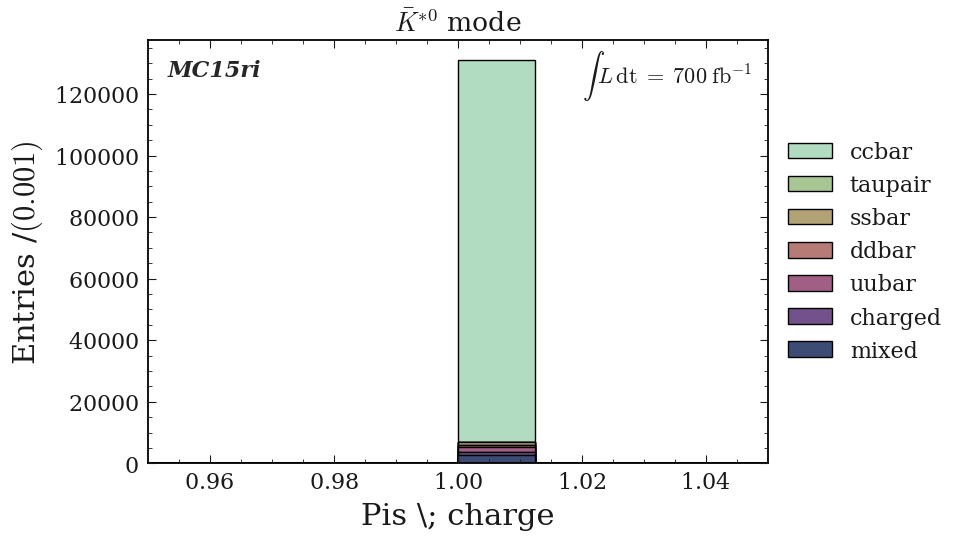

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


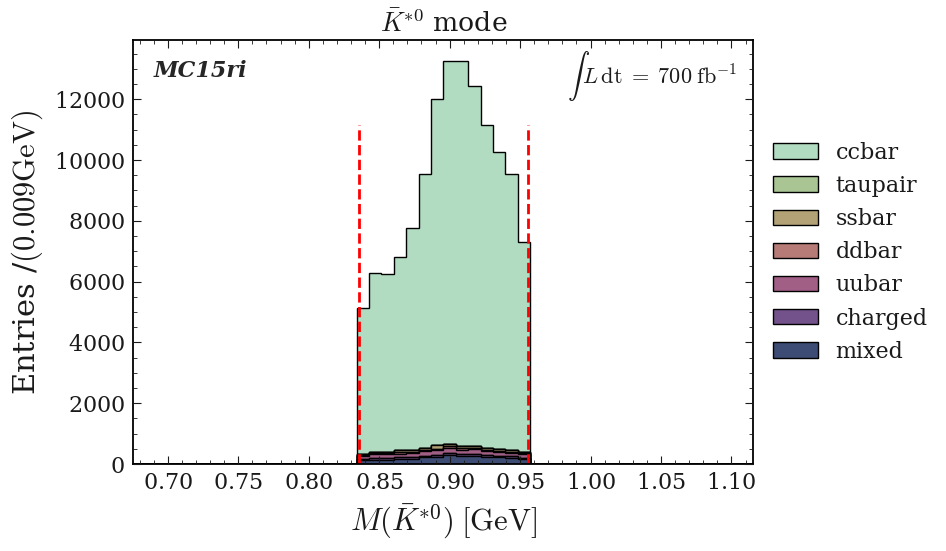

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [74]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar2 = pd_antiKstar1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname="2_Q_cut",df=pd_antiKstar2,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


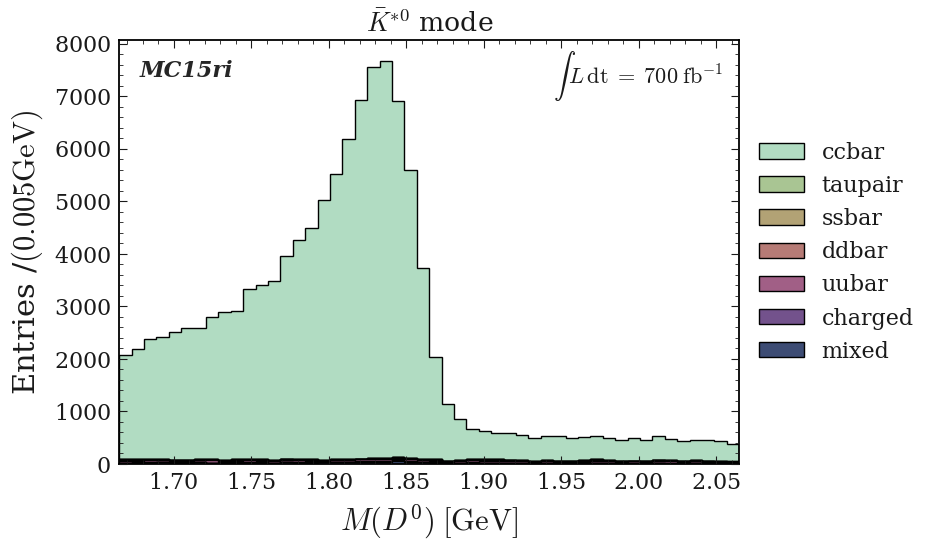

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


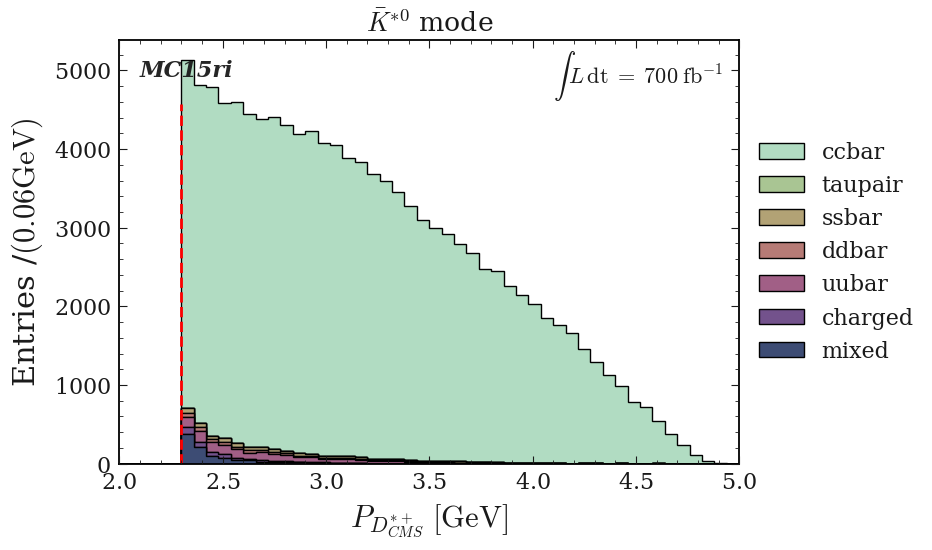

Q
$Q \; [\mathrm{GeV}]$


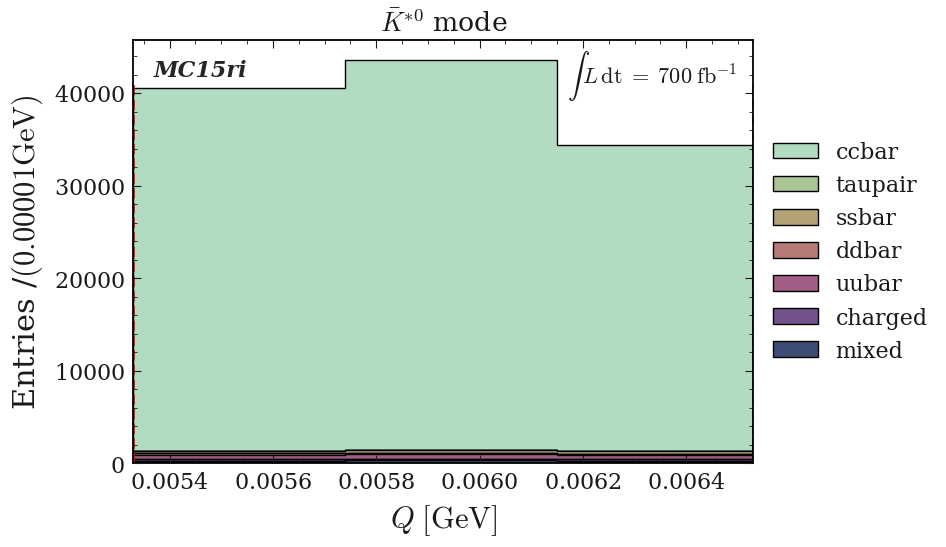

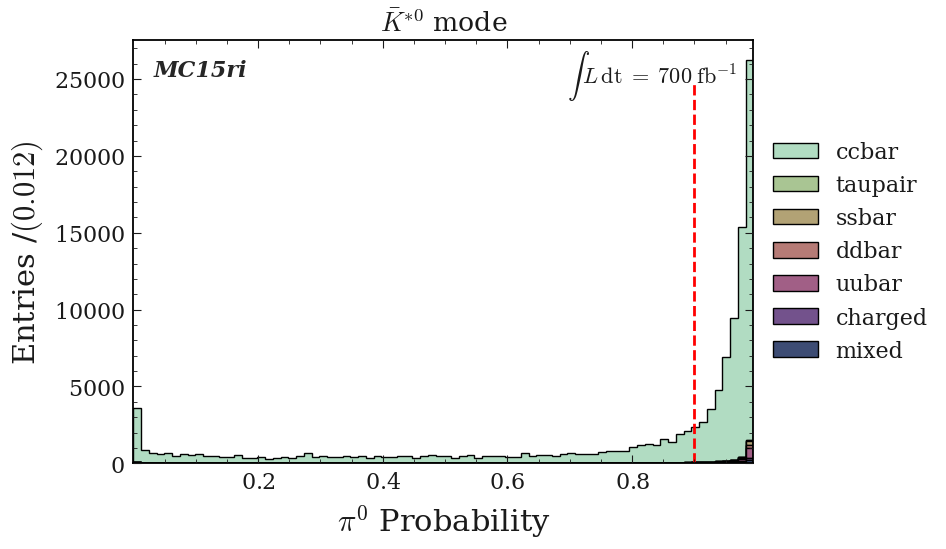

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


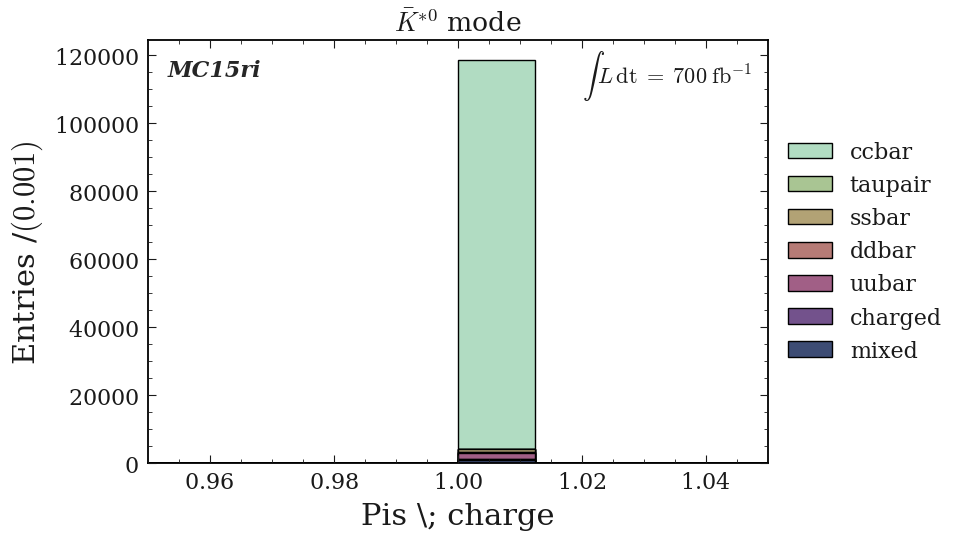

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


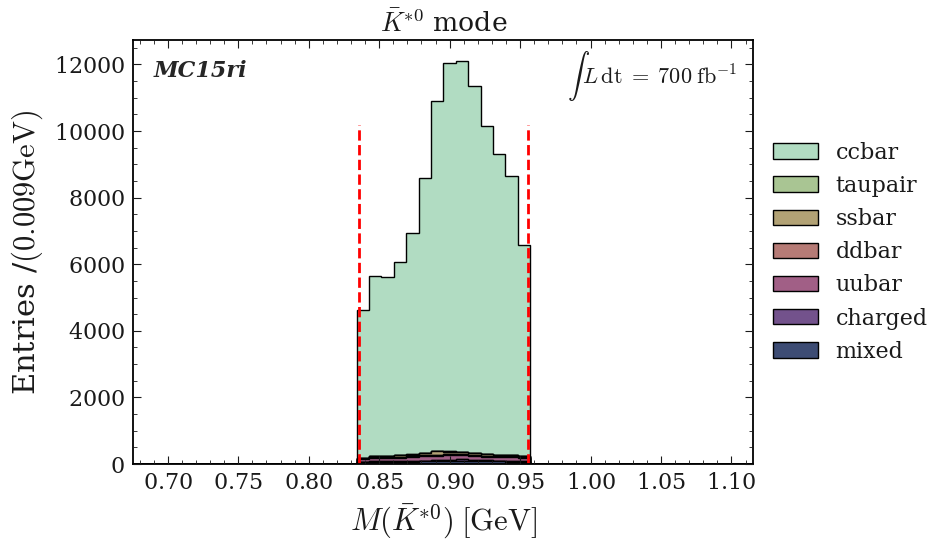

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [75]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar3 = pd_antiKstar2.query("Dstarp_CMS_p>2.3")
draw_stack_no_signal(figname="3_CMS_p_cut",df=pd_antiKstar3,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


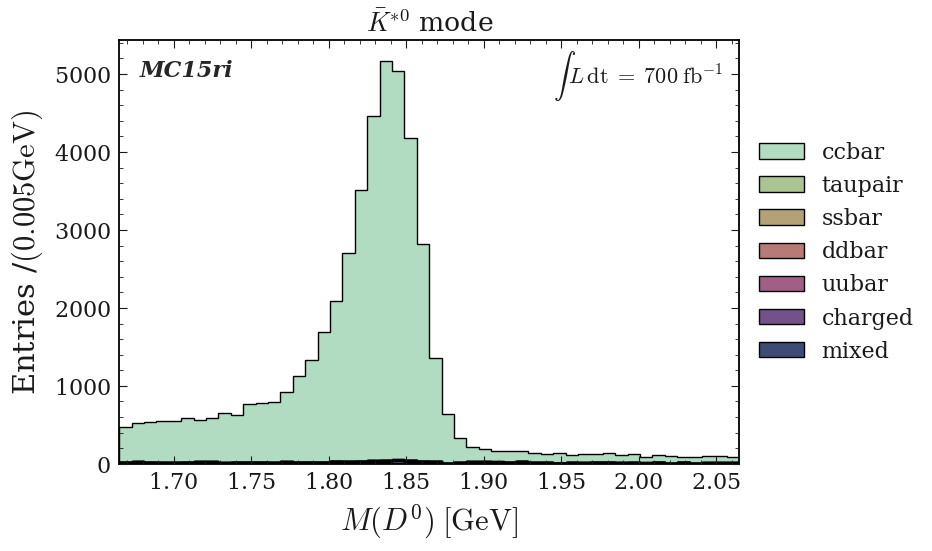

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


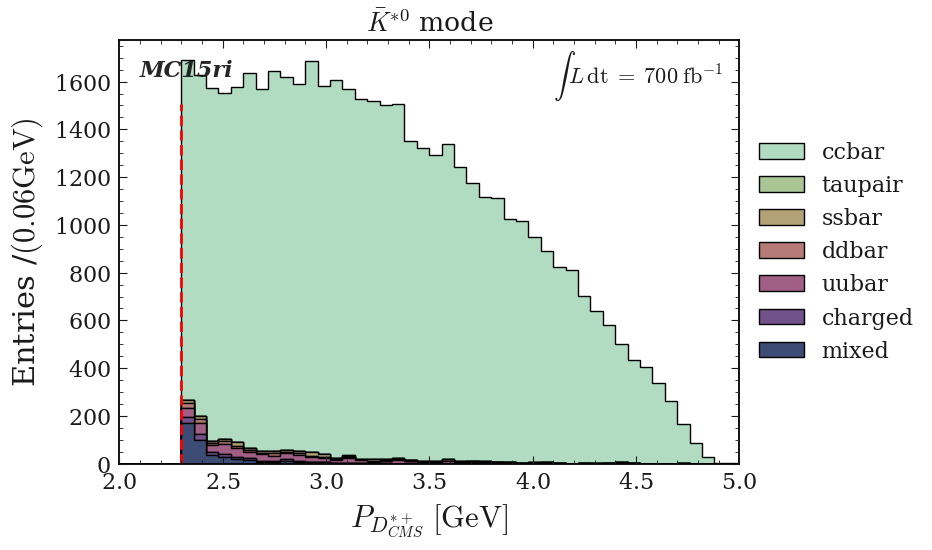

Q
$Q \; [\mathrm{GeV}]$


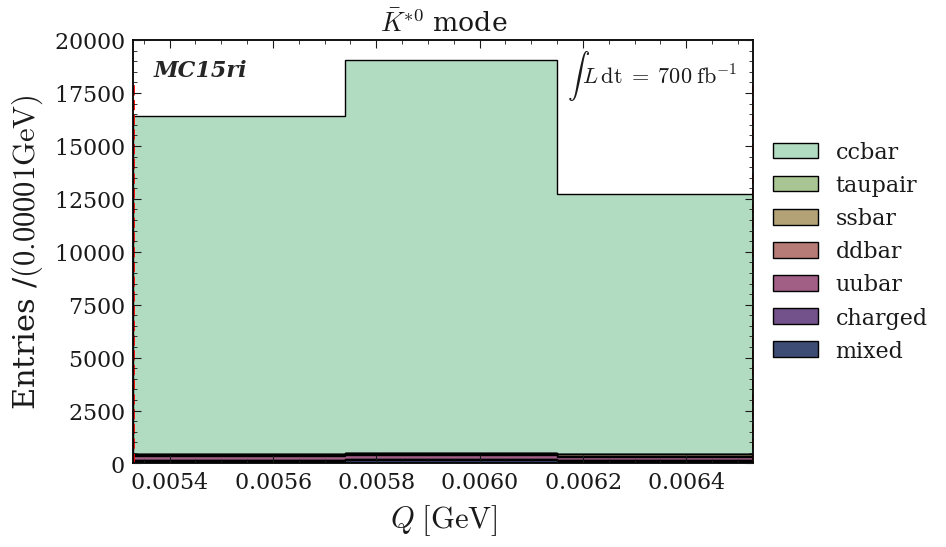

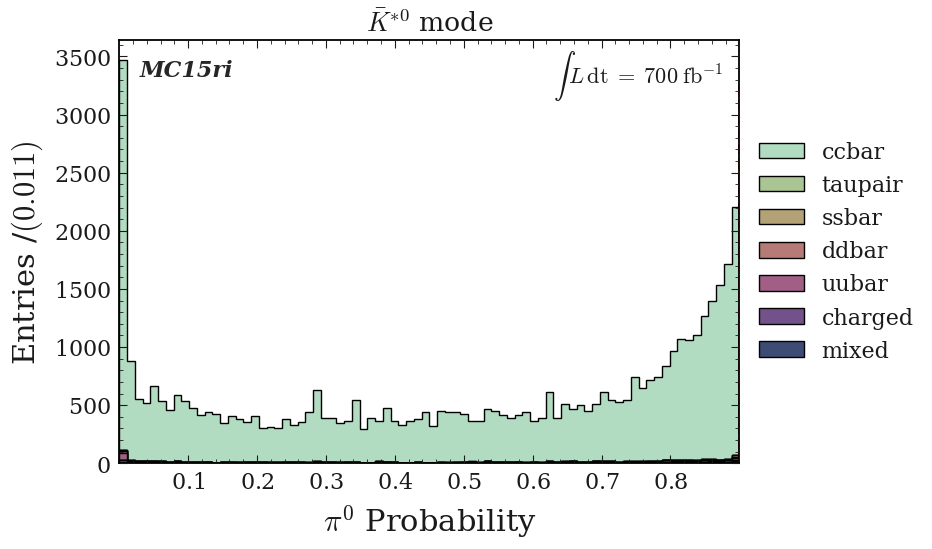

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


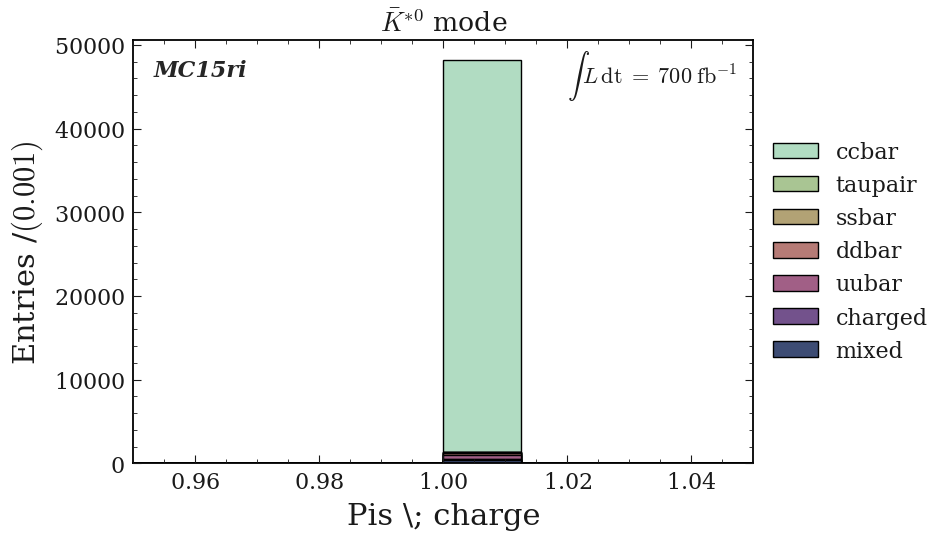

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


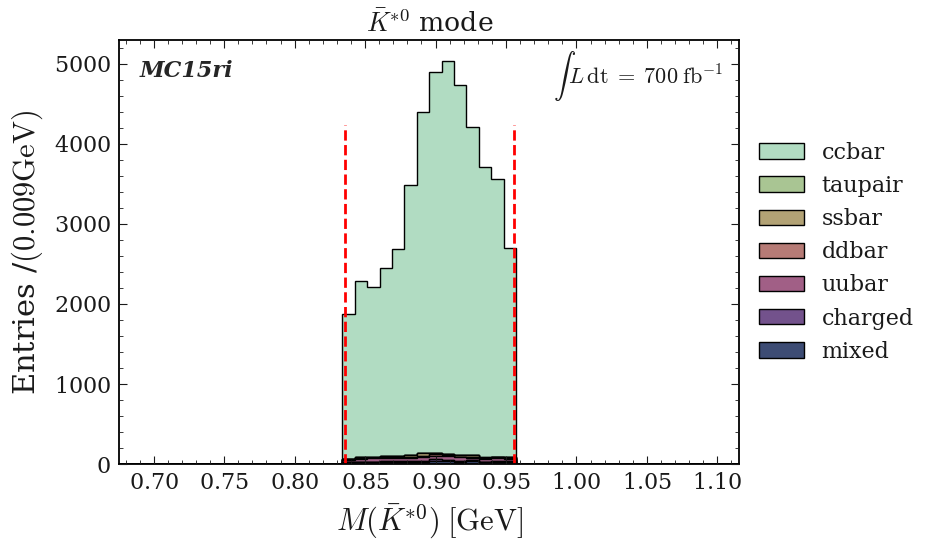

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [76]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar4 = pd_antiKstar3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname="4_pi0_veto_cut",df=pd_antiKstar4,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(array([215121., 244643., 238938., 232371., 224560., 217545., 210387.,
        201501., 192222., 169957.]),
 array([1.66500044, 1.70500038, 1.74500031, 1.78500025, 1.82500019,
        1.86500013, 1.90500007, 1.945     , 1.98499994, 2.02499988,
        2.06499982]),
 <BarContainer object of 10 artists>)

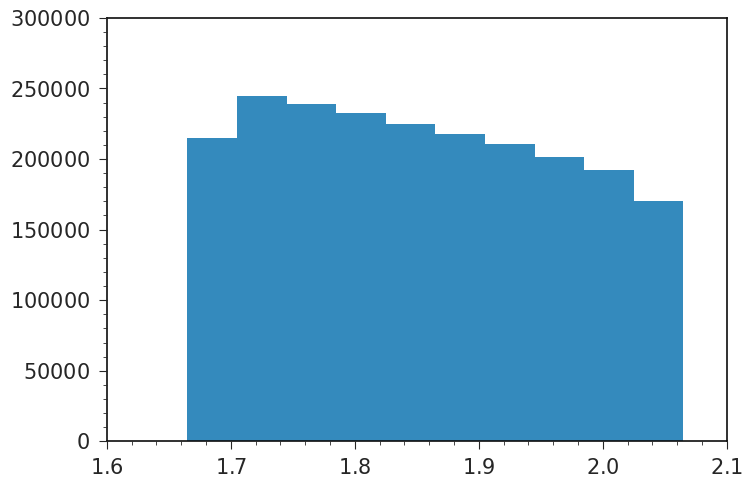

In [47]:
plt.hist(pd_omega["D0_M"])

## omega

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


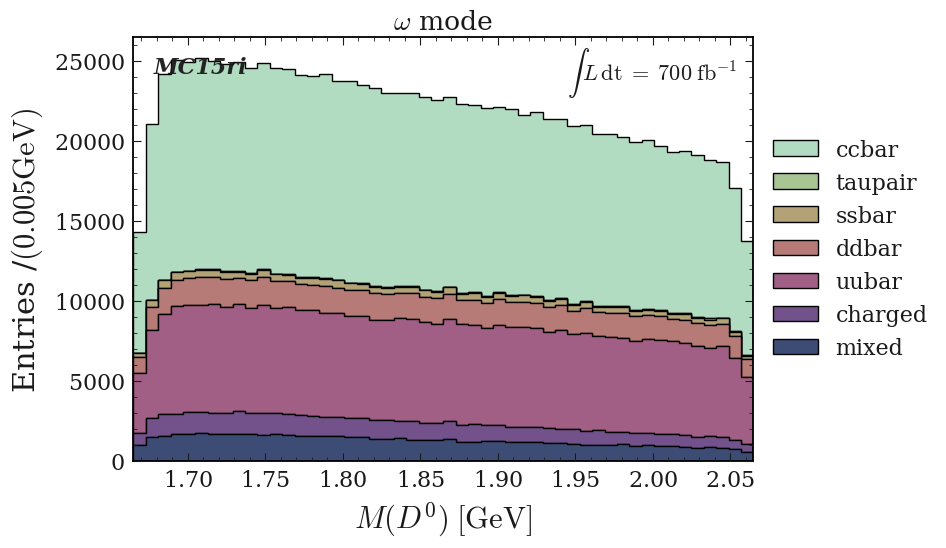

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


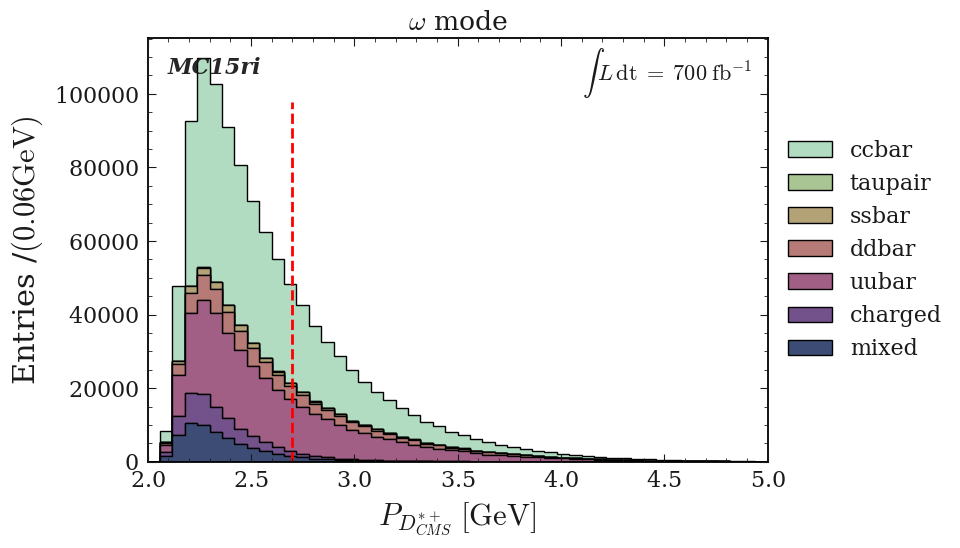

Q
$Q \; [\mathrm{GeV}]$


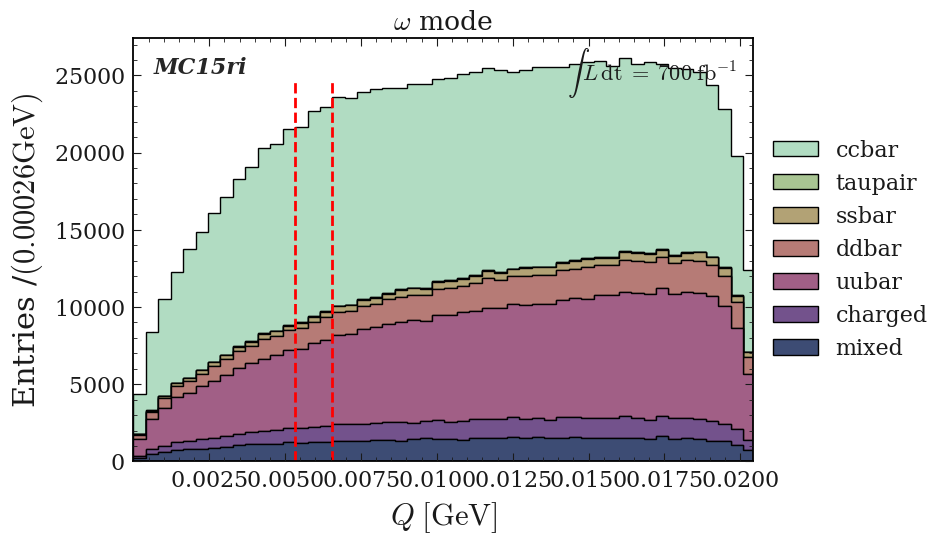

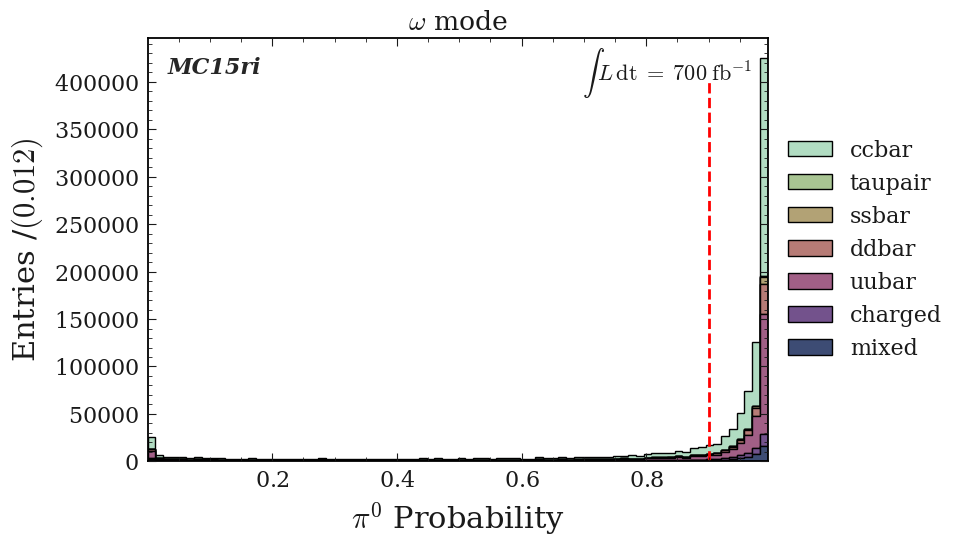

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


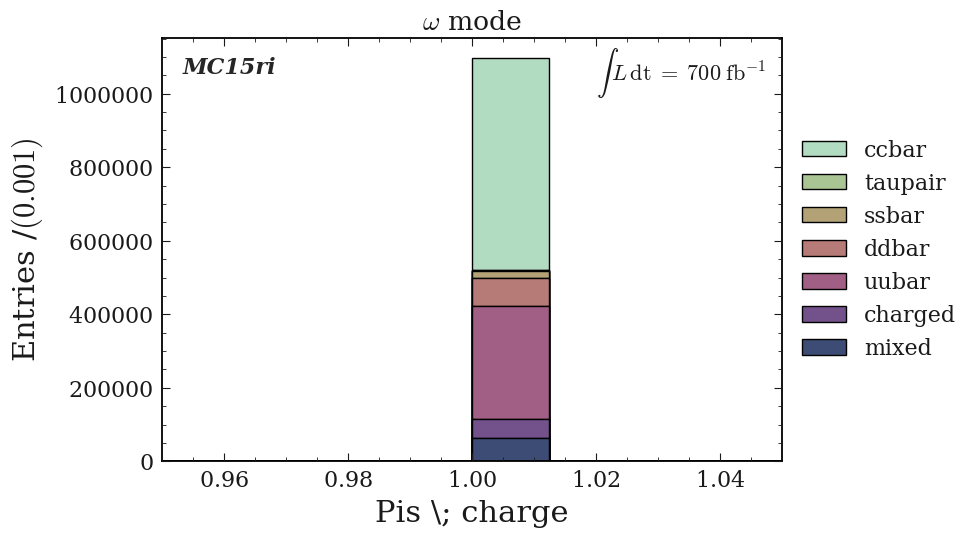

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


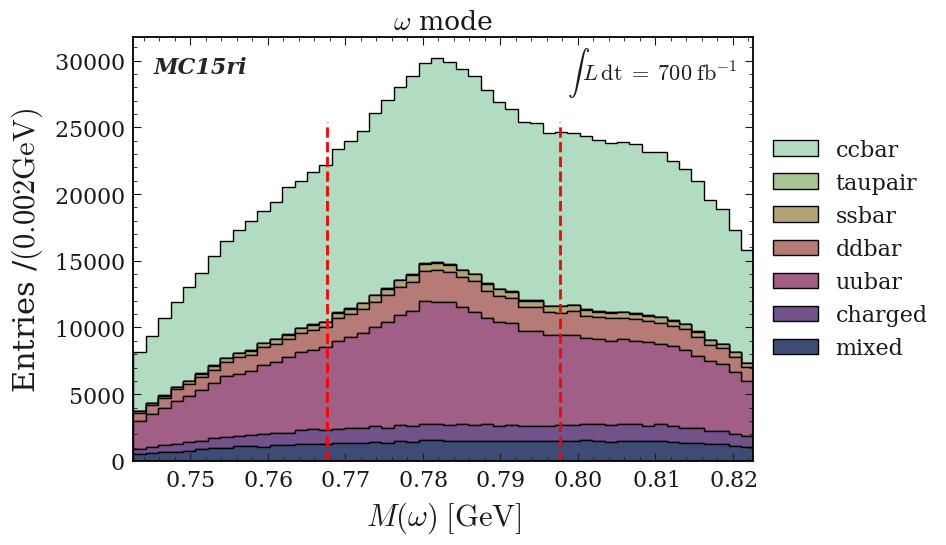

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [82]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega = pd_omega.query("abs(Omega_InvM - 0.78265)<0.04  and (D0_M>1.665) and (D0_M<2.065) and (Pis_charge==1)")
draw_stack_no_signal(figname="0_No_cut",df=pd_omega,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


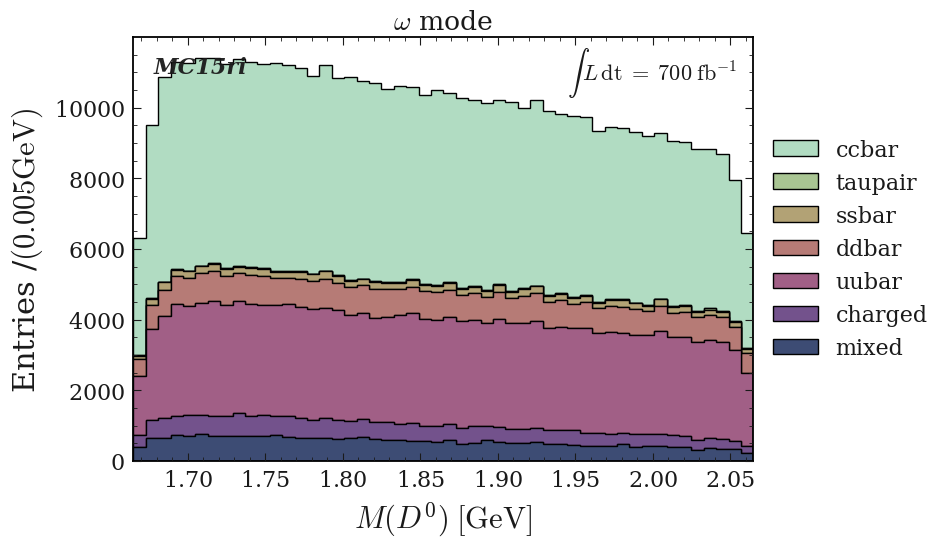

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


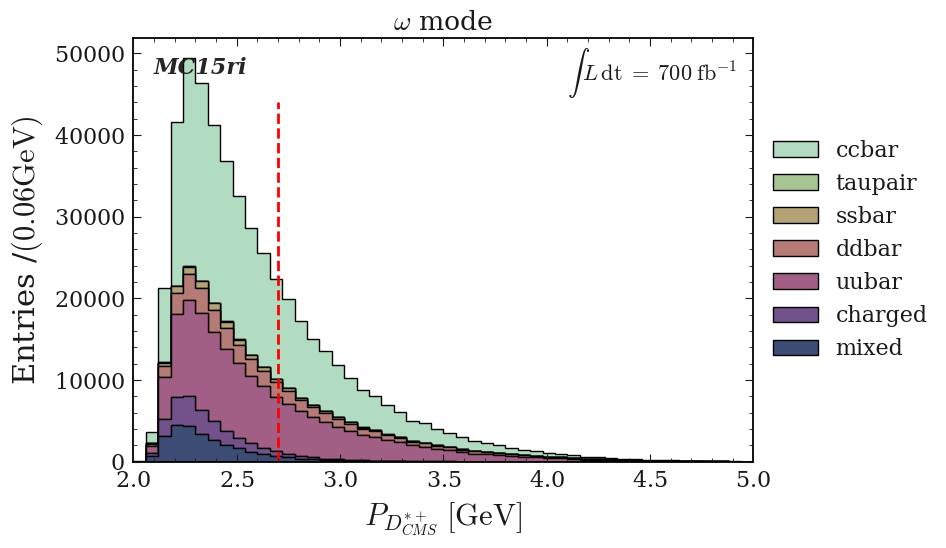

Q
$Q \; [\mathrm{GeV}]$


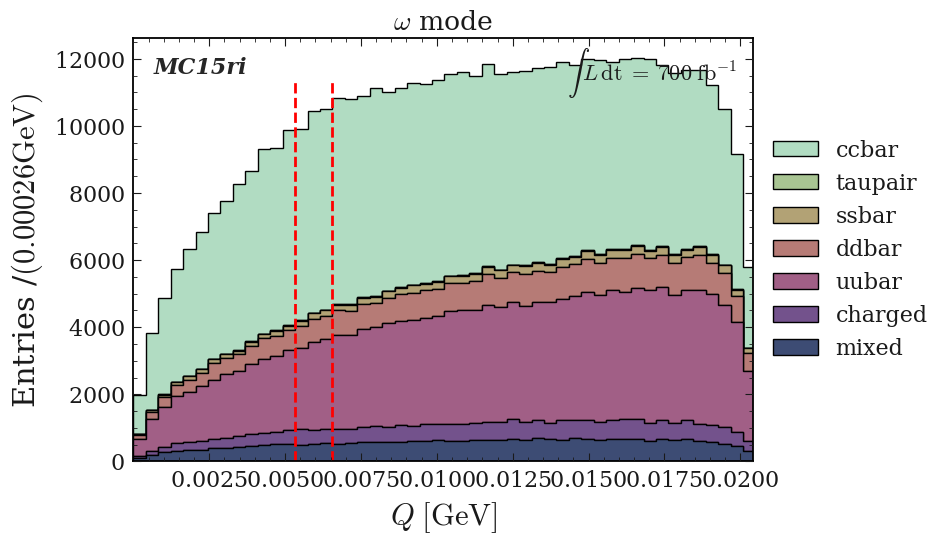

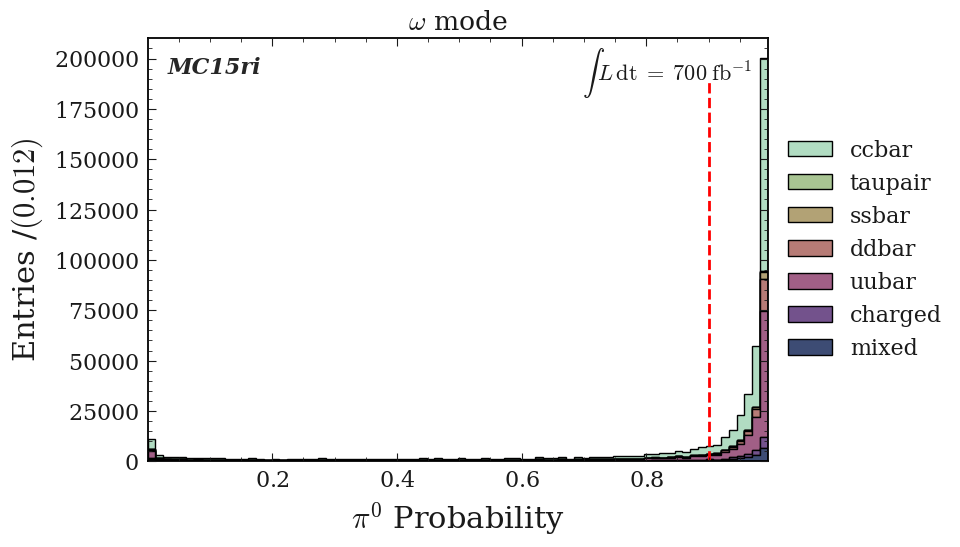

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


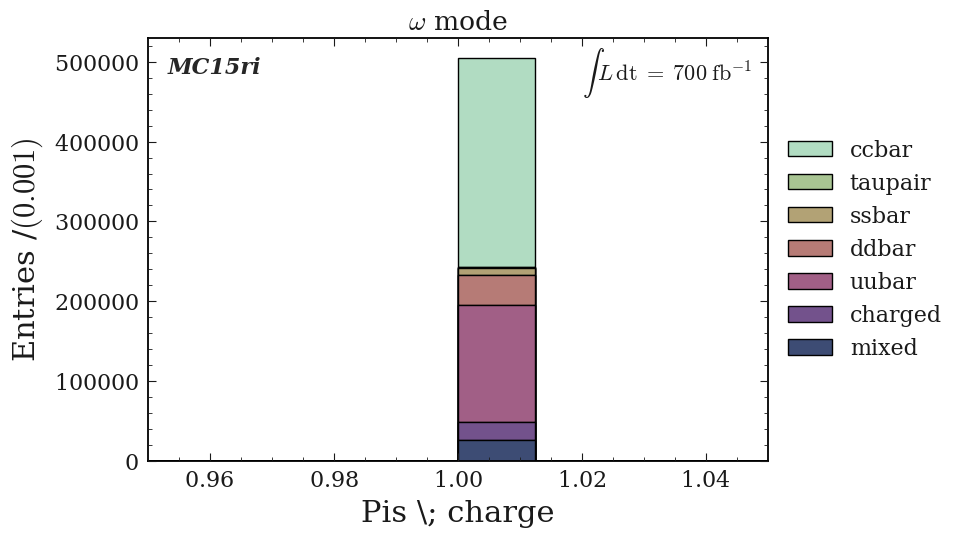

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


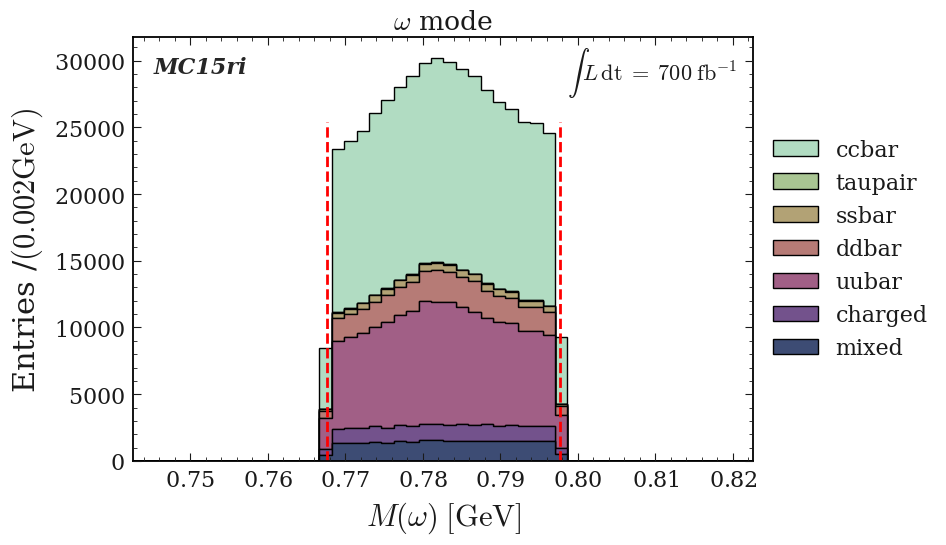

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [83]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega1 = pd_omega.query("abs(Omega_InvM - 0.78265)<0.015")
draw_stack_no_signal(figname="1_vector_cut", df=pd_omega1,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


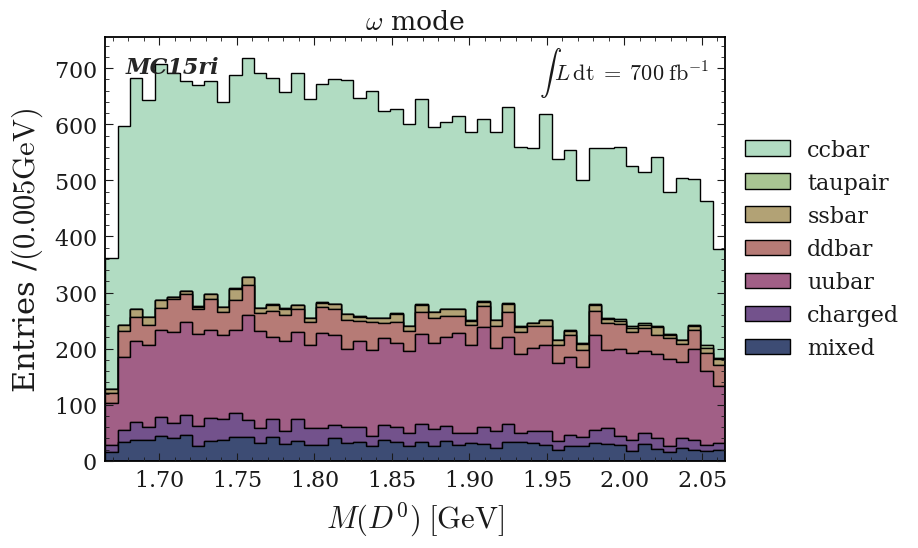

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


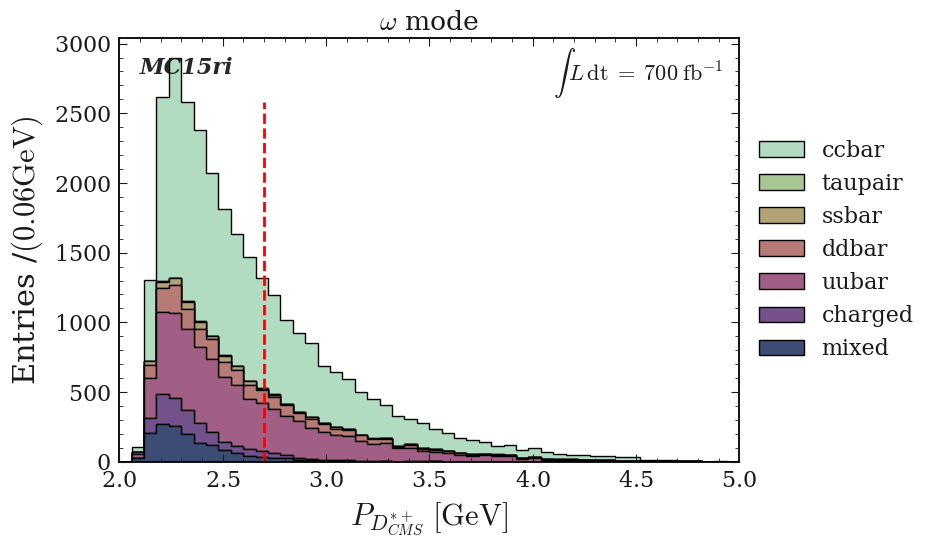

Q
$Q \; [\mathrm{GeV}]$


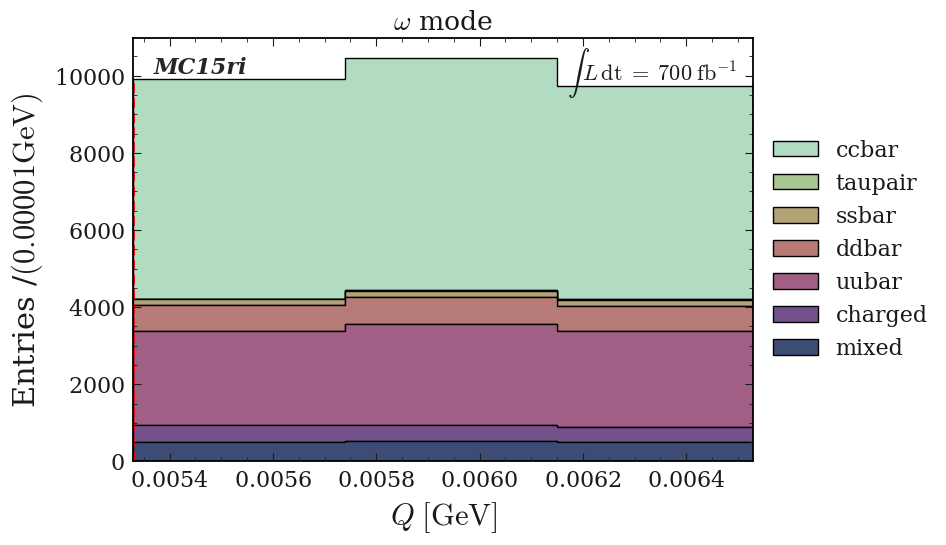

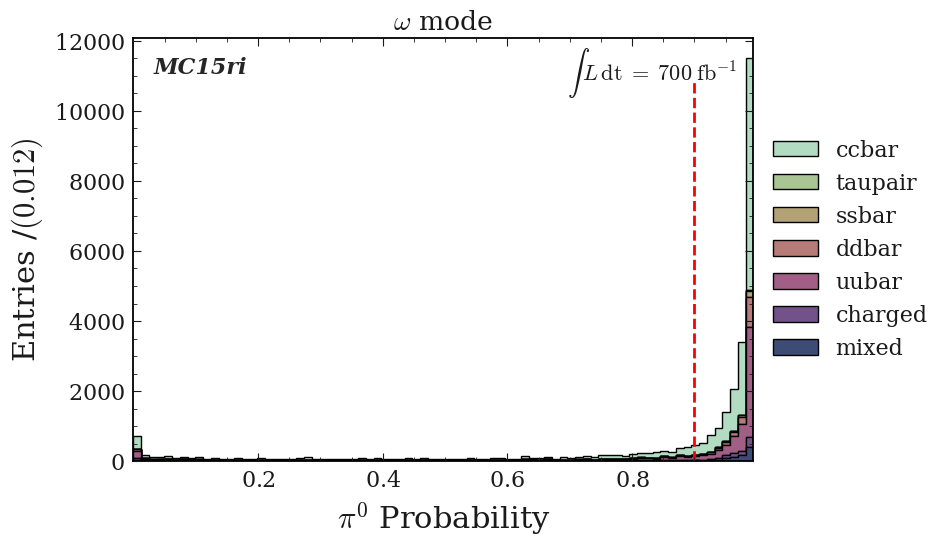

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


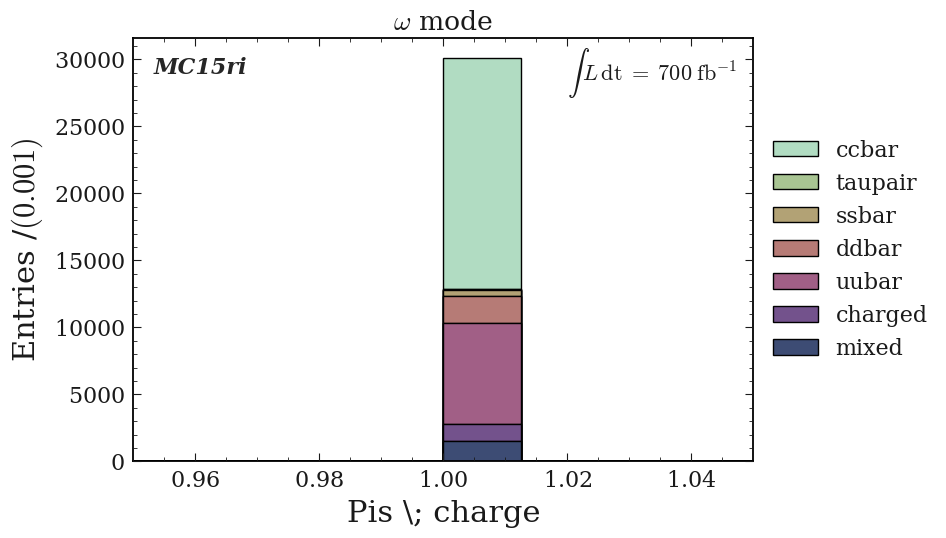

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


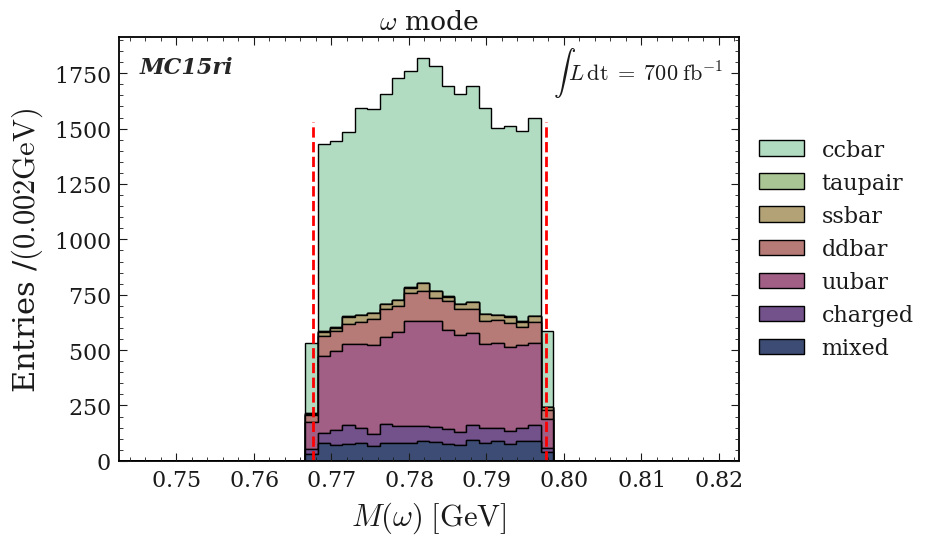

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [84]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega2 = pd_omega1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname="2_Q_cut", df=pd_omega2,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


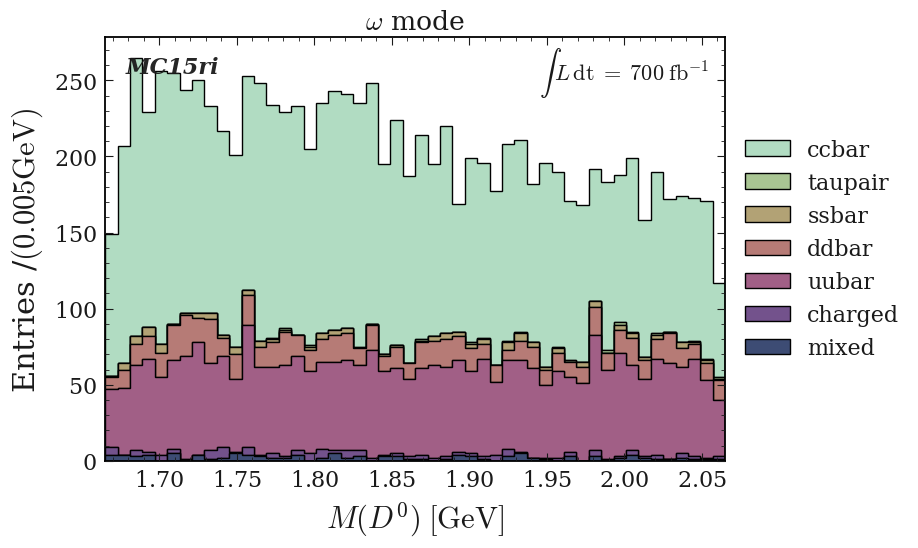

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


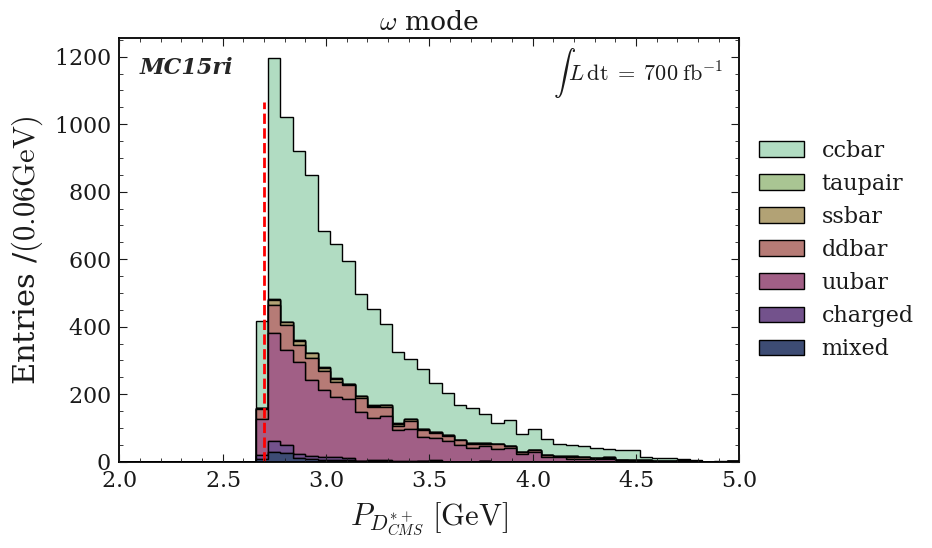

Q
$Q \; [\mathrm{GeV}]$


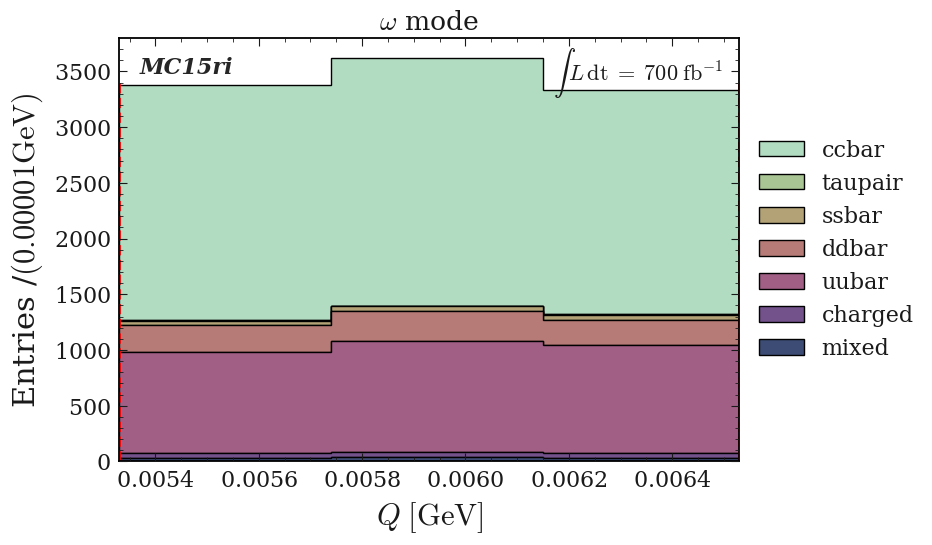

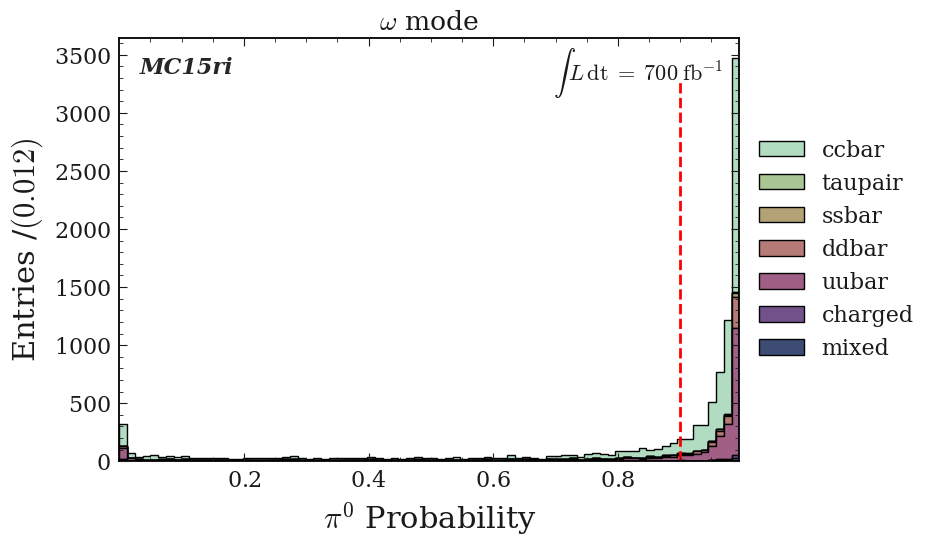

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


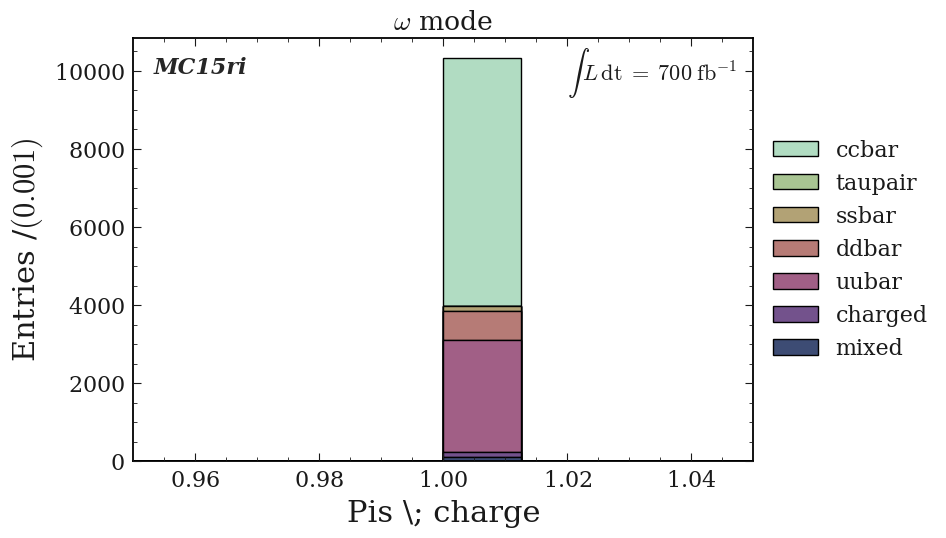

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


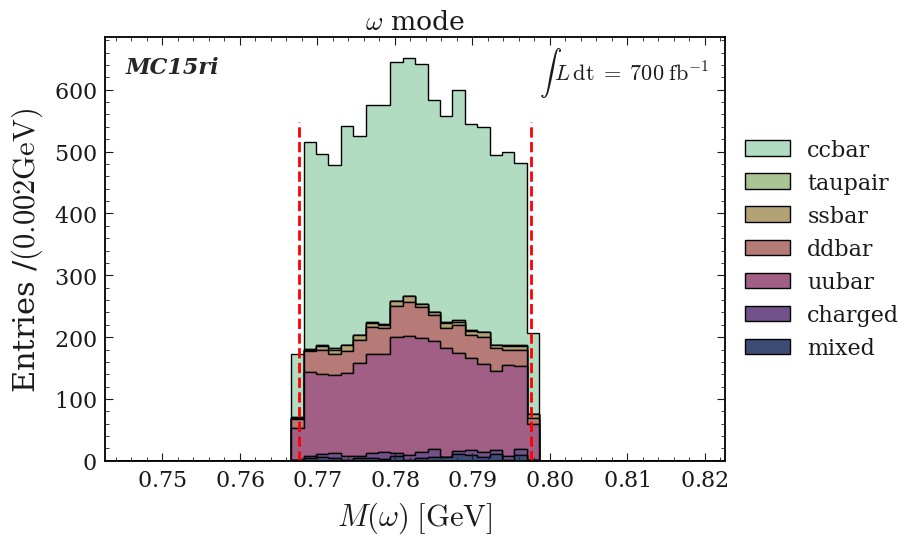

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [85]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega3 = pd_omega2.query("Dstarp_CMS_p > 2.7")
draw_stack_no_signal(figname="3_Dst_CMS_p_cut", df=pd_omega3,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


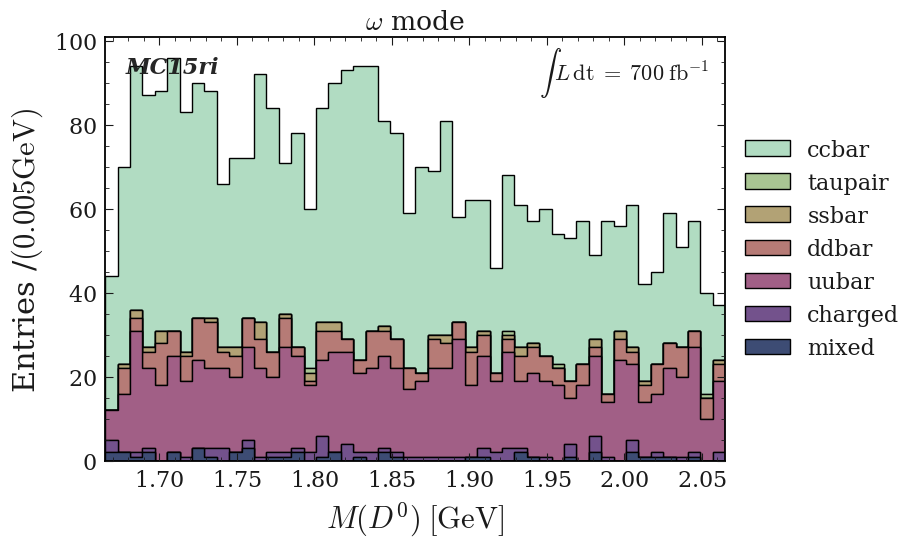

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


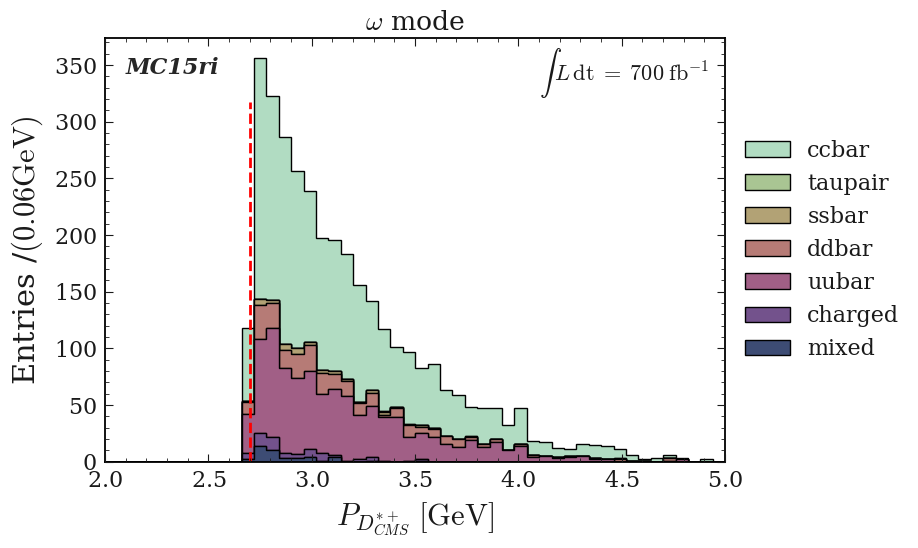

Q
$Q \; [\mathrm{GeV}]$


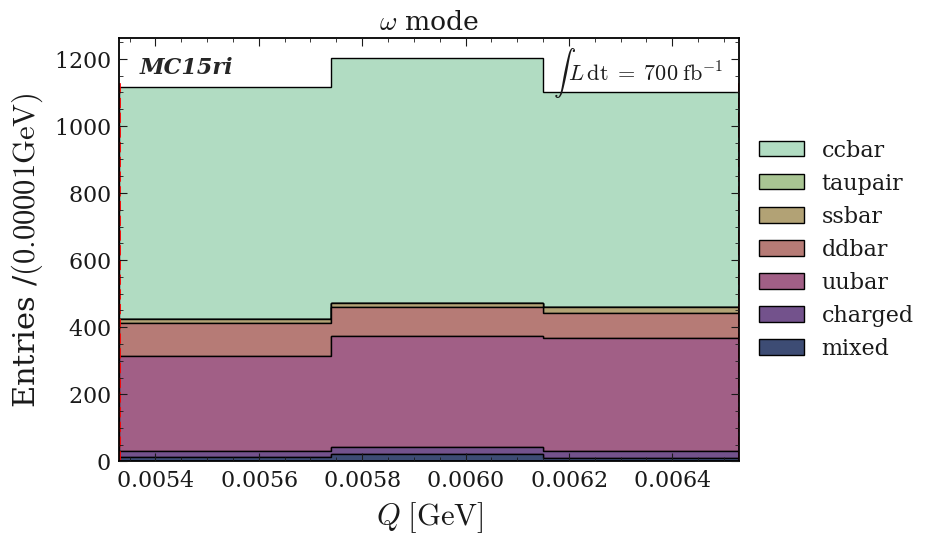

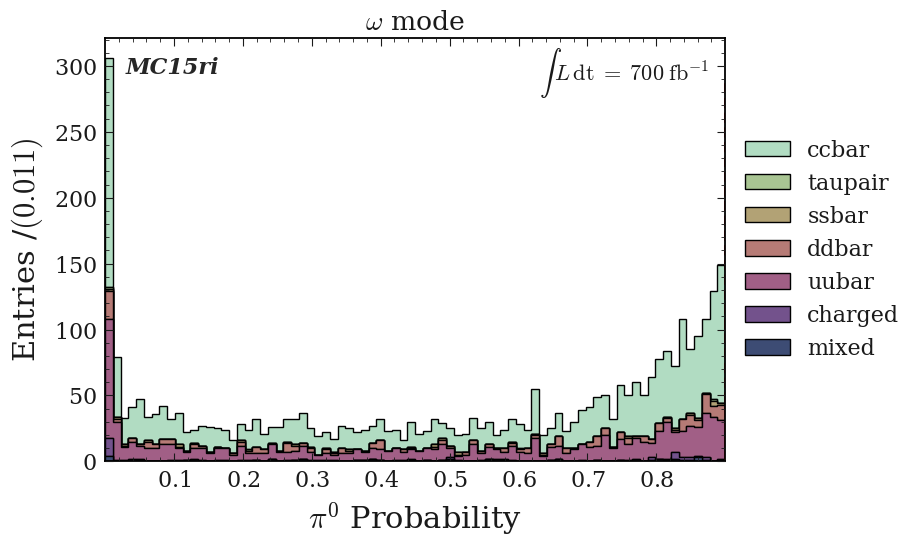

/home/jykim/workspace/DRAW/hist/draw_stack.py:324: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  x_axis = ax.get_xbound()


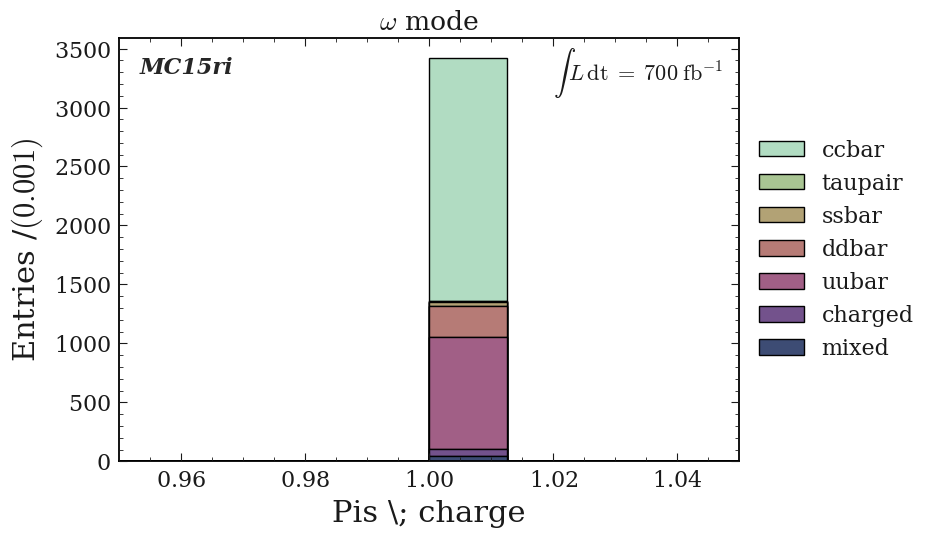

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


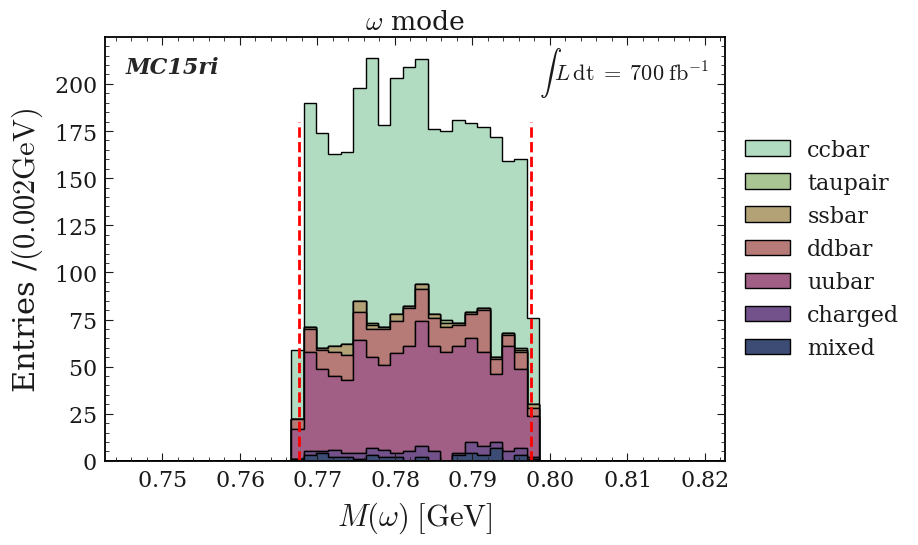

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [86]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega4 = pd_omega3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname="4_pi0_veto_cut", df=pd_omega4,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


In [98]:
pd_omega

,D0_M,Dstarp_Q,D0_cosHel_0,Dstarp_CMS_p,gamma_E,gamma_clusterSecondMoment,__ncandidates__,__experiment__,__run__,__event__,Dstarp_isSignal,D0_isSignal,Pi0_Prob,Eta_Prob,Pis_charge,D0_cosHel_2,Omega_InvM,class
0,1.725662,0.011977,0.972046,2.101830,1.552214,0.820312,2,1003,0,138267098,NaN,NaN,0.842700,0.954775,1.0,-0.893975,0.768223,ccbar
1,1.745638,0.014647,0.866139,2.238763,1.552218,0.820312,2,1003,0,138267098,0.0,0.0,0.842700,0.954775,1.0,-0.783276,0.771353,ccbar
2,1.801802,0.014706,0.909734,2.608865,0.370245,1.093750,1,1003,0,138272385,NaN,NaN,0.992386,0.962745,1.0,-0.673086,0.797961,ccbar
3,1.984591,0.011389,0.533965,2.522231,0.390425,1.210938,1,1003,0,138273526,0.0,0.0,0.746888,0.270118,1.0,-0.537225,0.772672,ccbar
13,1.978506,0.005453,0.952216,2.377144,0.308668,0.937500,2,1003,0,112118761,0.0,0.0,0.963357,0.877302,1.0,0.715241,0.792916,ccbar
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4398,1.969885,0.012932,0.289442,2.253182,0.400595,0.937500,2,1003,0,14252518,0.0,0.0,0.994147,0.663246,1.0,-0.078597,0.782532,taupair
4403,2.032324,0.002764,-0.316188,3.947499,0.308246,0.742188,1,1003,0,181801775,NaN,NaN,0.965554,0.892761,1.0,-0.719247,0.815623,taupair
4406,1.756423,0.017861,0.642893,2.619126,0.304422,0.937500,2,1003,0,115907158,NaN,NaN,0.614520,0.255397,1.0,-0.021212,0.781730,taupair
4407,1.739384,0.015006,0.731949,2.609549,0.304415,0.937500,2,1003,0,115907158,NaN,NaN,0.614520,0.255397,1.0,0.013537,0.758978,taupair


In [99]:
pd_omegapi0

,D0_M,Dstarp_Q,D0_cosHel_0,Dstarp_CMS_p,gamma_E,gamma_clusterSecondMoment,__ncandidates__,__experiment__,__run__,__event__,Dstarp_isSignal,D0_isSignal,Pi0_Prob,Eta_Prob,Pis_charge,class
0,1.708318,0.005537,0.230960,3.733543,2.229994,0.703125,1,1003,0,12,0.0,0.0,0.982497,0.788531,1.0,omegapi0
1,1.764640,0.005694,0.741975,2.328860,1.123152,0.898438,1,1003,0,50,0.0,0.0,0.979276,0.281003,1.0,omegapi0
2,1.957600,0.005911,-0.893623,2.999518,0.824772,1.171875,1,1003,0,53,0.0,0.0,0.834602,0.591164,1.0,omegapi0
3,1.703596,0.005646,0.378197,2.892903,0.525290,1.250000,1,1003,0,62,NaN,NaN,0.926980,0.958070,1.0,omegapi0
4,1.799358,0.005593,-0.776289,2.536456,0.943411,1.210938,1,1003,0,68,NaN,NaN,0.964691,0.909000,1.0,omegapi0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,1.804244,0.005495,0.419906,2.741044,1.384677,0.976562,1,1003,0,494,0.0,0.0,0.974546,0.735515,1.0,omegapi0
284,1.817161,0.006047,0.025695,3.414506,1.719765,1.210938,1,1003,0,555,0.0,0.0,0.939943,0.451162,1.0,omegapi0
285,1.845520,0.006058,0.146518,4.068472,1.089906,1.015625,1,1003,0,712,0.0,0.0,0.169638,0.368755,1.0,omegapi0
286,1.854590,0.005600,0.031956,3.352722,1.949238,1.054688,1,1003,0,906,0.0,0.0,0.499369,0.714733,1.0,omegapi0


In [114]:
pd_omega_with_other_bkg = pd.concat([pd_omega, pd_omegapi0, pd_omegaeta, pd_pippimpi0eta])

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


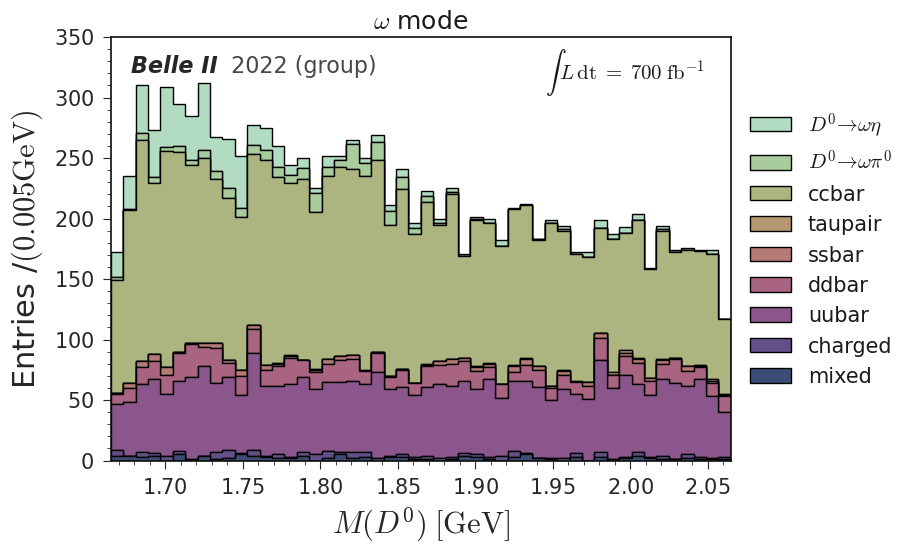

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


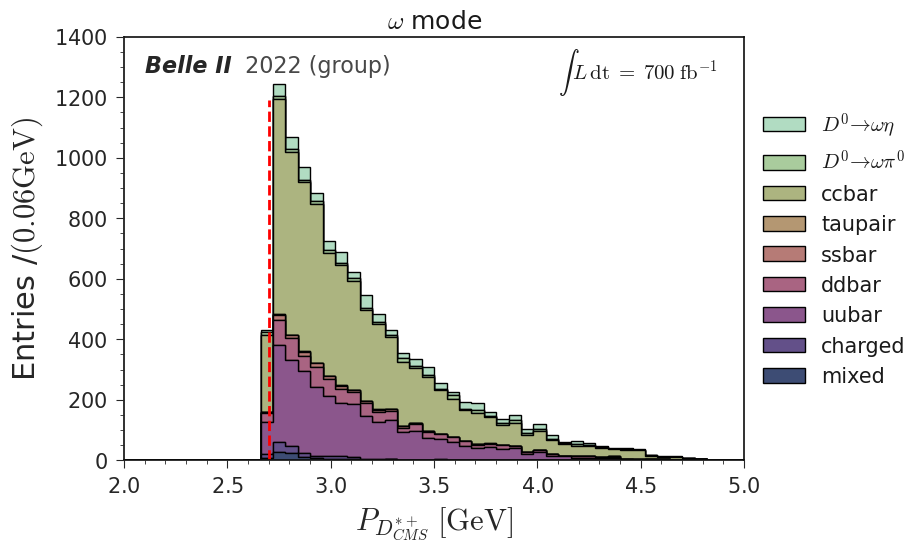

Q
$Q \; [\mathrm{GeV}]$


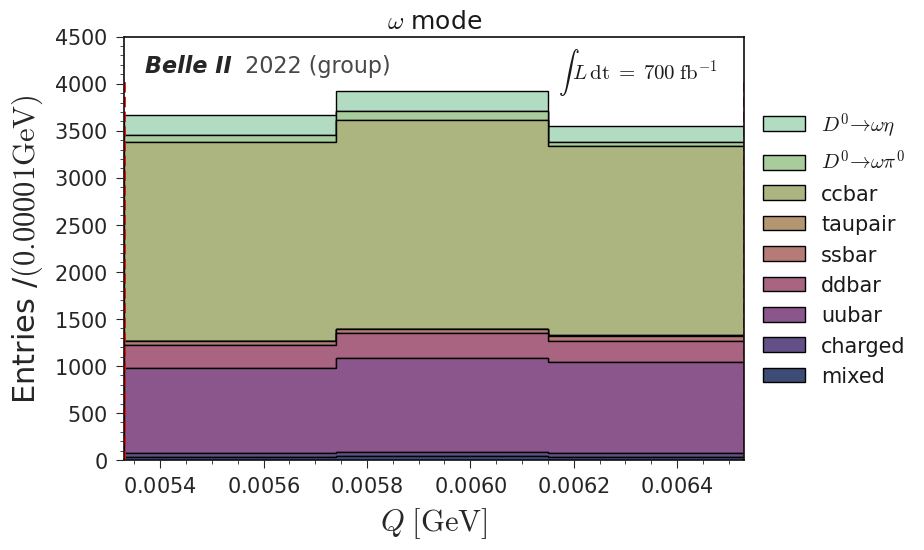

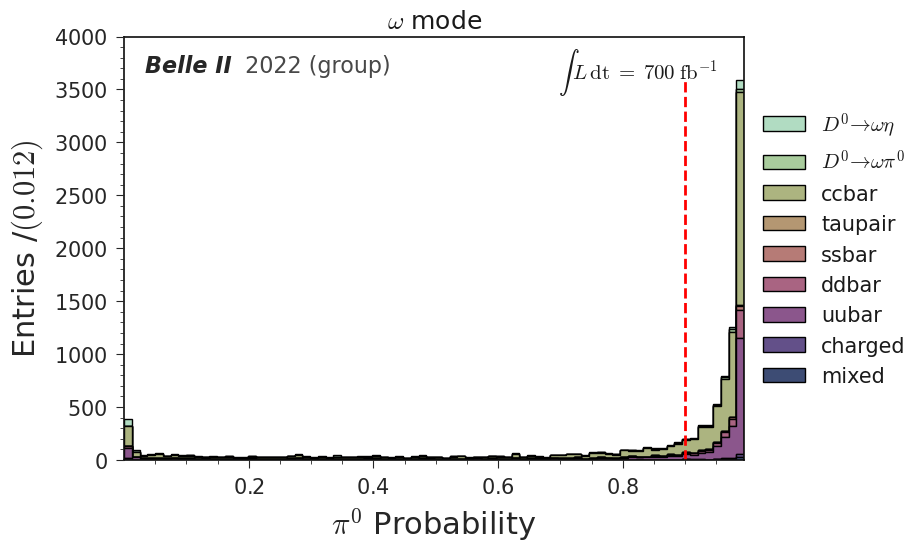

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


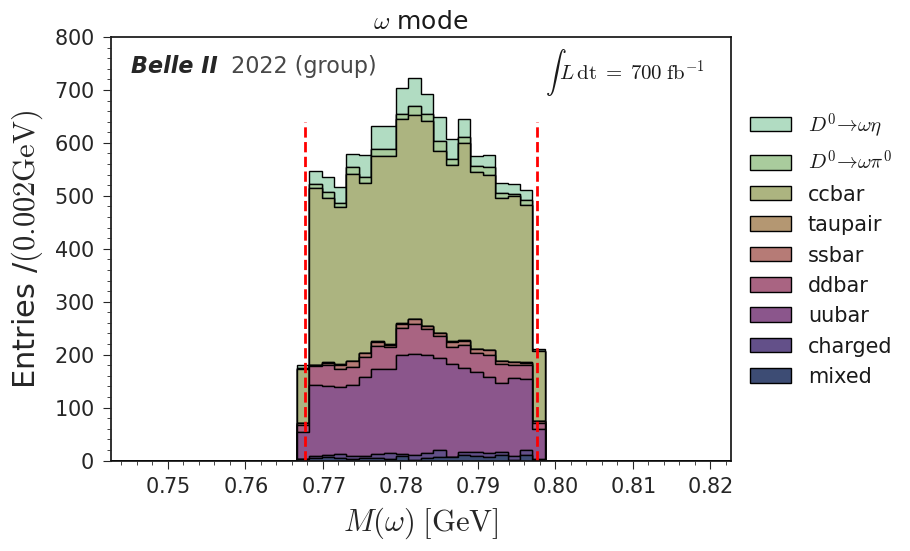

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [118]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega_test = pd_omega_with_other_bkg.query("abs(Dstarp_Q - 0.00593)<0.0006 and abs(Omega_InvM - 0.78265)<0.015 and Dstarp_CMS_p > 2.7")
draw_stack_no_signal_omega(figname="2_Q_cut", df=pd_omega_test,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


In [111]:
pd_omega_test

,D0_M,Dstarp_Q,D0_cosHel_0,Dstarp_CMS_p,gamma_E,gamma_clusterSecondMoment,__ncandidates__,__experiment__,__run__,__event__,Dstarp_isSignal,D0_isSignal,Pi0_Prob,Eta_Prob,Pis_charge,D0_cosHel_2,Omega_InvM,class
925,1.960467,0.005970,0.142093,3.009552,2.297472,1.015625,1,1003,0,153699803,0.0,0.0,0.000783,0.198340,1.0,-0.293265,0.790681,ccbar
1270,1.911177,0.006362,-0.608280,2.830909,2.358176,0.937500,1,1003,0,262318258,0.0,0.0,0.924578,0.221574,1.0,0.309296,0.787438,ccbar
1408,1.846953,0.006105,0.048652,2.711239,0.317409,0.976562,2,1003,0,183547904,NaN,NaN,0.989356,0.986039,1.0,-0.756876,0.770562,ccbar
1455,1.846081,0.006195,0.344677,2.811994,0.465350,1.210938,4,1003,0,220933325,0.0,0.0,0.985156,0.941954,1.0,-0.404466,0.774255,ccbar
1499,1.832915,0.006058,0.380265,3.100334,0.818576,0.742188,2,1003,0,103590044,0.0,0.0,0.984993,0.963444,1.0,-0.310979,0.780738,ccbar
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3908,1.959222,0.006232,-0.756019,3.773225,3.378193,0.976562,1,1003,0,124173399,NaN,NaN,0.000059,0.945843,1.0,-0.529307,0.786161,taupair
4077,1.995929,0.006126,0.312933,2.781376,0.308014,1.093750,5,1003,0,121617732,NaN,NaN,0.993040,0.812188,1.0,-0.965882,0.770009,taupair
4078,1.993867,0.006050,0.332799,2.758955,0.308014,1.093750,5,1003,0,121617732,NaN,NaN,0.993040,0.812188,1.0,-0.964993,0.779448,taupair
4177,1.771536,0.005702,0.385610,2.739878,0.338490,0.820312,2,1003,0,22975414,NaN,NaN,0.993040,0.962873,1.0,-0.656792,0.788331,taupair


# All variables

In [16]:
location='lab_ssd'
# option = 'train_v2_pre'
option='train_v2_extraction_pi0veto'
sample_info = read_yaml_to_dict("samples")

In [17]:
sample_info

{'pid_0_5': {'ccbar': '/ccbar/pid_0_5_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'pid_0_5_no_signal': {'ccbar': '/ccbar/pid_0_5_no_signal_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'location': {'kekcc': '/group/belle/users/jaeyoung/storage/01_recon/merge_generic_bkg',
  'lab_nas': '/home/jykim/nas/storage/01_recon/merge_generi

In [18]:
sample_loc=sample_name(option=option, location=location, sample_info=sample_info) 
#sample_loc=sample_name(option='pid_0_5_no_signal', location=location) 
print(sample_loc )

{'ccbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ccbar/train_v2_extraction_pi0veto_ccbar_recon_output_0*.root', 'charged': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/charged/train_v2_extraction_pi0veto_charged_recon_output_0*.root', 'mixed': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/mixed/train_v2_extraction_pi0veto_mixed_recon_output_0*.root', 'uubar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/uubar/train_v2_extraction_pi0veto_uubar_recon_output_0*.root', 'ddbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ddbar/train_v2_extraction_pi0veto_ddbar_recon_output_0*.root', 'ssbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ssbar/train_v2_extraction_pi0veto_ssbar_recon_output_0*.root', 'taupair': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/taupair/train_v2_extraction_pi0veto_taupair_recon_output_0*.root'}


In [19]:
List = ['phi', 'antiKstar', 'rho', 'omega']
extract_variables = "plot_variables"

In [20]:
plot_variables = read_yaml_to_dict(extract_variables )

In [21]:
plot_variables

{'vars': ['D0_M',
  'Dstarp_Q',
  'D0_cosHel_0',
  'Dstarp_CMS_p',
  'gamma_E',
  'gamma_clusterSecondMoment',
  '__ncandidates__',
  '__experiment__',
  '__run__',
  '__event__',
  'Dstarp_isSignal',
  'D0_isSignal']}

In [22]:
for mode in List:
    if mode == 'phi':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_phi = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'antiKstar':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_antiKstar = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'rho':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_rho = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'omega':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_omega = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
        

['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Phi_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'antiKstar_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Rho_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'D0_cosHel_2', 'Omega_InvM']


## phi

In [13]:
# signal + bkg 
pd_phi_D0 = pd_phi[pd_phi["Pis_charge"]==1]

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


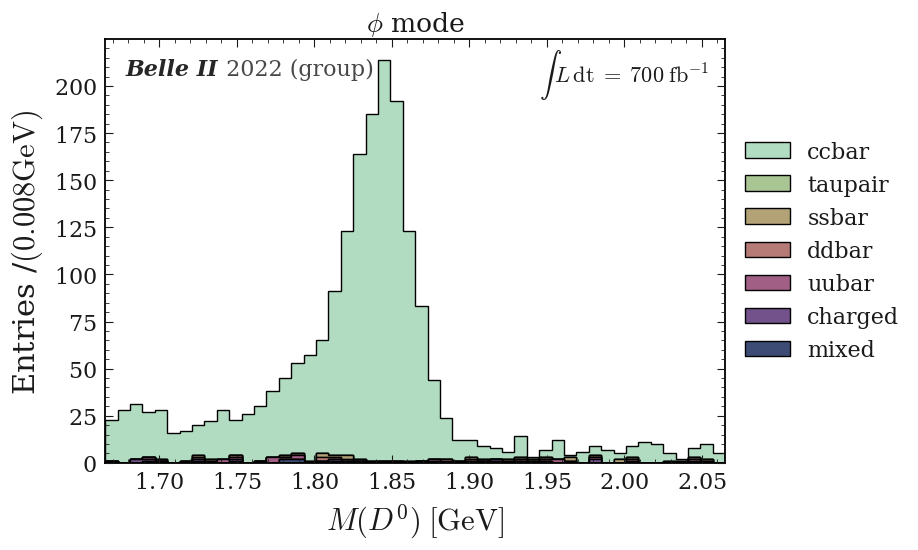

Q
$Q \; [\mathrm{GeV}]$


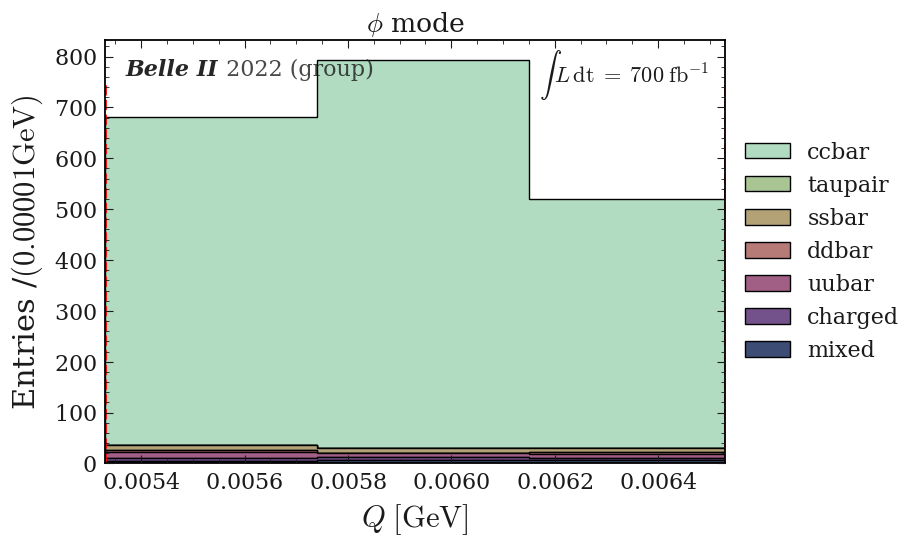

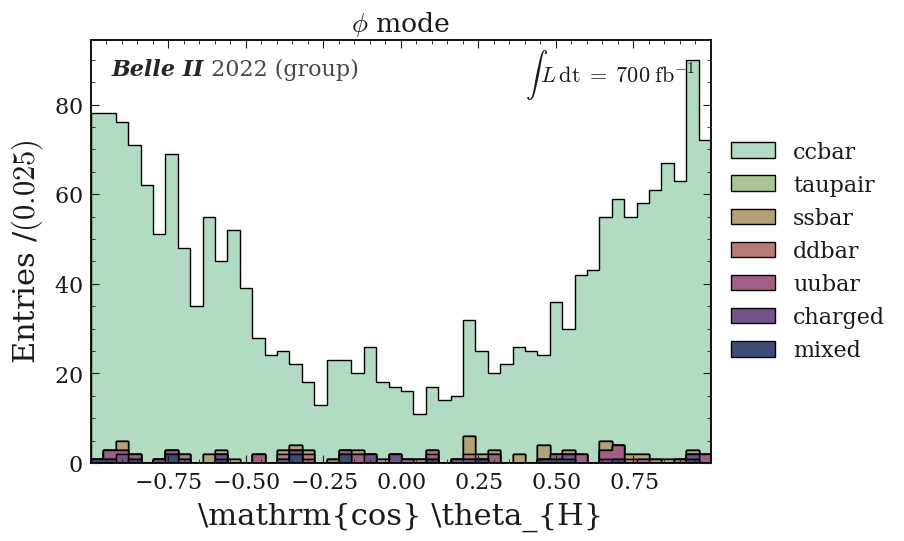

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


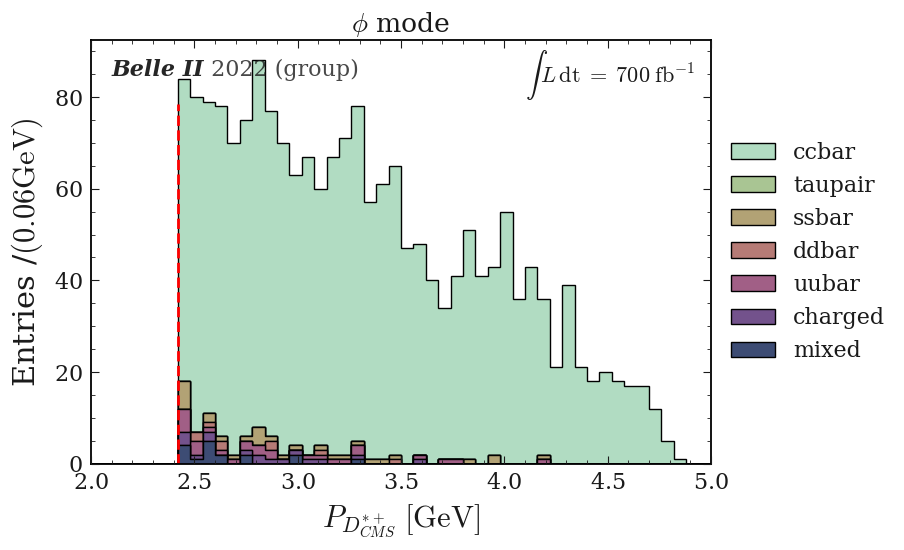

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


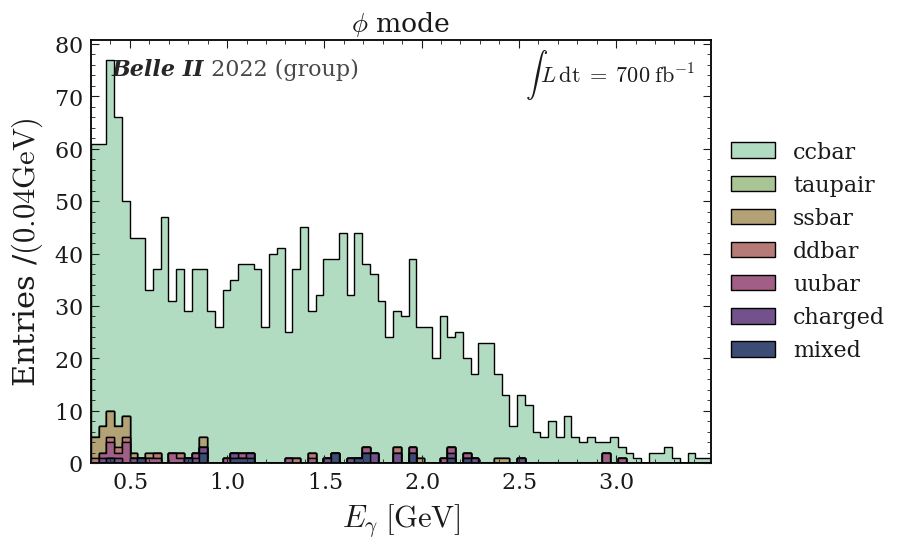

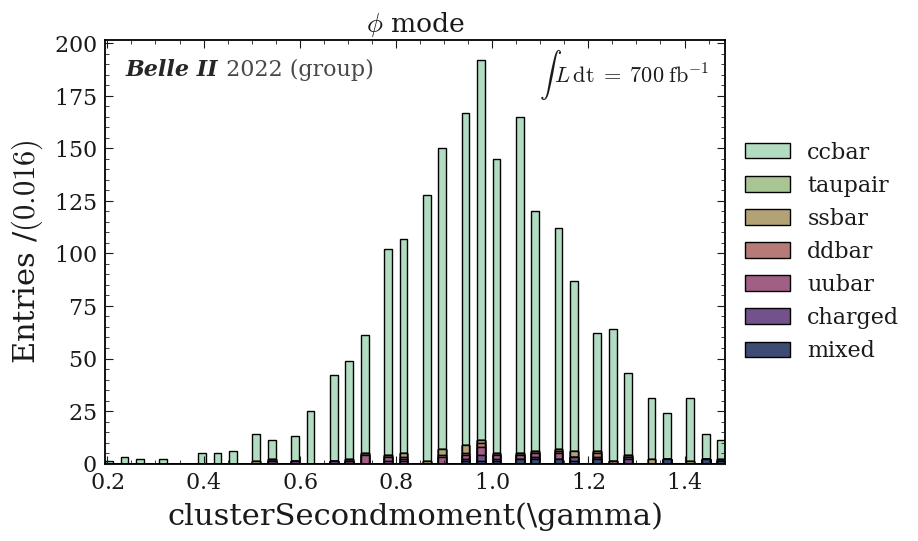

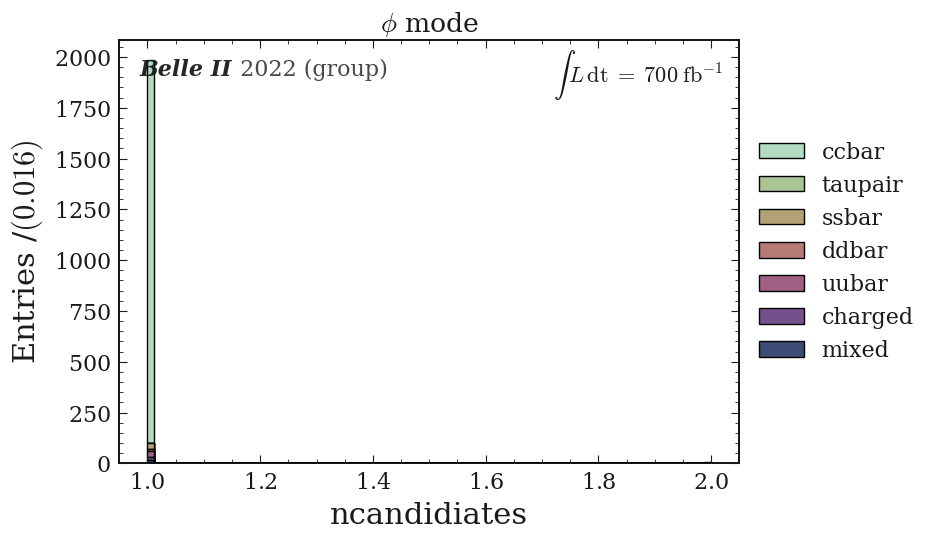

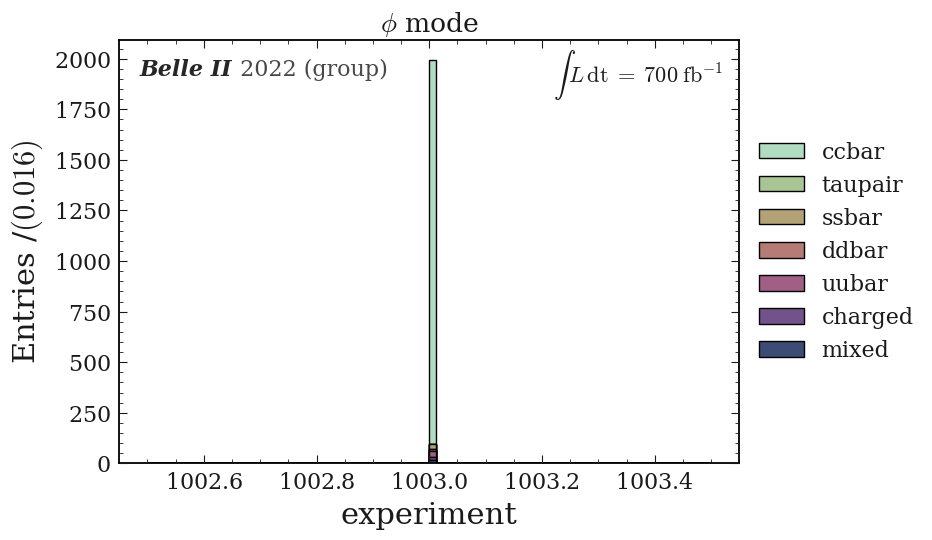

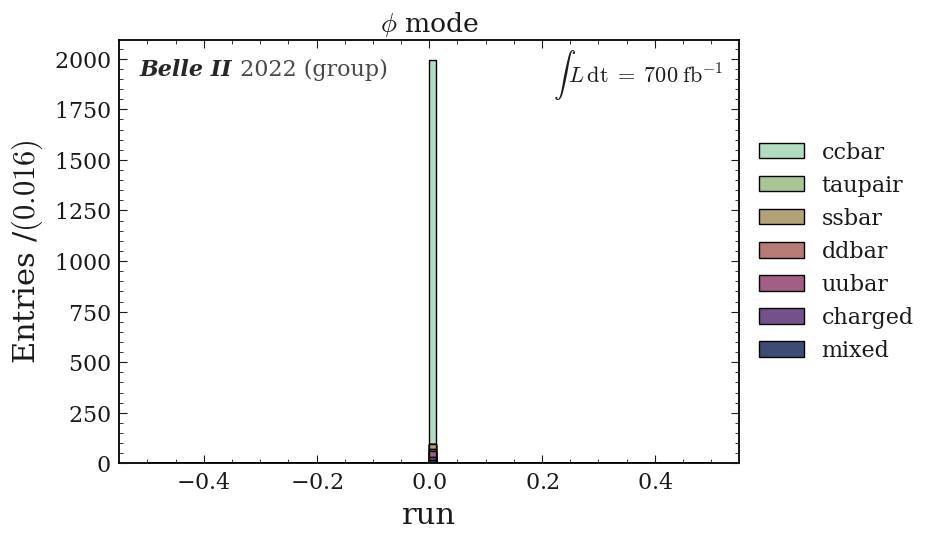

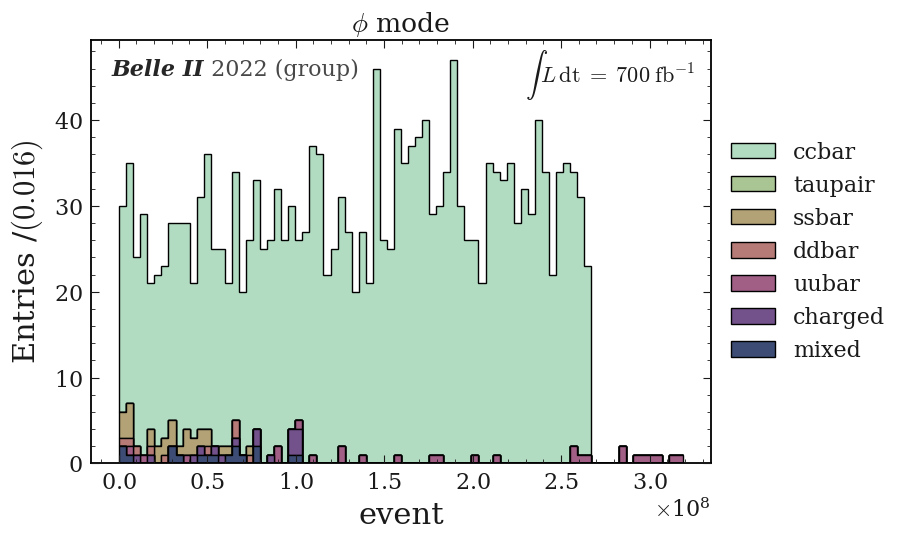

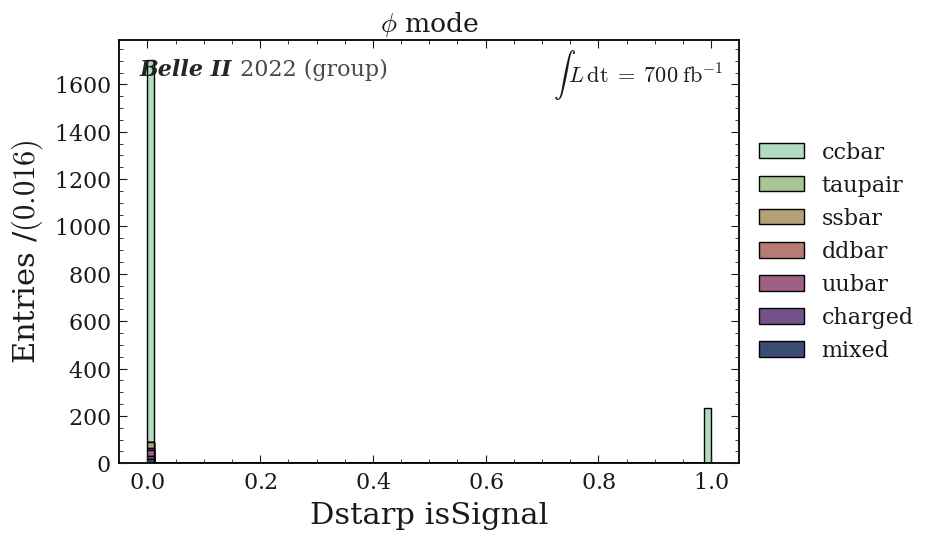

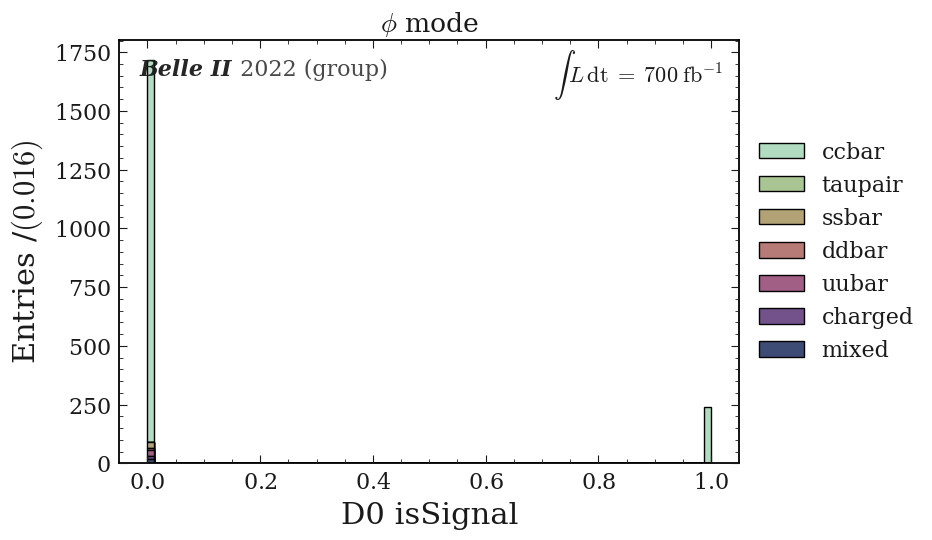

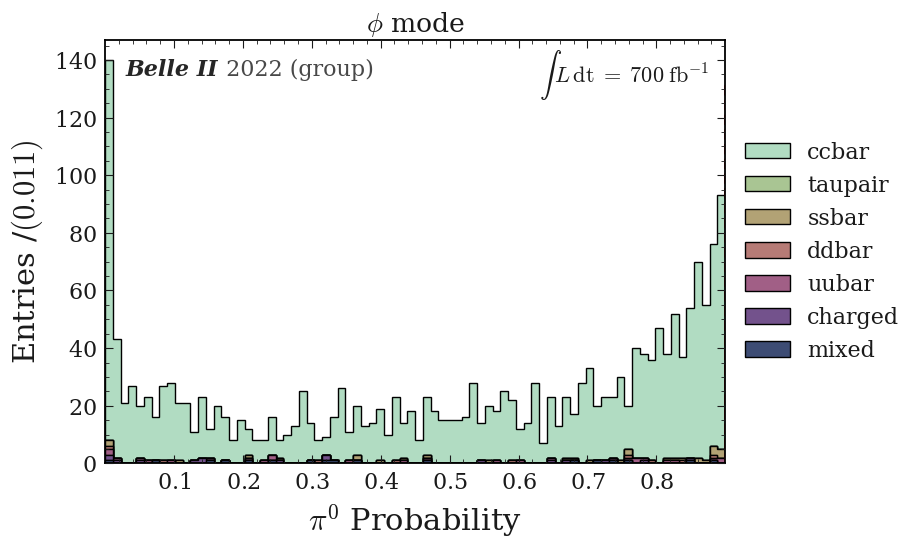

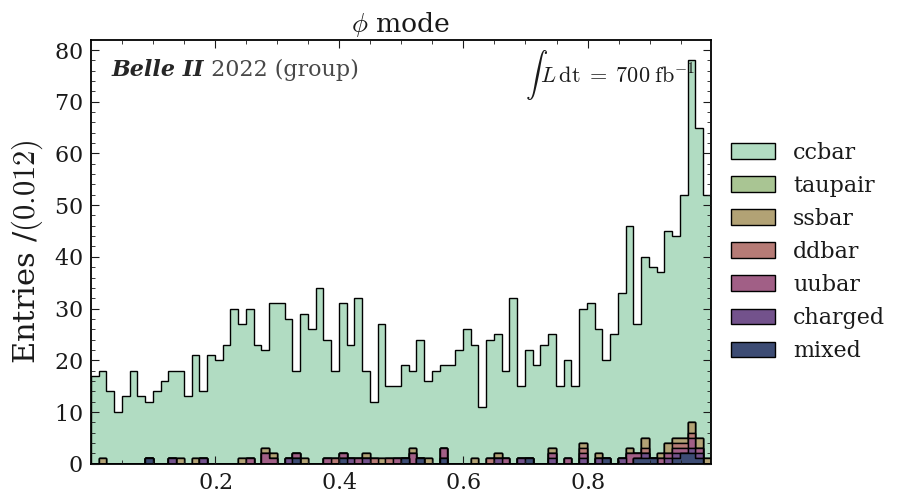

/home/jykim/workspace/DRAW/hist/draw_stack.py:319: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(data_merge_pd.min(), data_merge_pd.max())


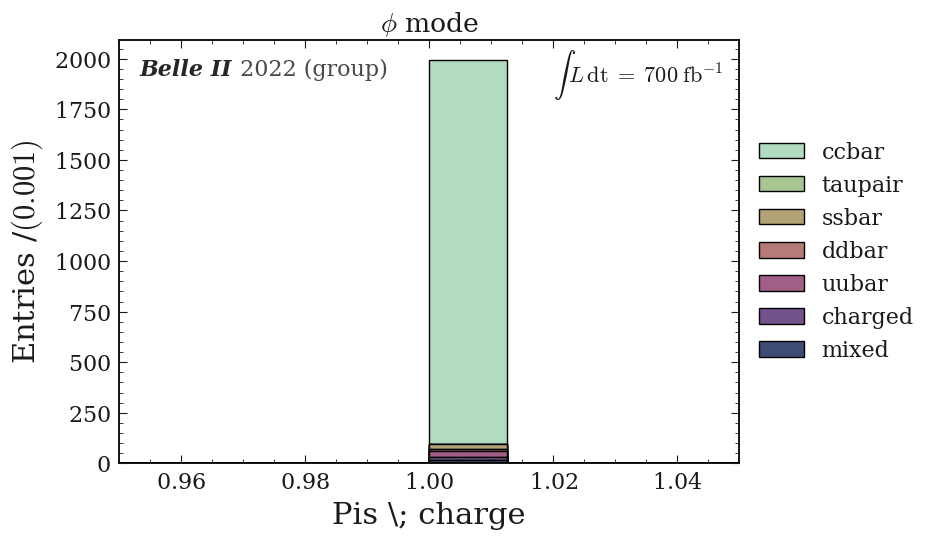

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


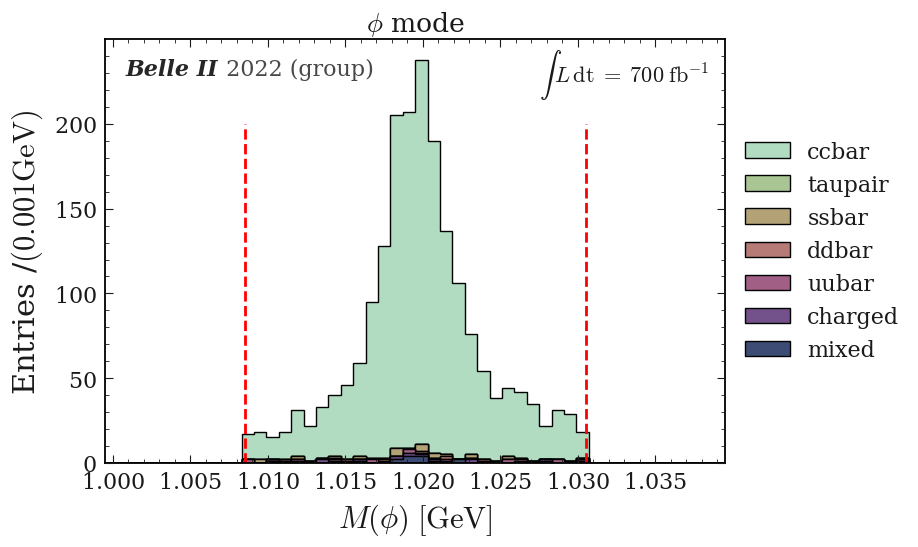

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [15]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

draw_stack_no_signal(figname="test",df=pd_phi_D0,bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


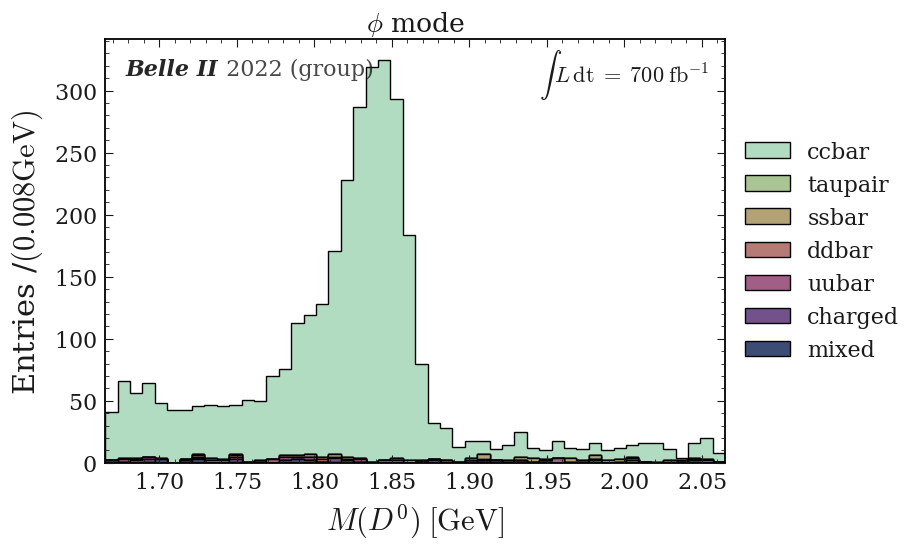

Q
$Q \; [\mathrm{GeV}]$


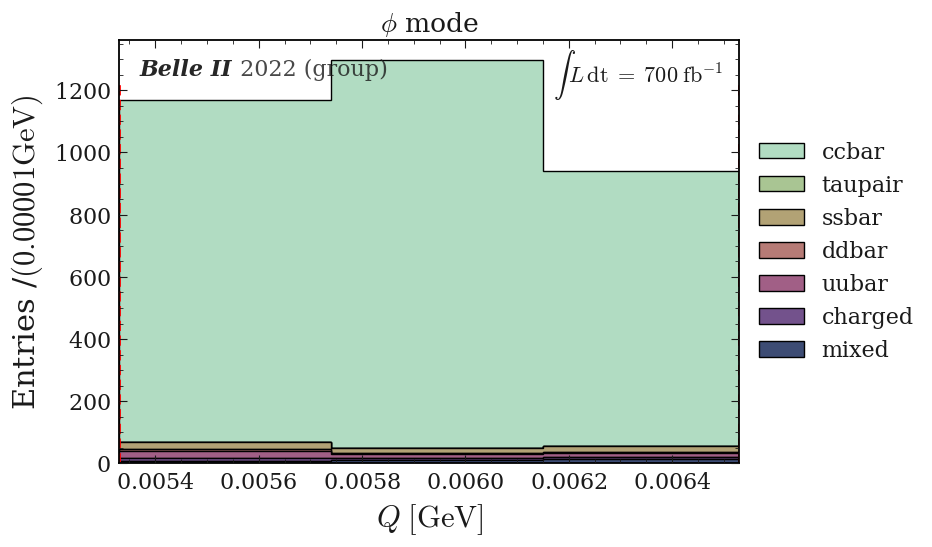

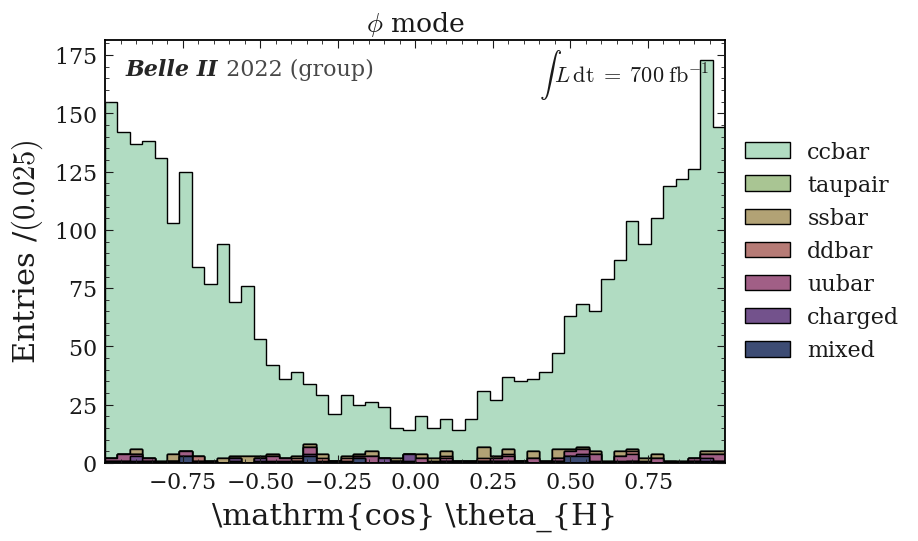

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


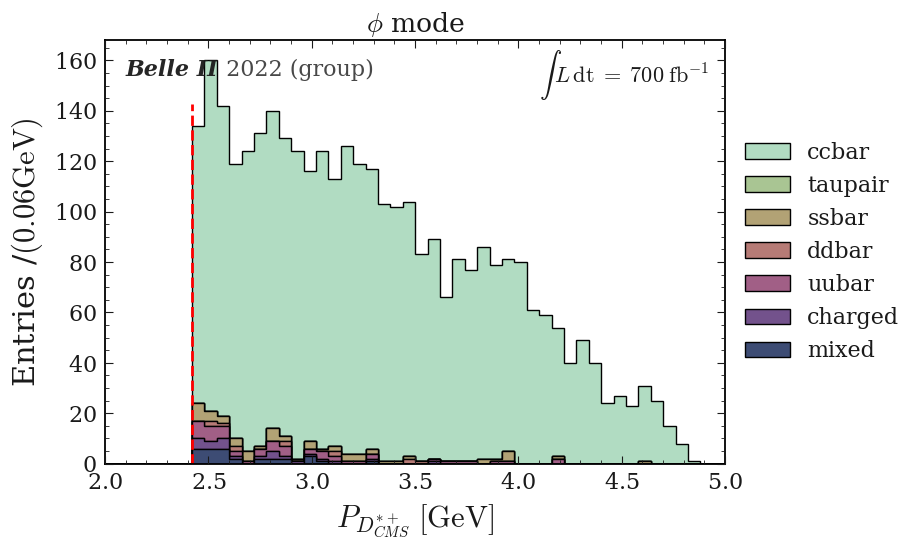

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


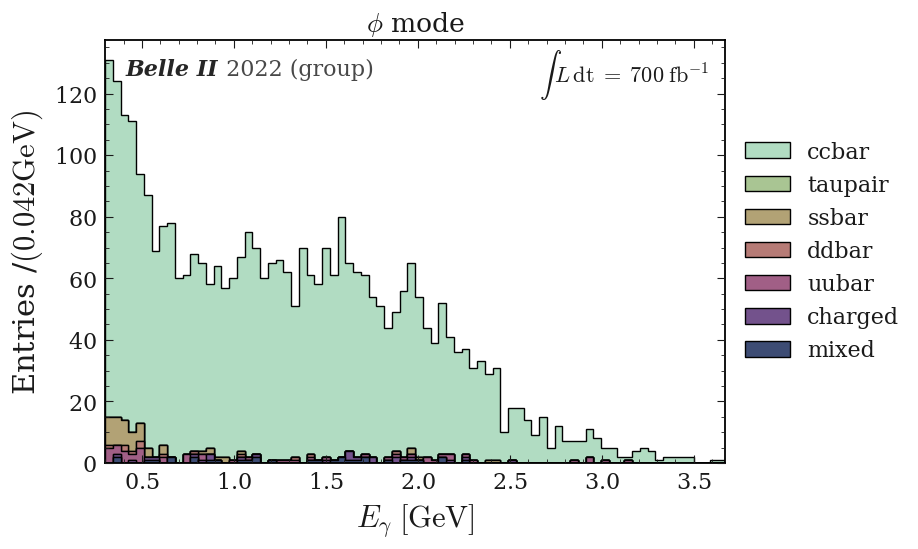

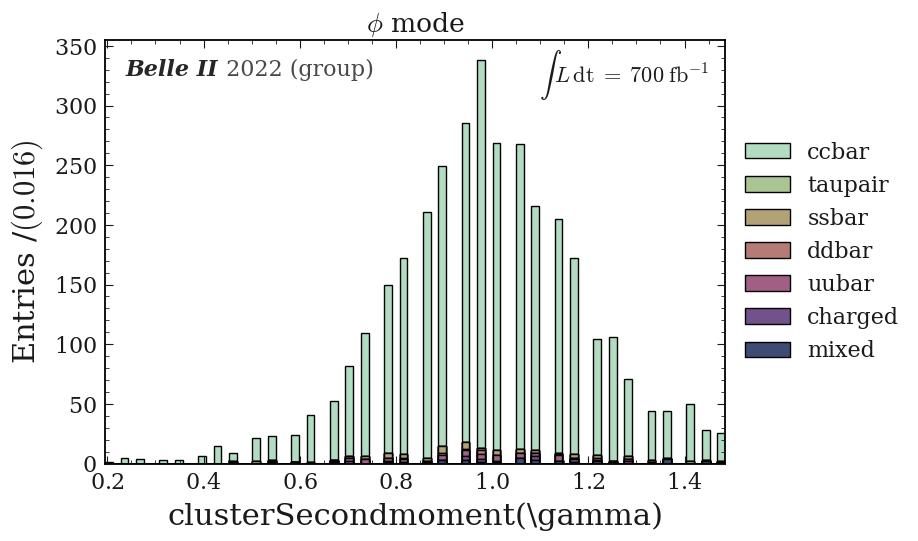

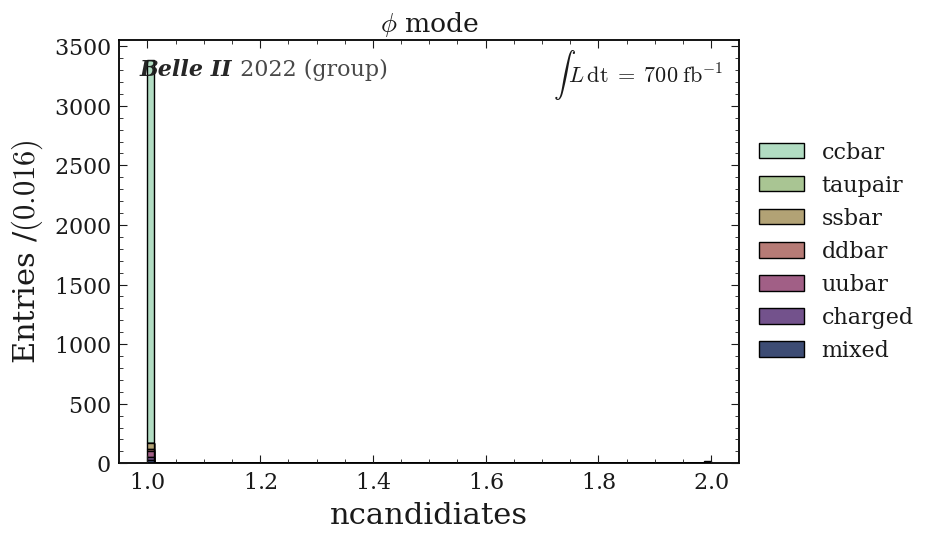

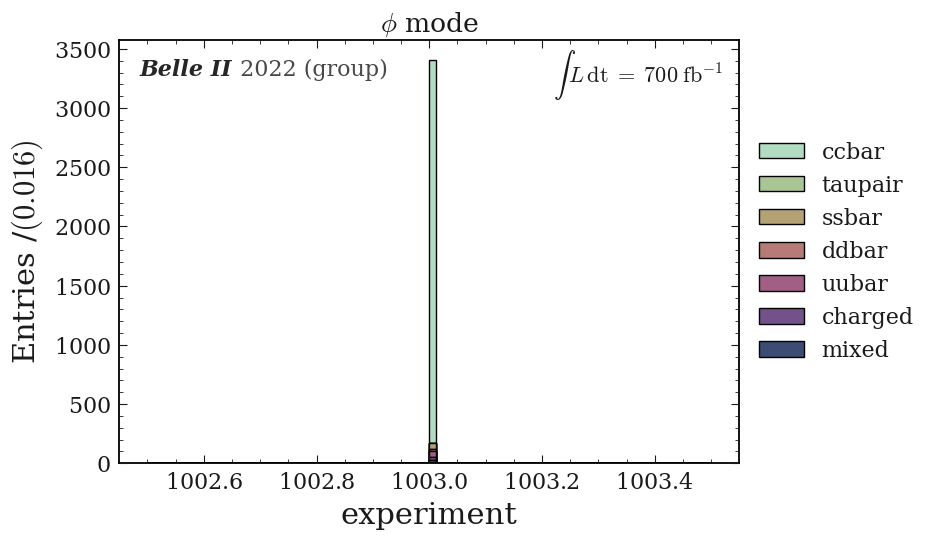

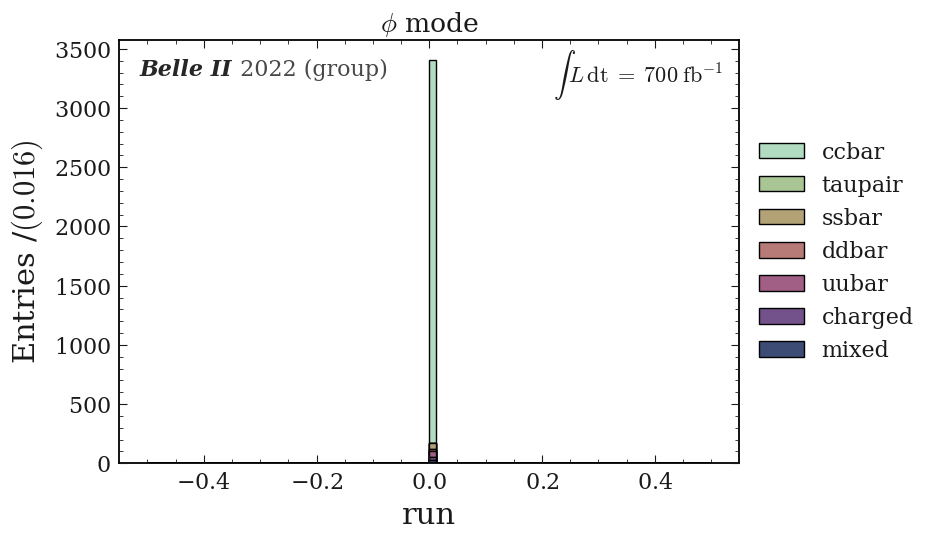

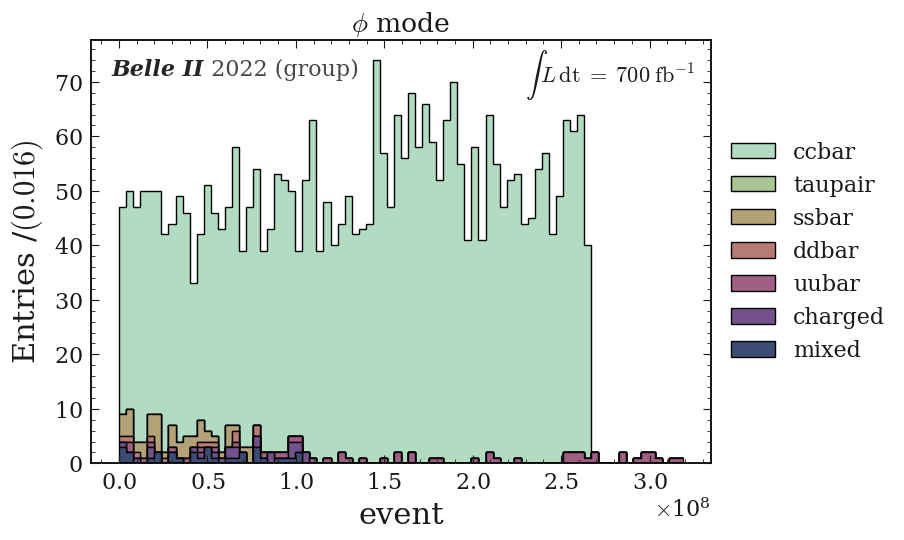

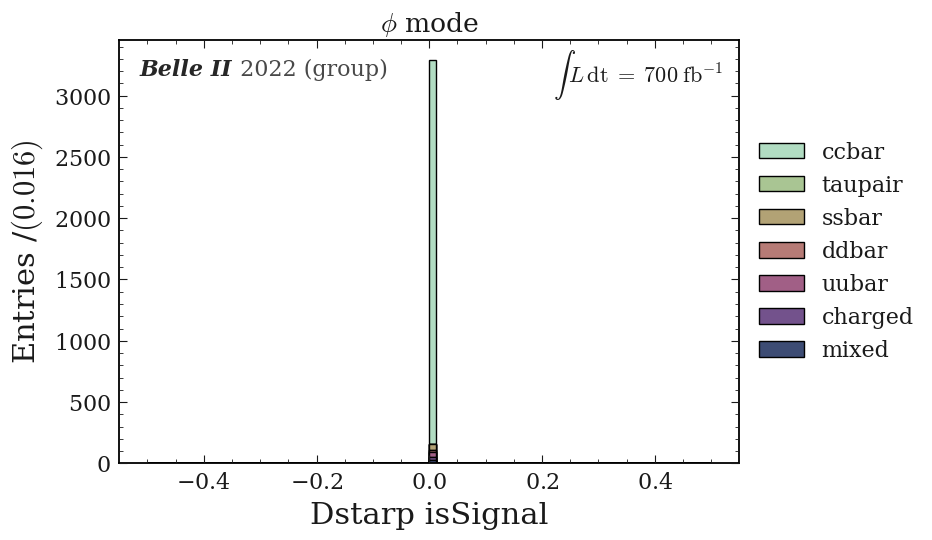

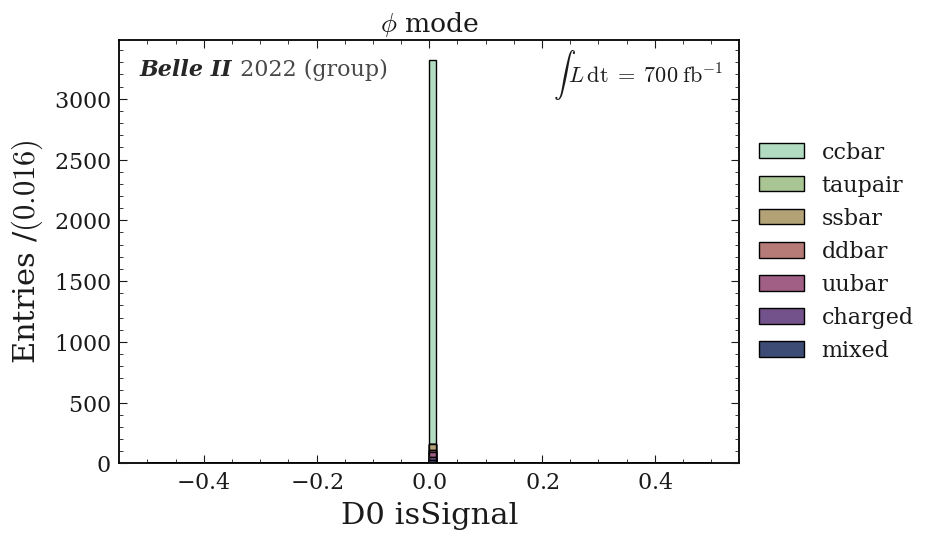

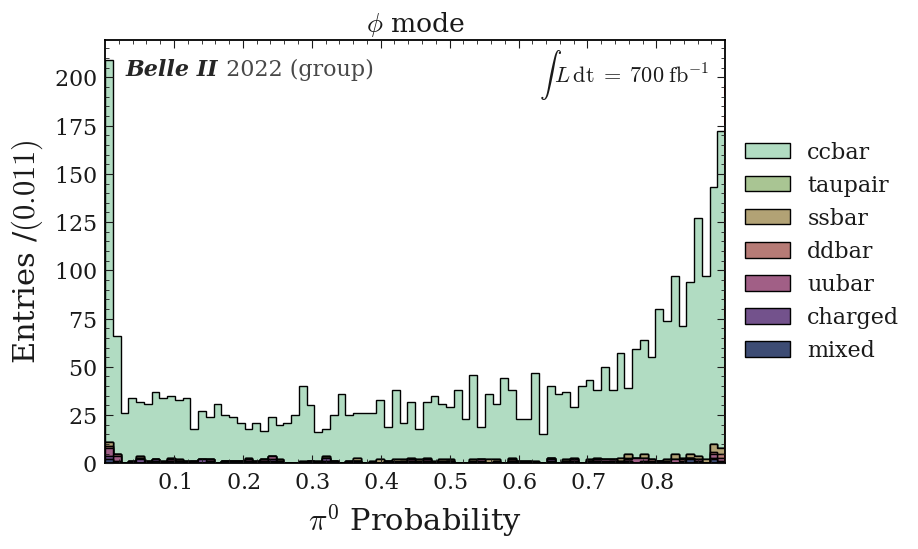

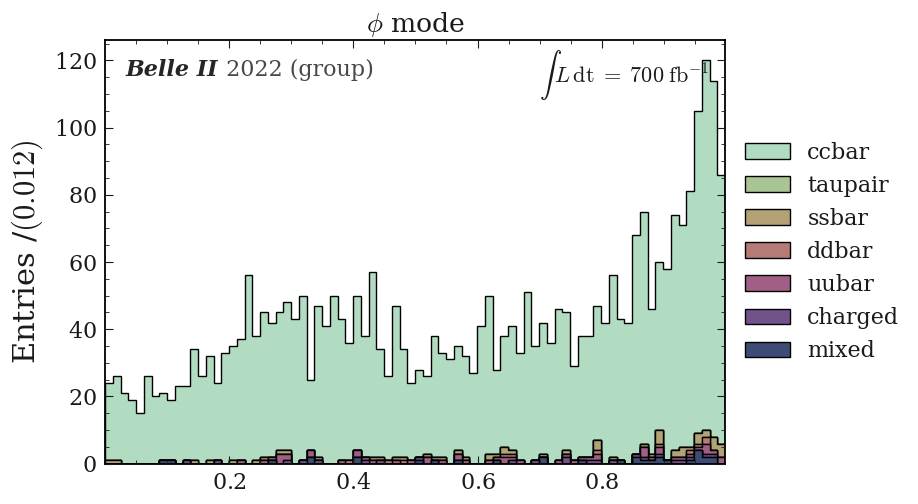

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


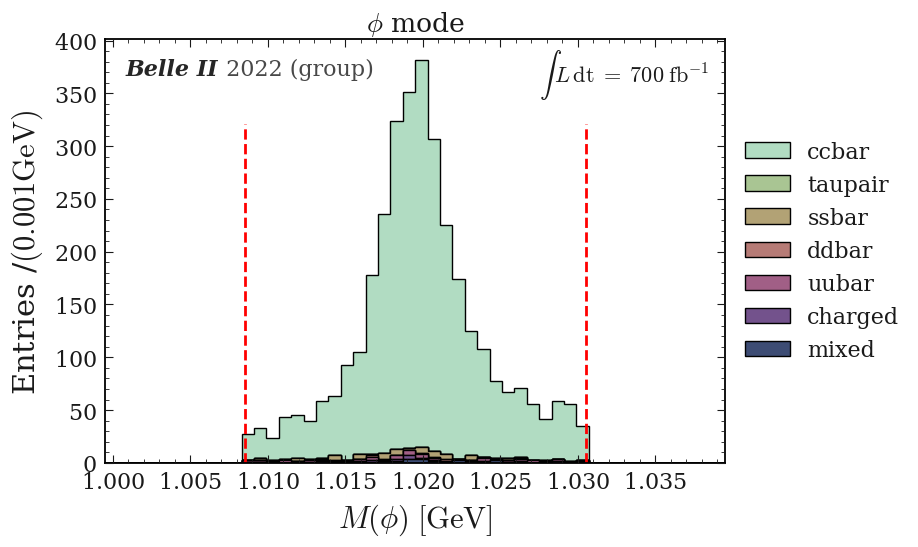

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [23]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

draw_stack_no_signal(figname="test",df=pd_phi,bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


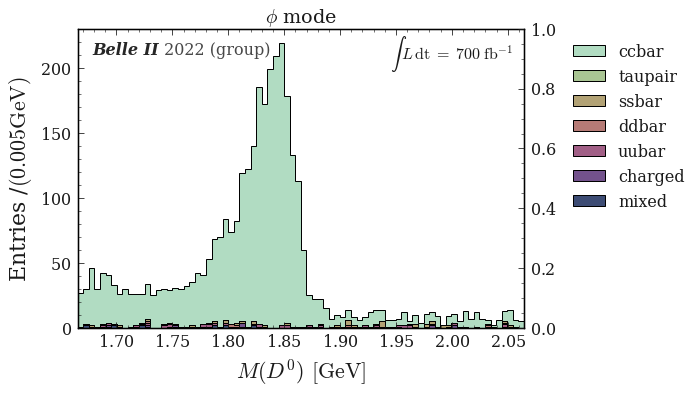

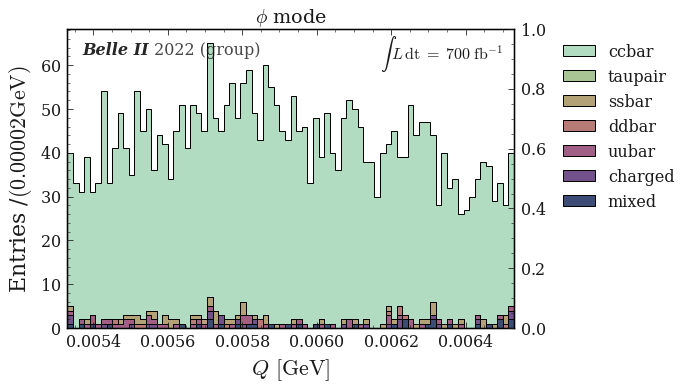

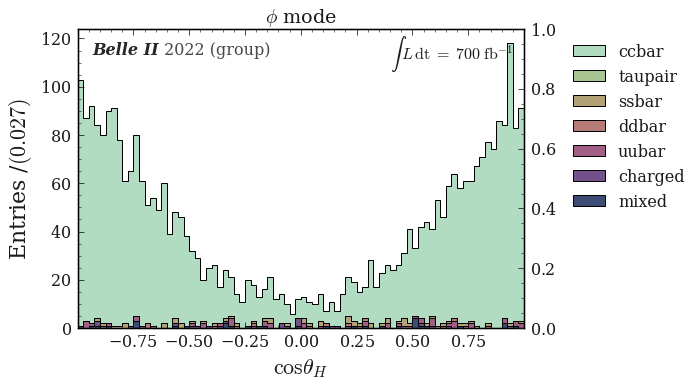

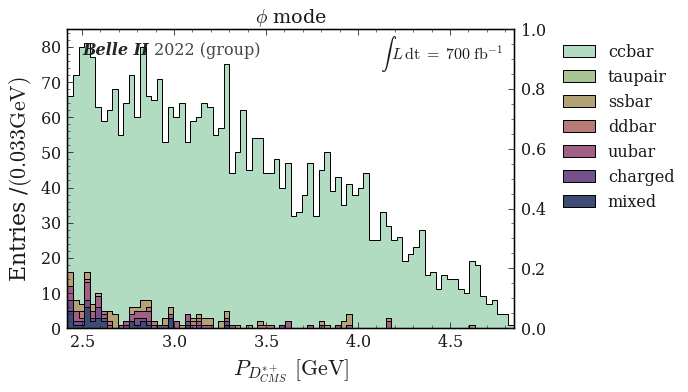

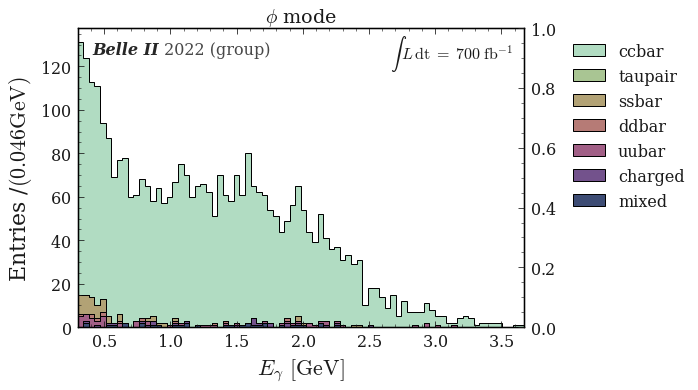

...

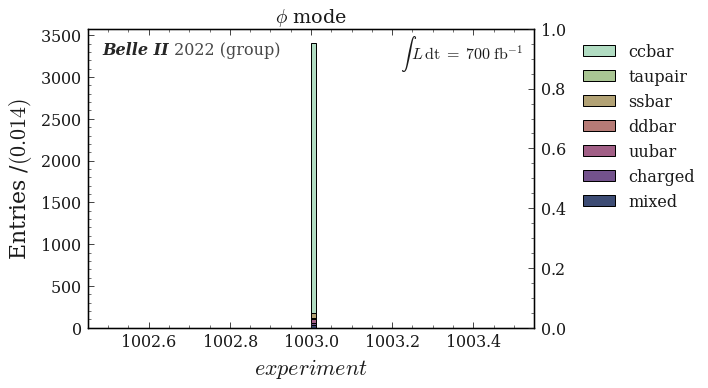

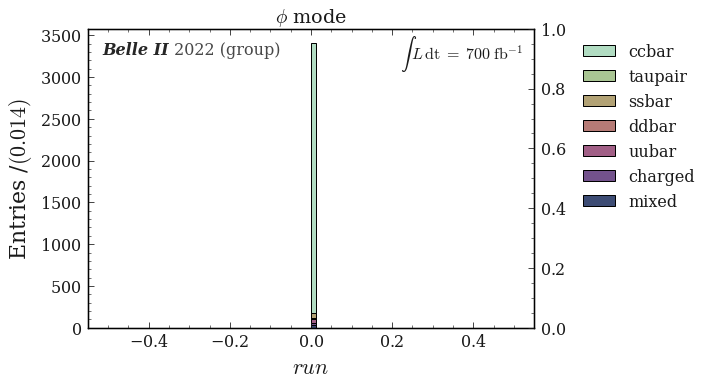

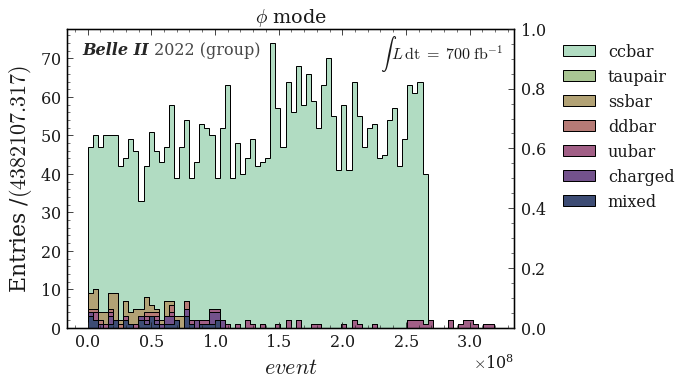

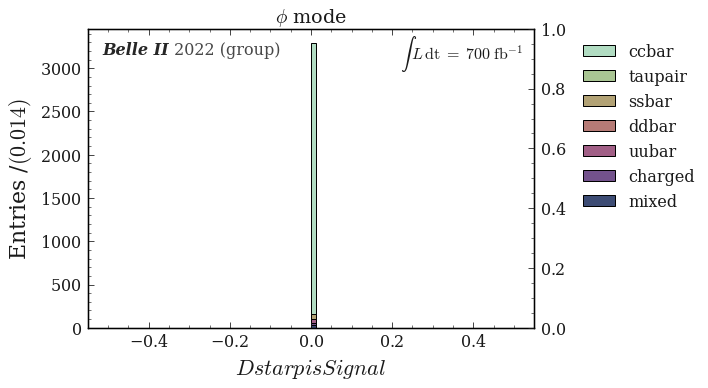

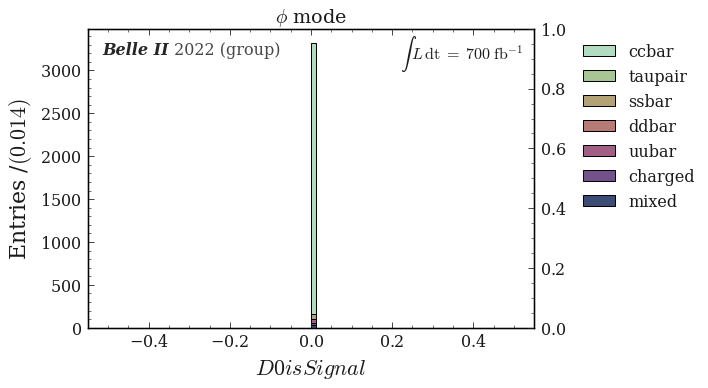

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

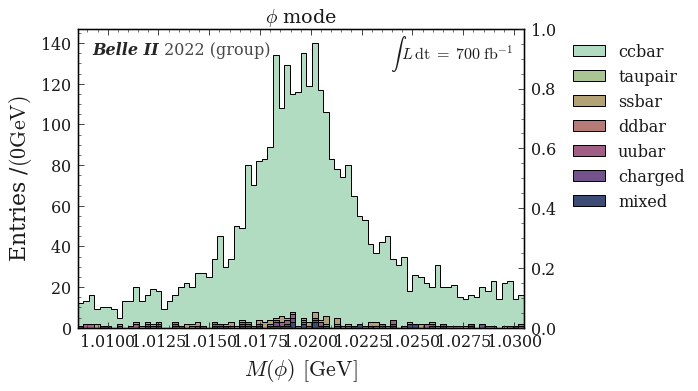

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [13]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_phi[pd_phi['Pi0_Prob']<0.9],bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## rho

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


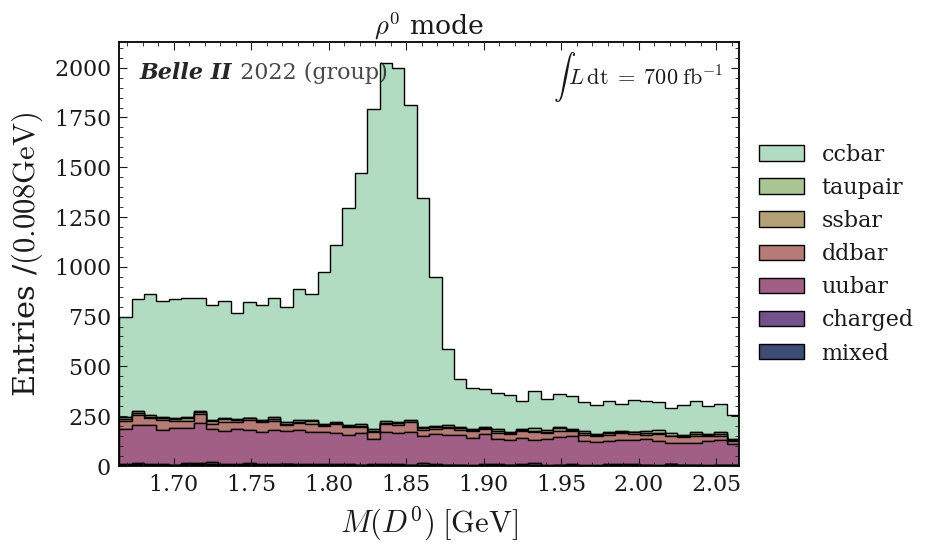

Q
$Q \; [\mathrm{GeV}]$


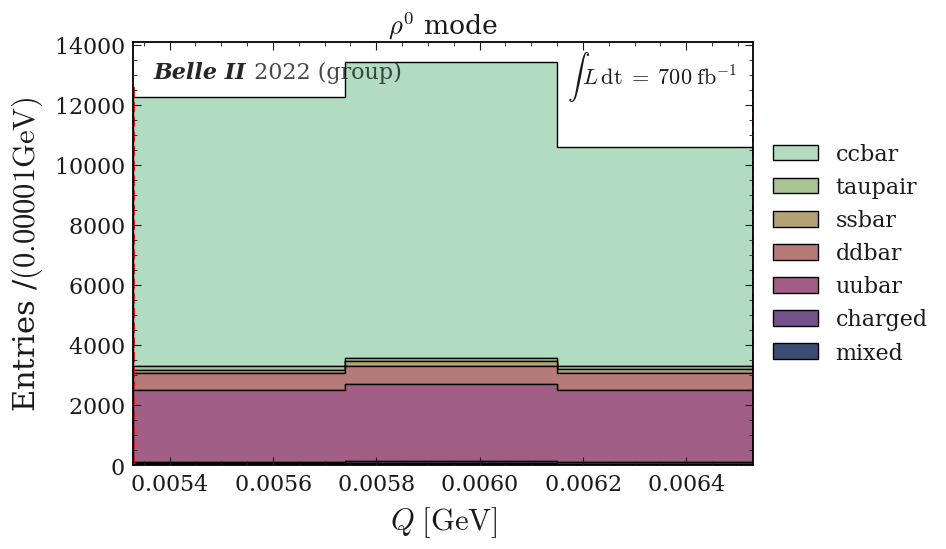

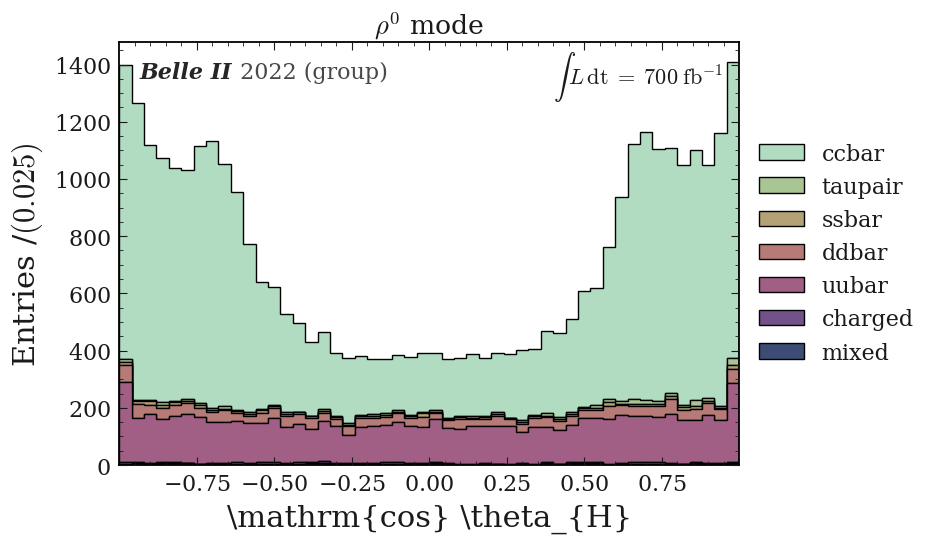

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


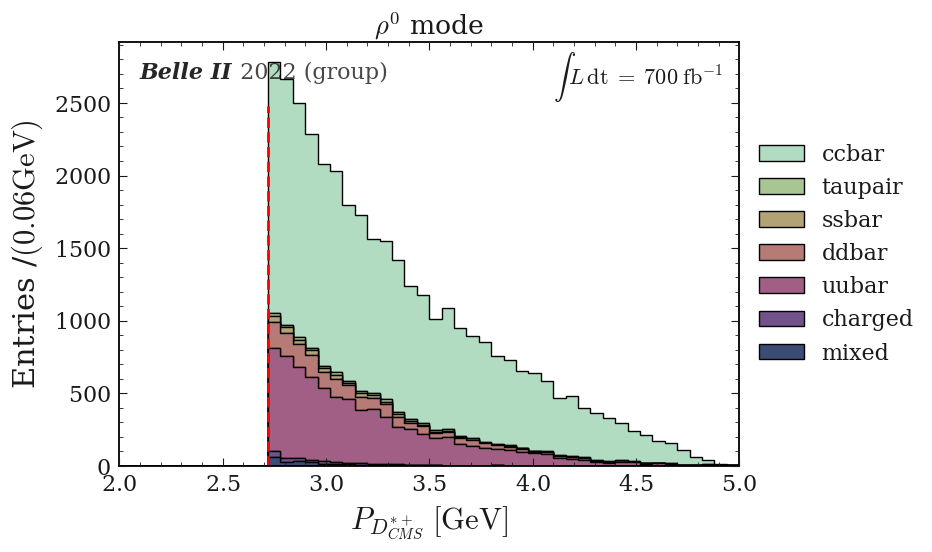

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


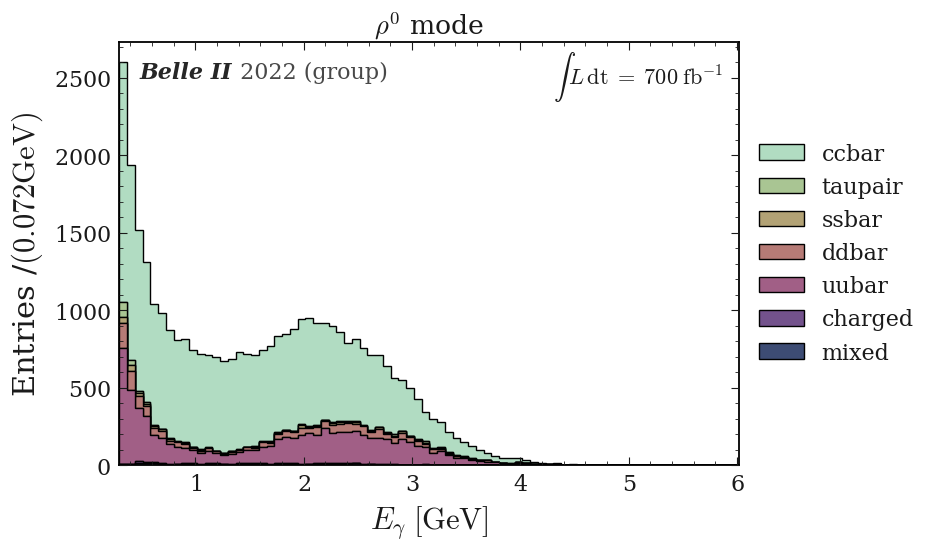

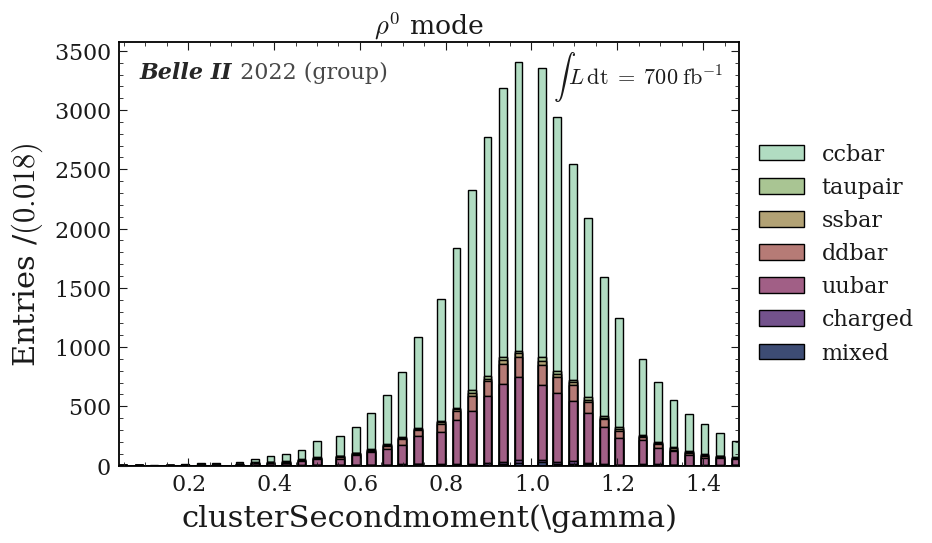

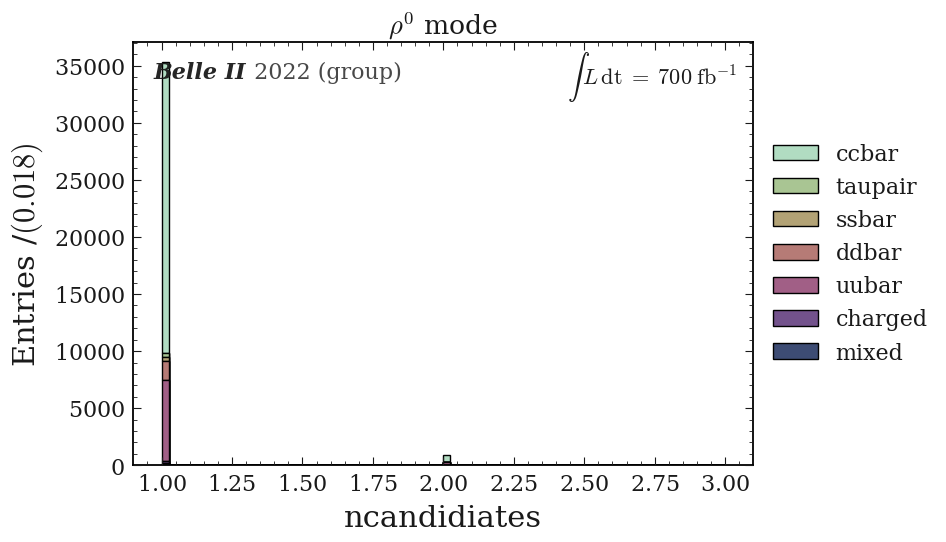

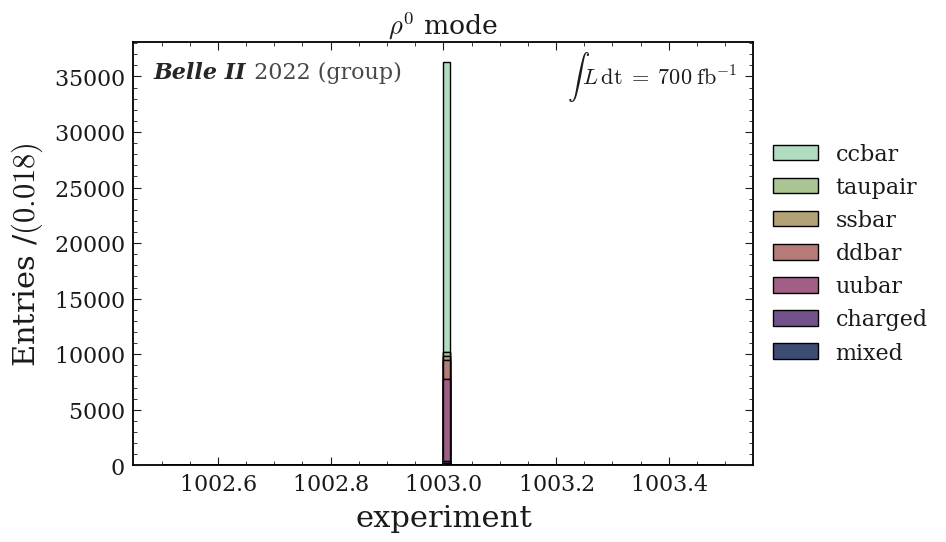

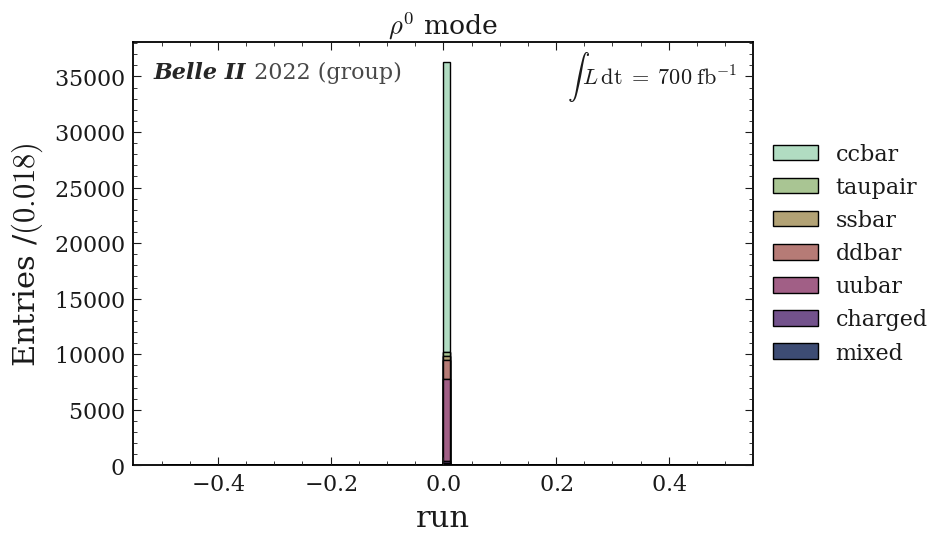

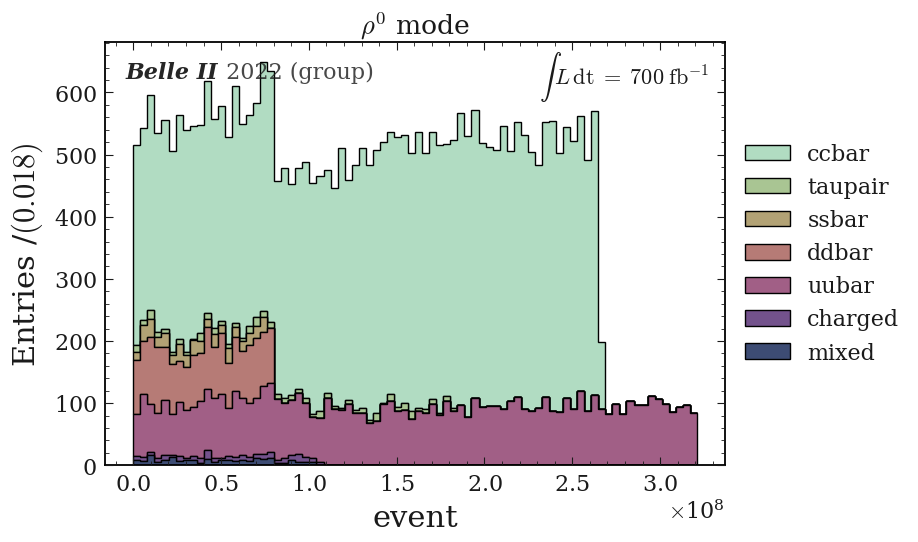

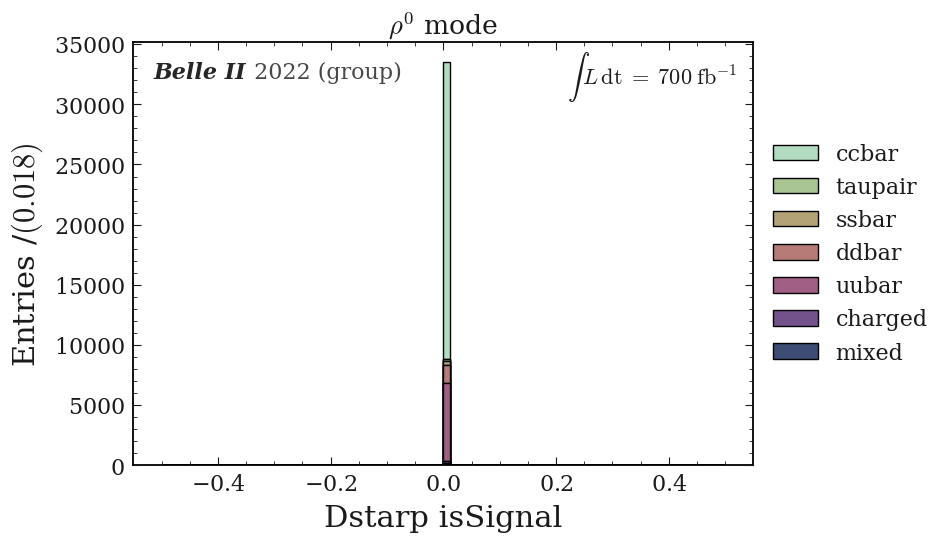

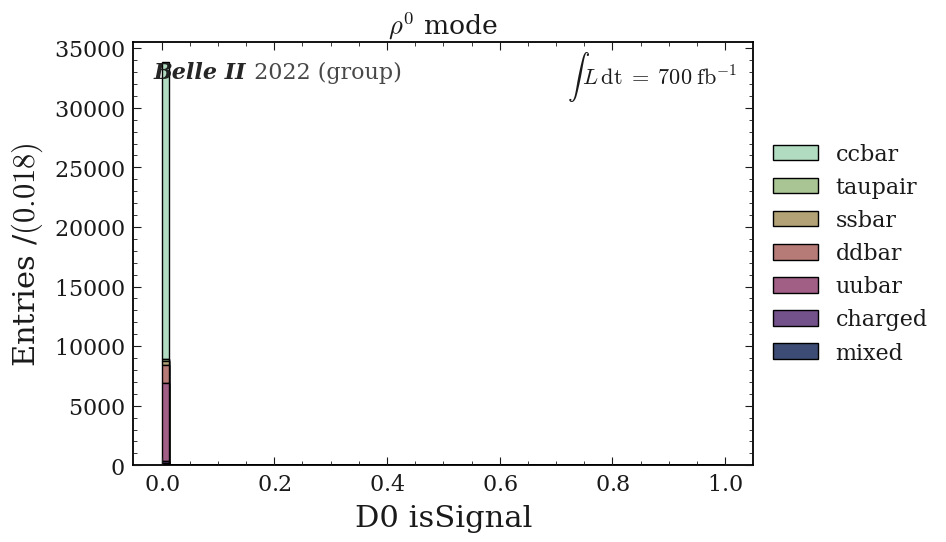

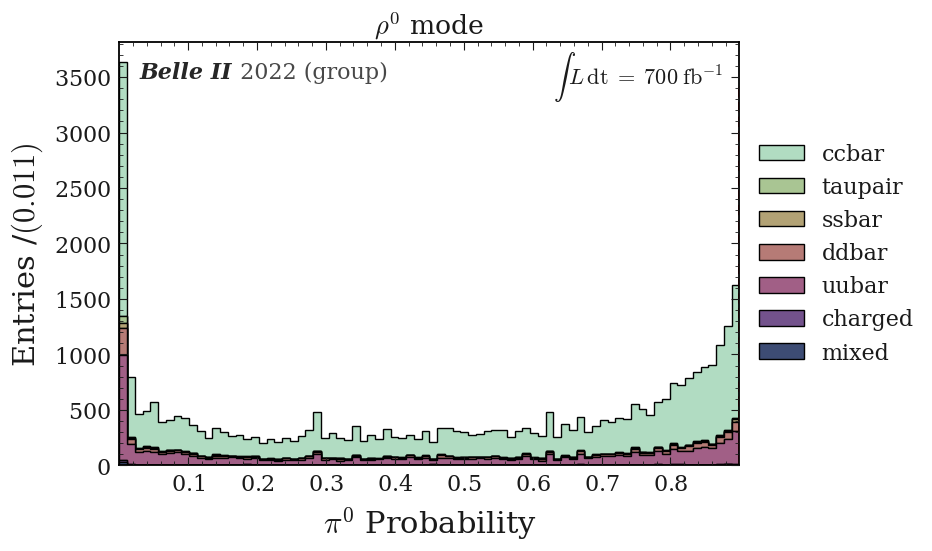

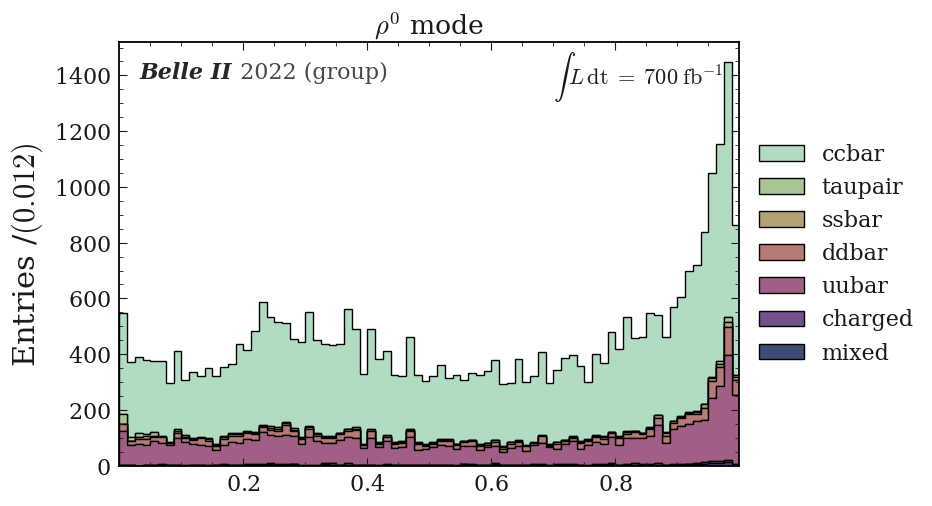

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


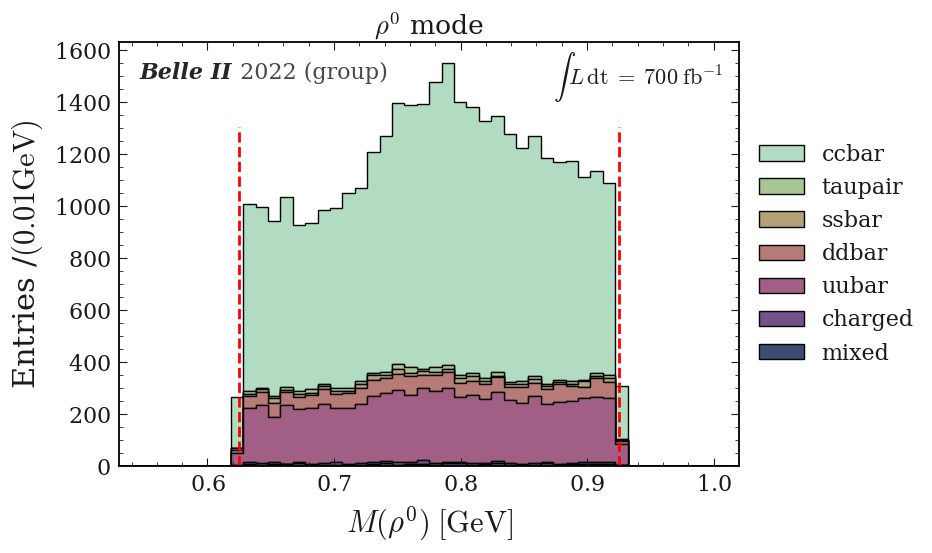

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [52]:
plot_title = r'$\rho^0$ mode'
var_unit= read_yaml_to_dict("vars_name_units")

var_unit= var_unit['units']

var_name= read_yaml_to_dict("vars_name_units")
var_name= var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(figname="test",df=pd_rho,bins=80, vector='rho', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


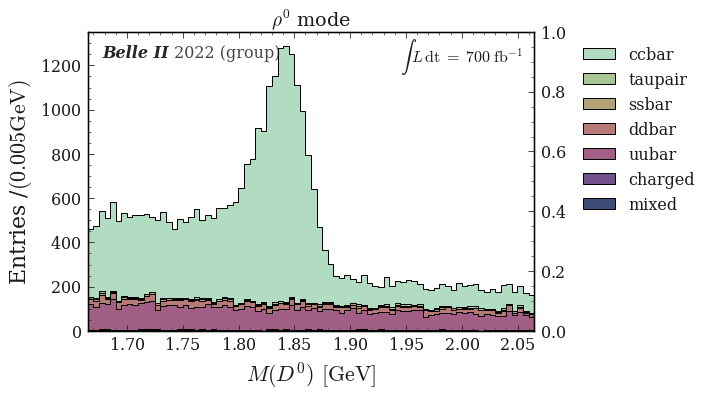

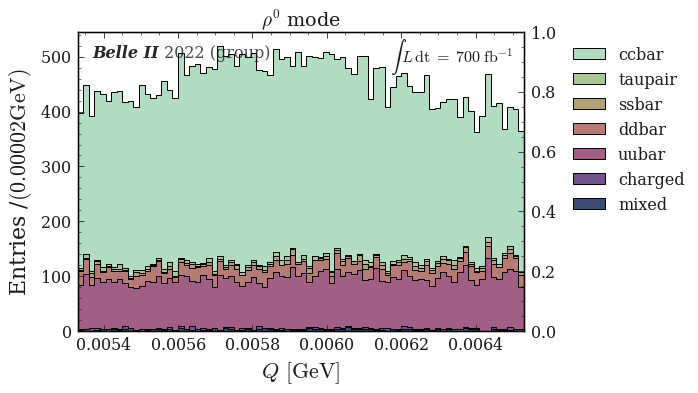

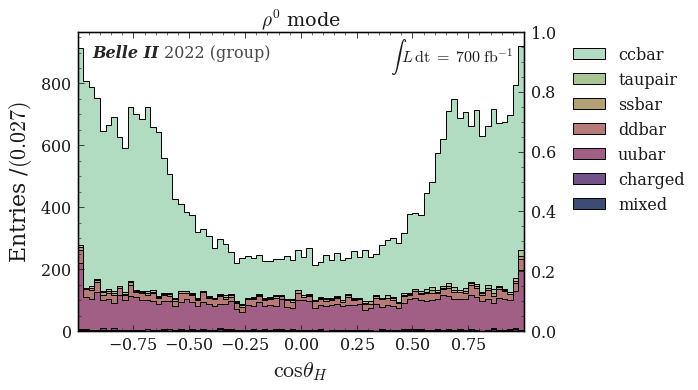

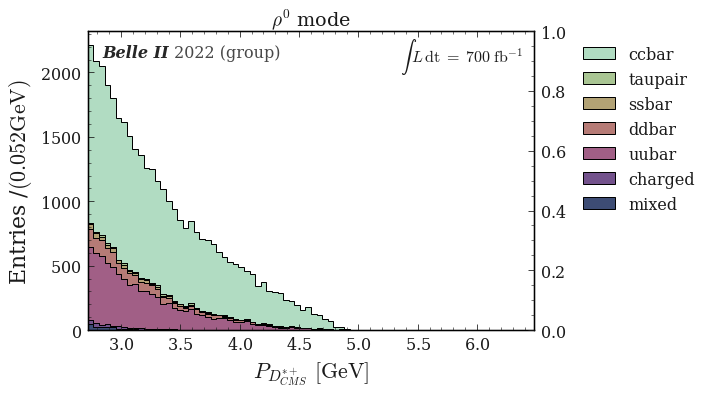

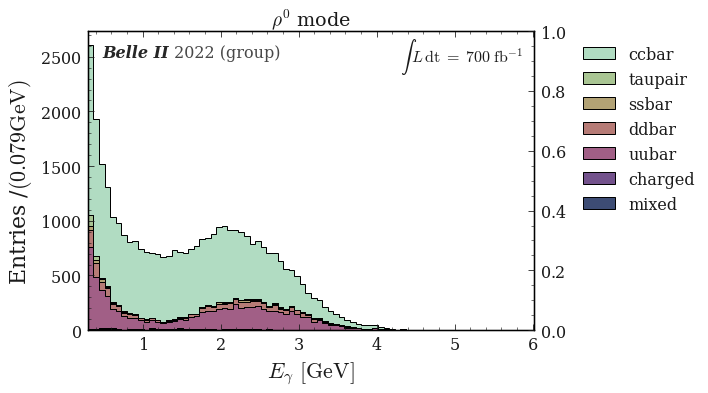

...

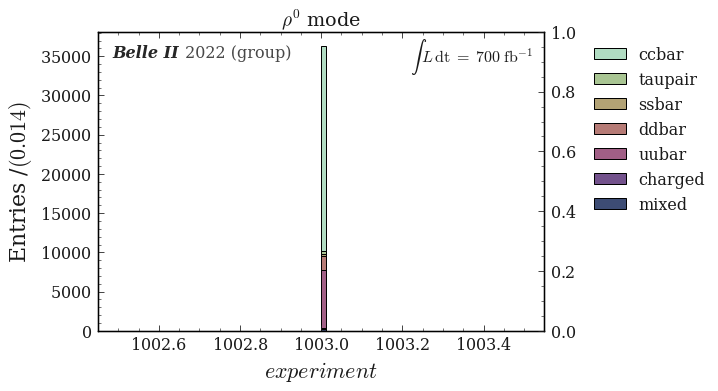

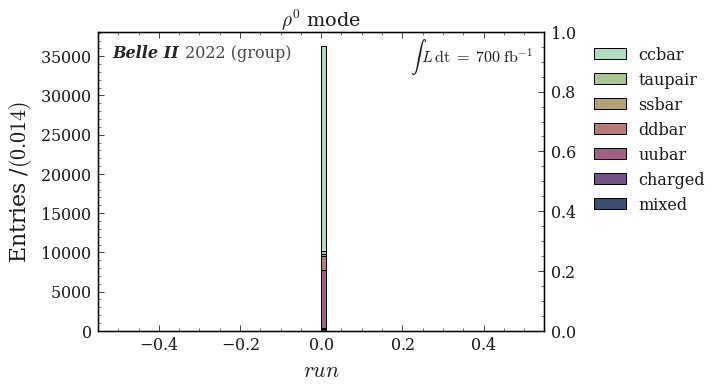

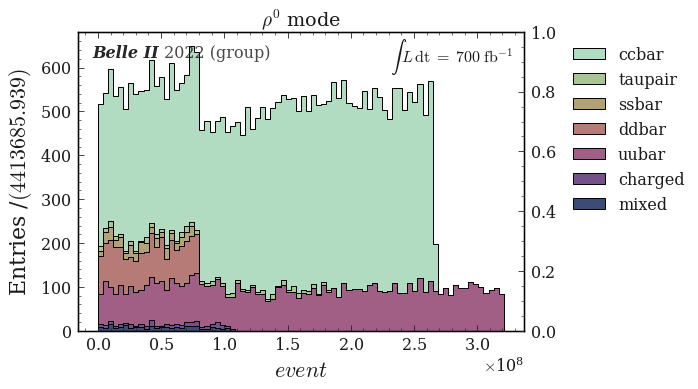

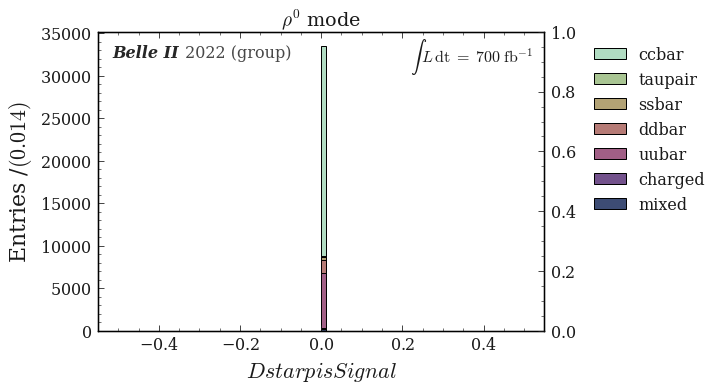

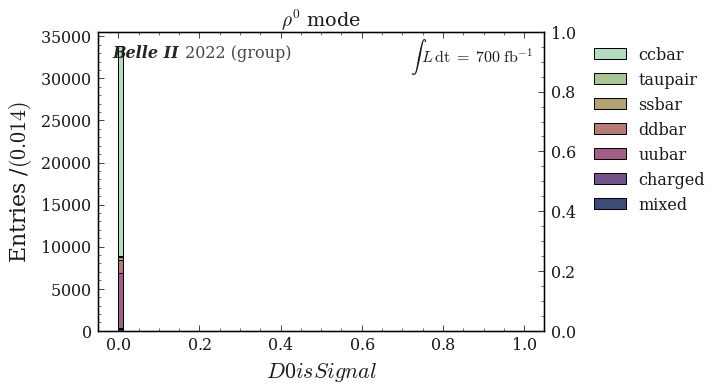

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

ValueError: 
$M(ho^0)$ $[\mathrm{GeV}]$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [39]:
plot_title = r'$\rho^0$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_rho[pd_rho['Pi0_Prob']<0.9 ],bins=80, vector='rho', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


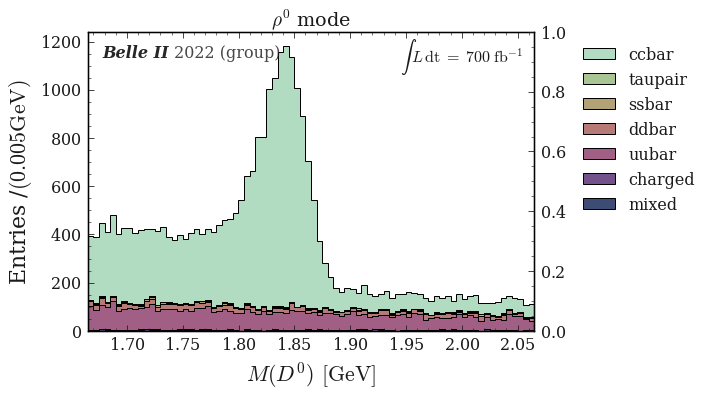

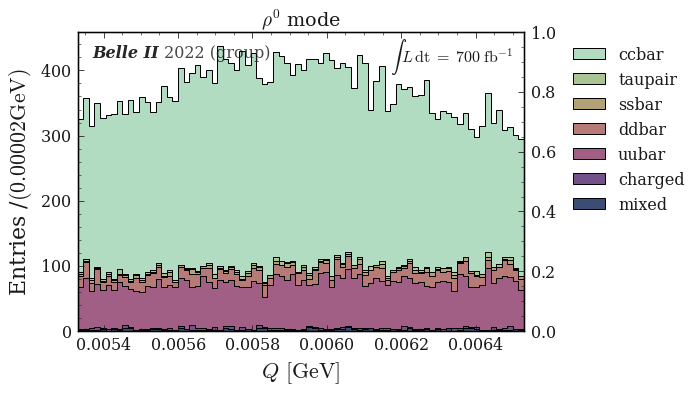

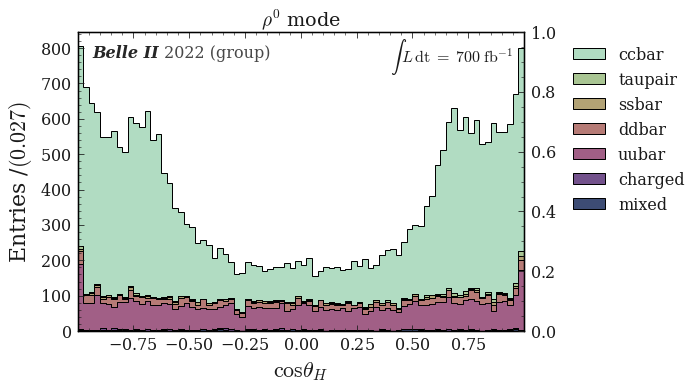

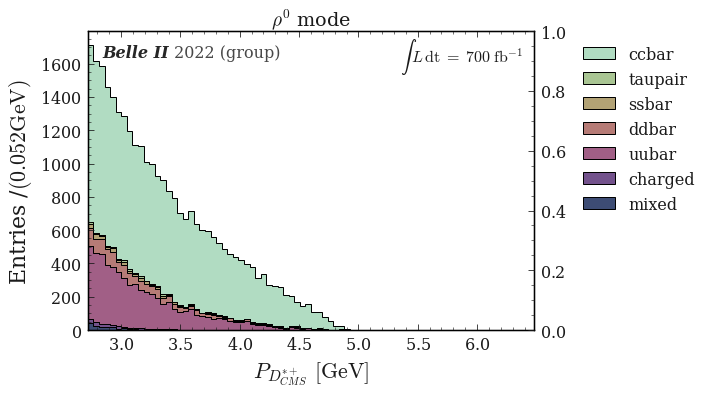

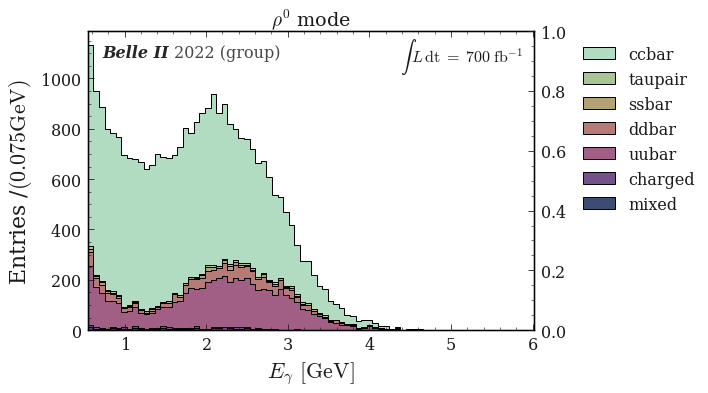

...

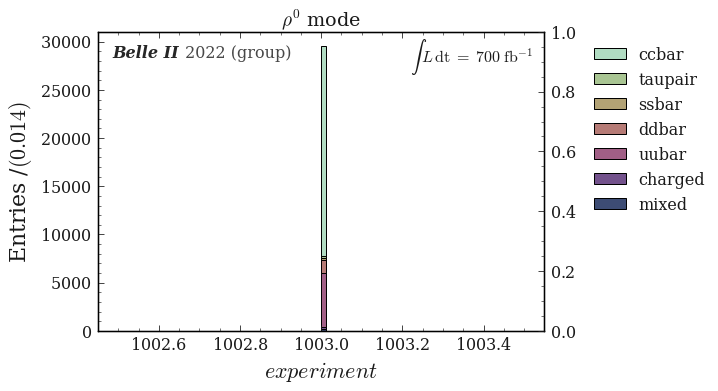

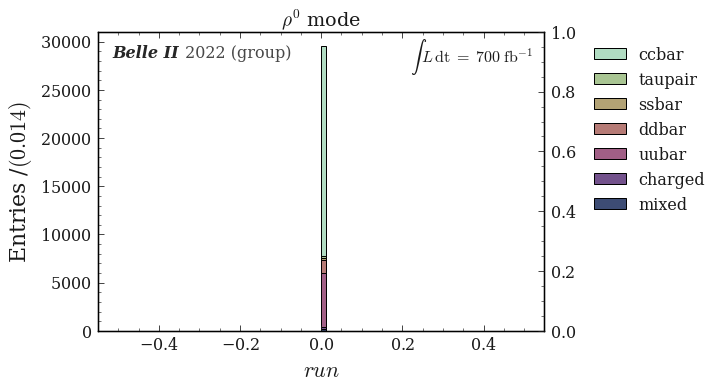

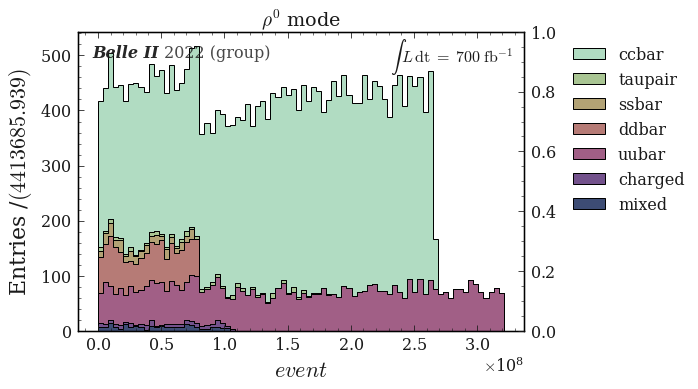

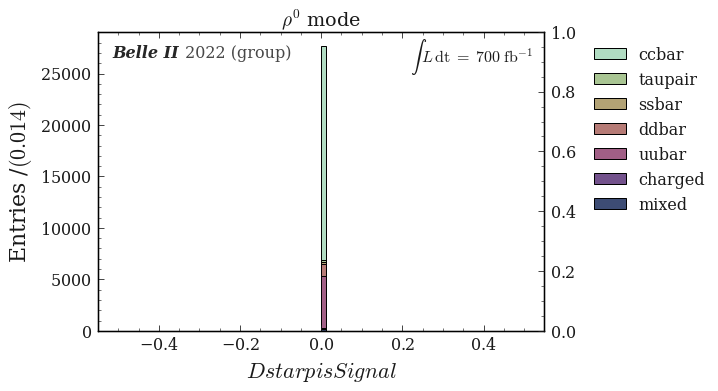

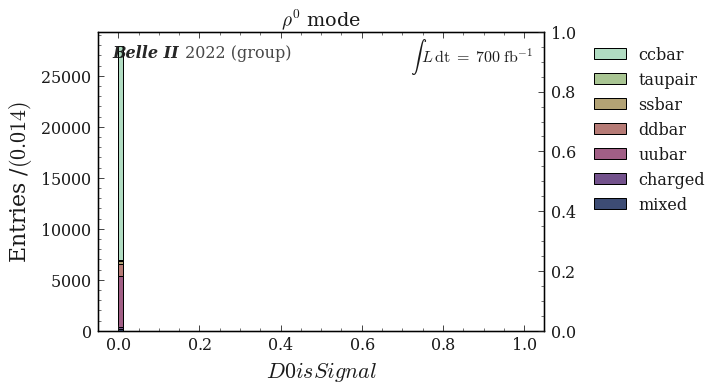

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

ValueError: 
$M(ho^0)$ $[\mathrm{GeV}]$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [52]:
plot_title = r'$\rho^0$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_rho[(pd_rho['Pi0_Prob']<0.9) &  (pd_rho['gamma_E']>0.55) ],bins=80, vector='rho', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## antiKstar

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


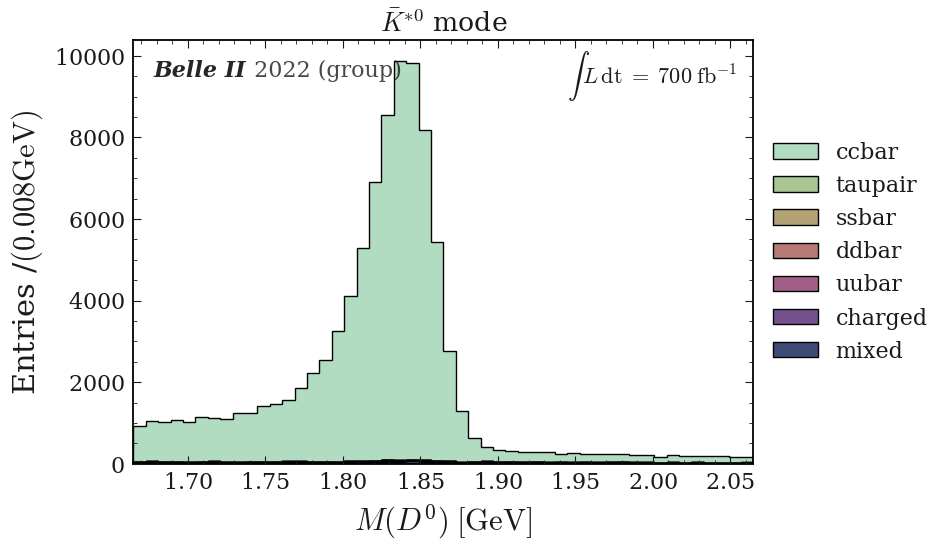

Q
$Q \; [\mathrm{GeV}]$


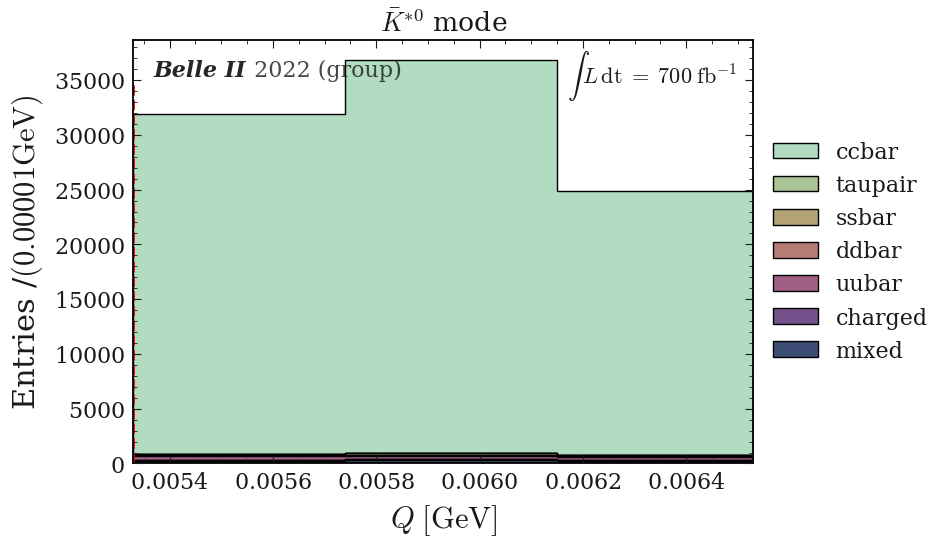

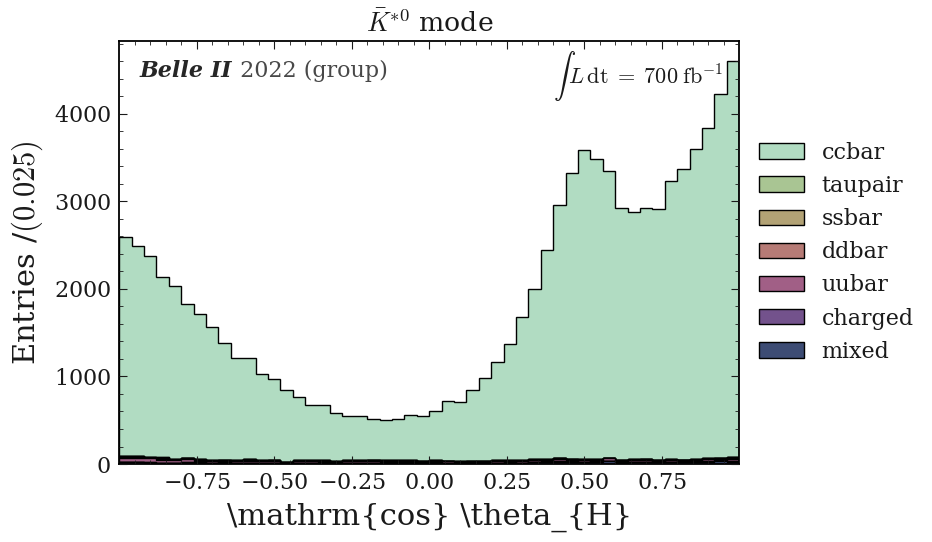

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


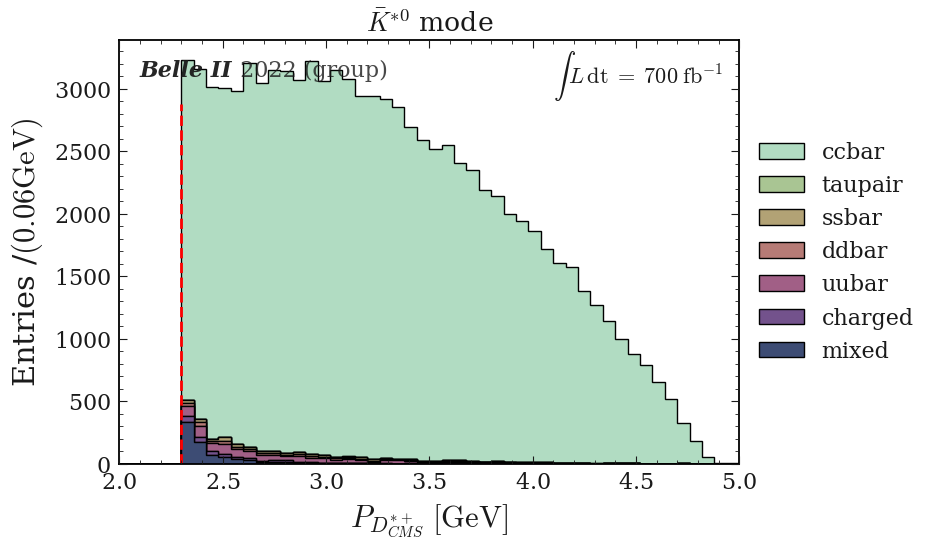

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


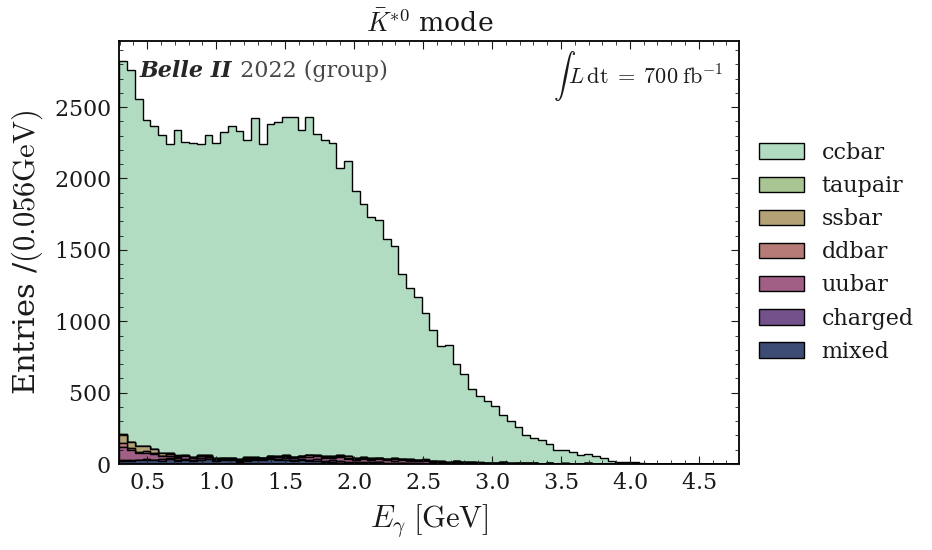

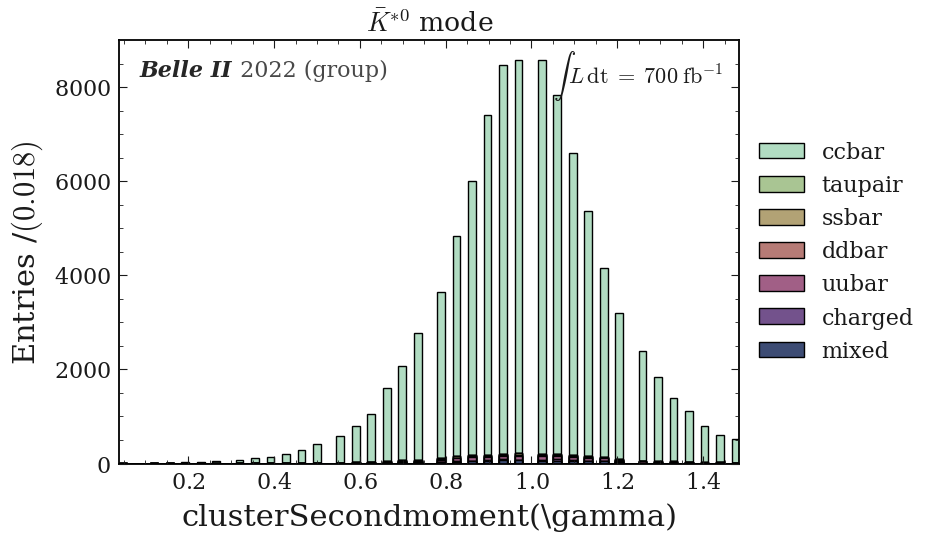

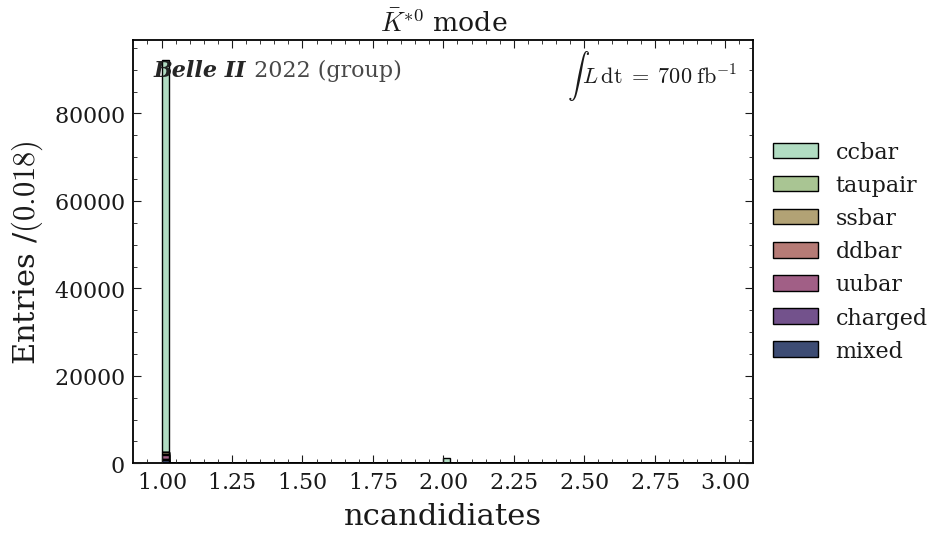

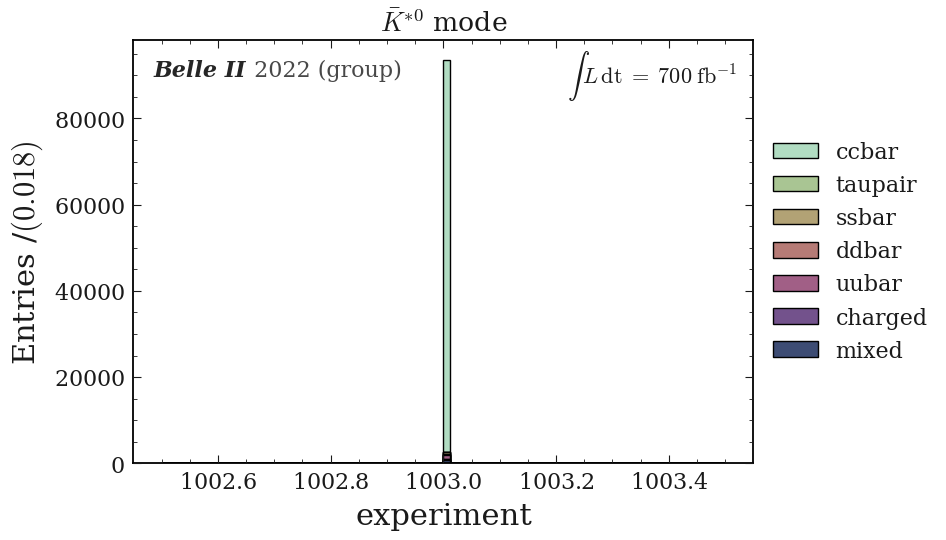

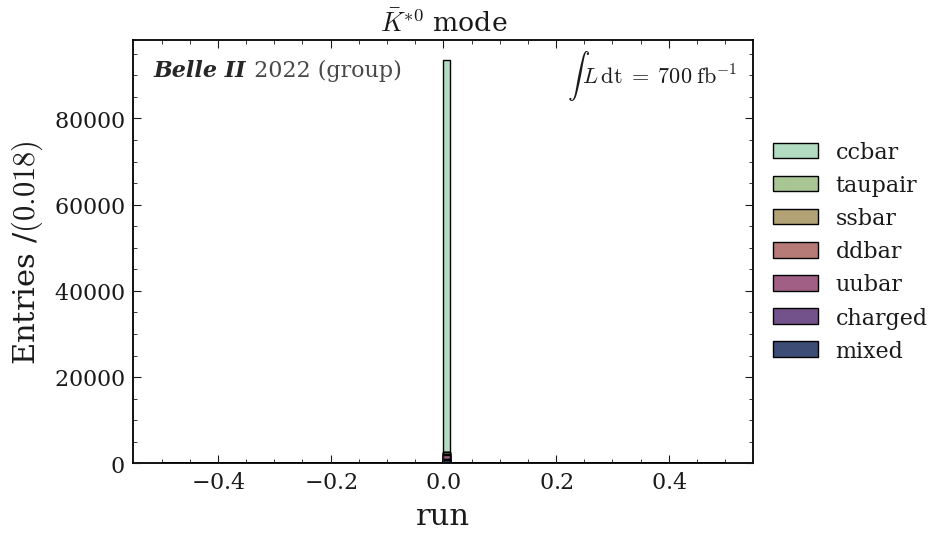

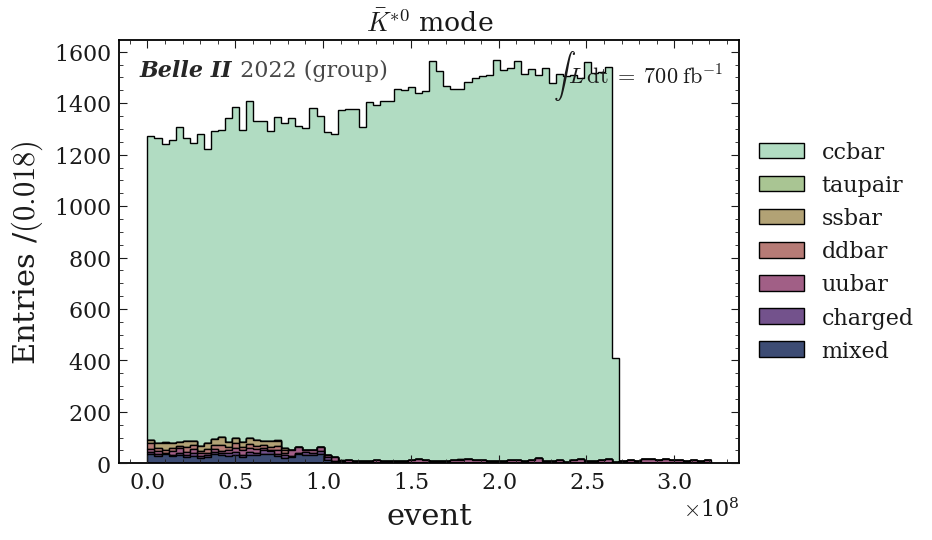

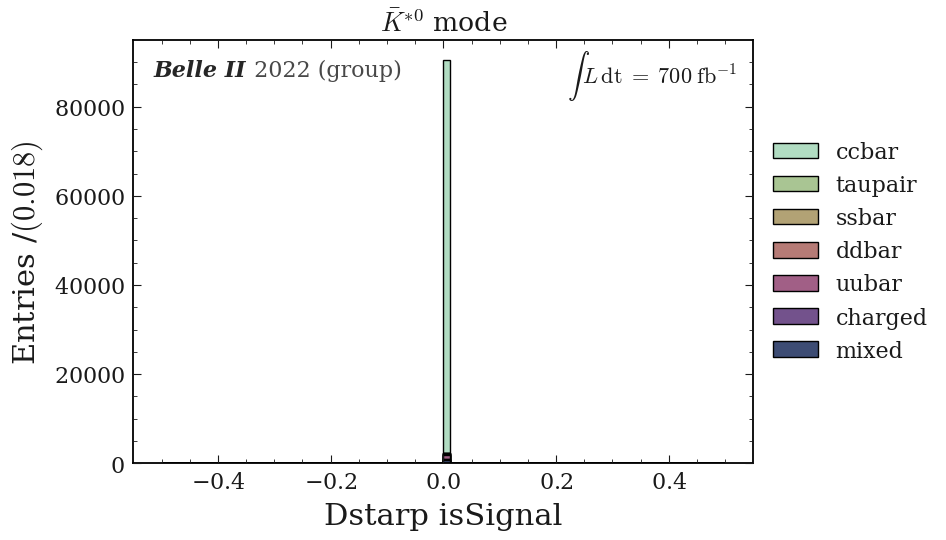

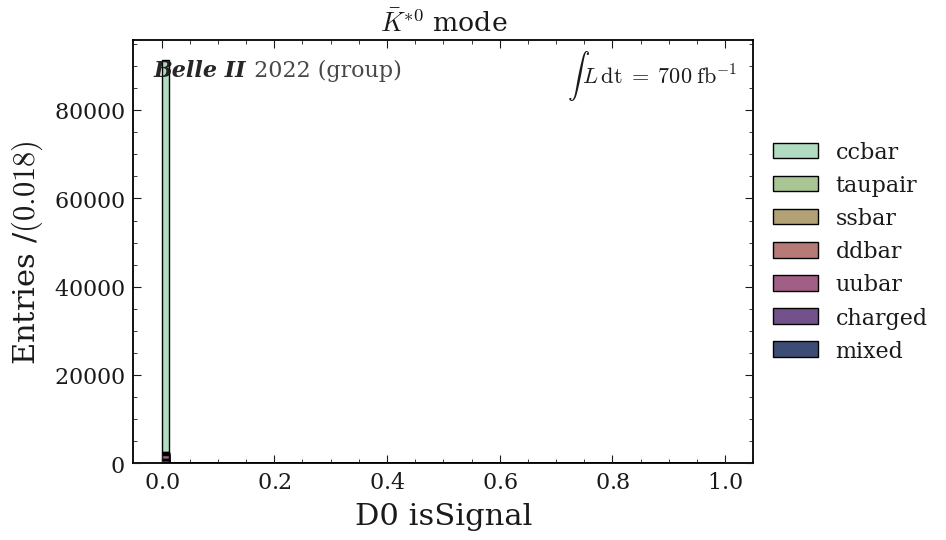

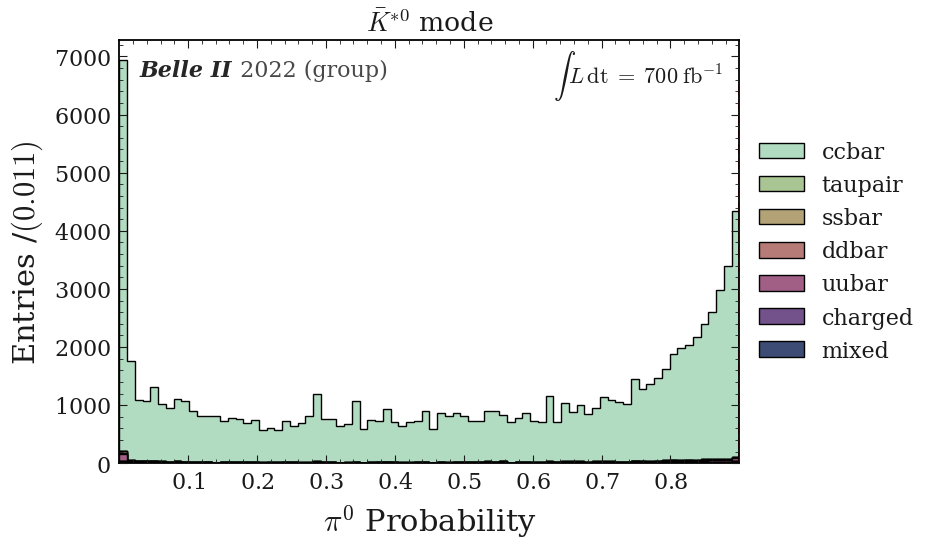

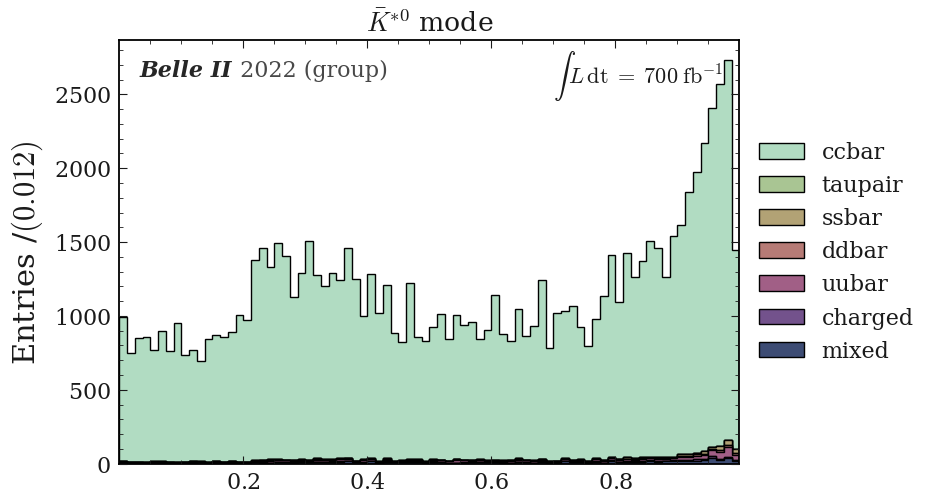

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


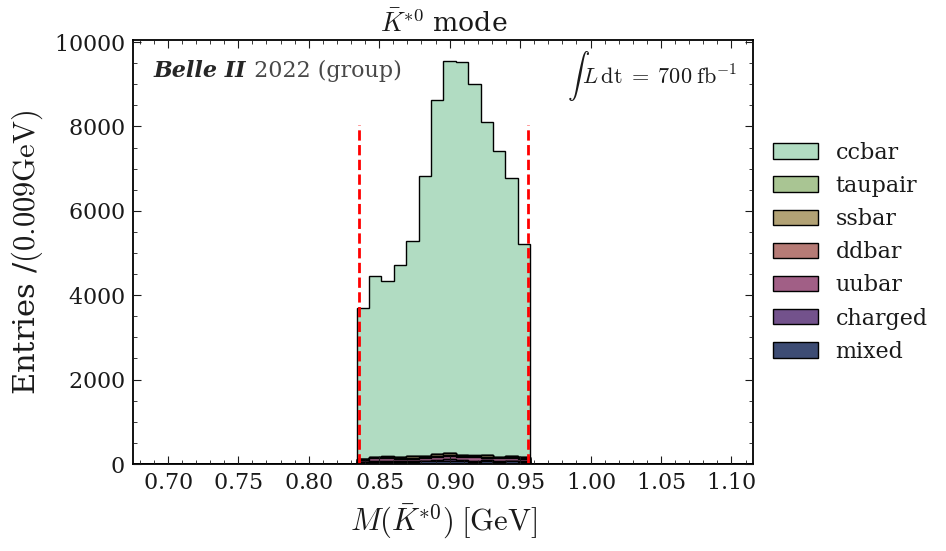

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [53]:
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

draw_stack_no_signal(figname="test",df=pd_antiKstar,bins=80, vector='antiKstar', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


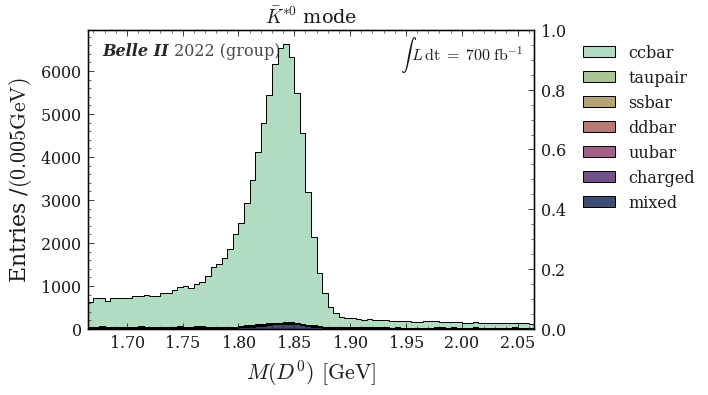

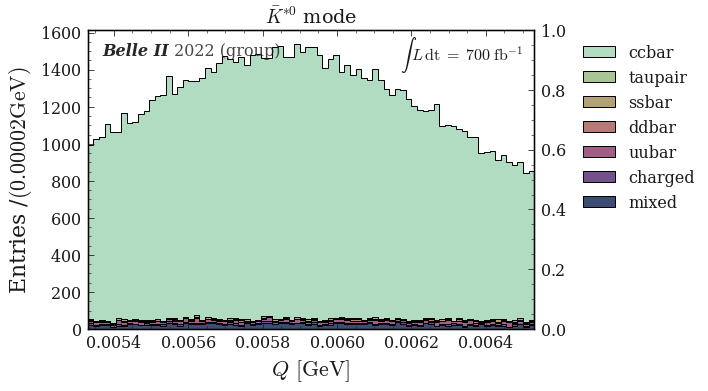

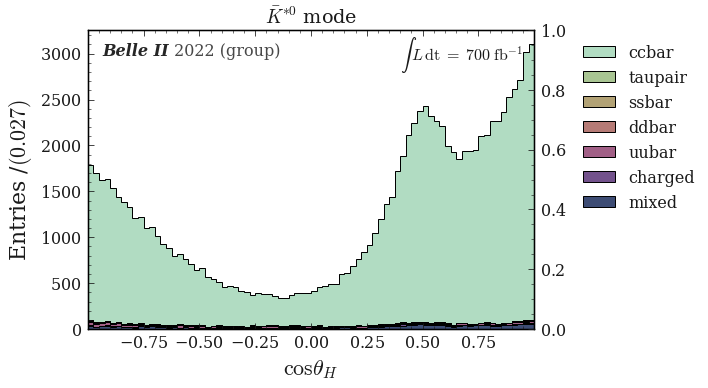

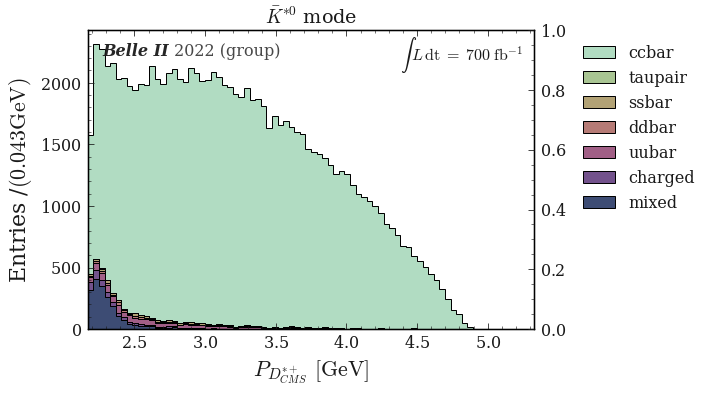

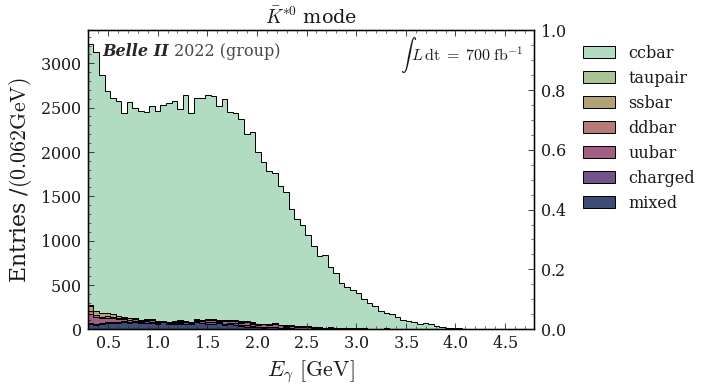

...

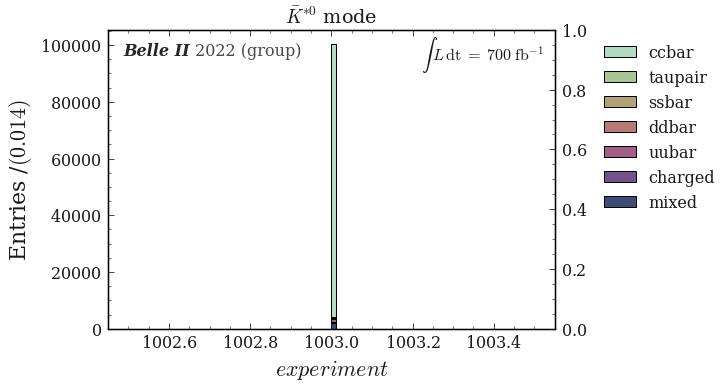

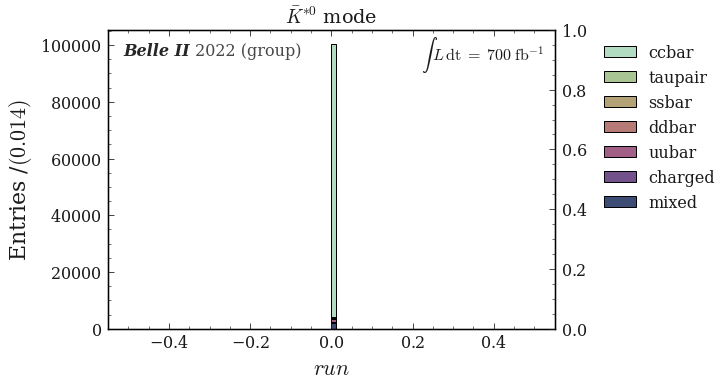

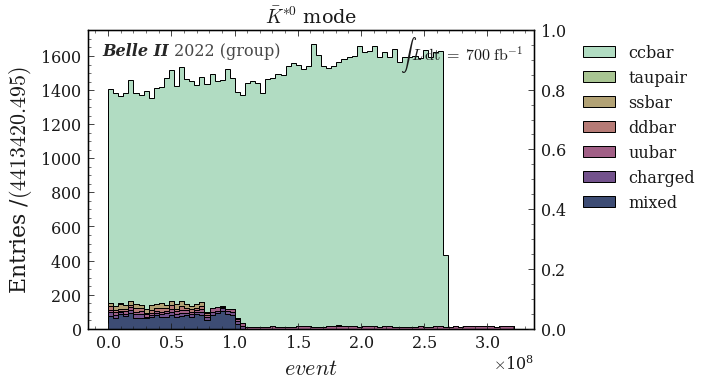

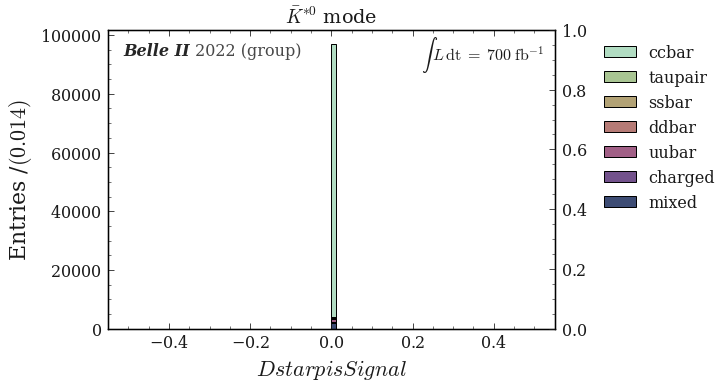

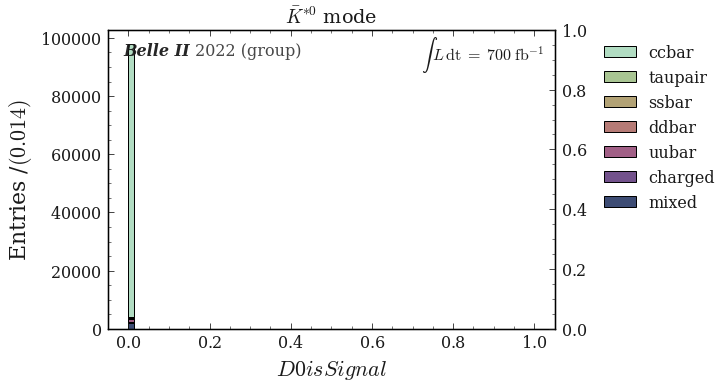

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

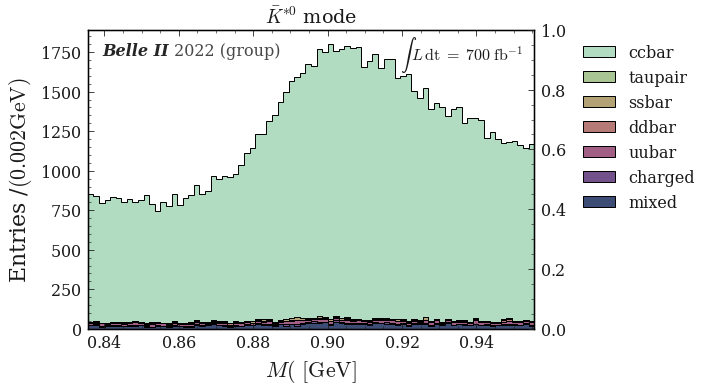

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [16]:
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

draw_stack_no_signal(df=pd_antiKstar[(pd_antiKstar['Pi0_Prob']<0.9) & (pd_antiKstar['antiKstar_InvM']<0.89555+0.06) & (pd_antiKstar['antiKstar_InvM']>0.89555-0.06)],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## omega

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


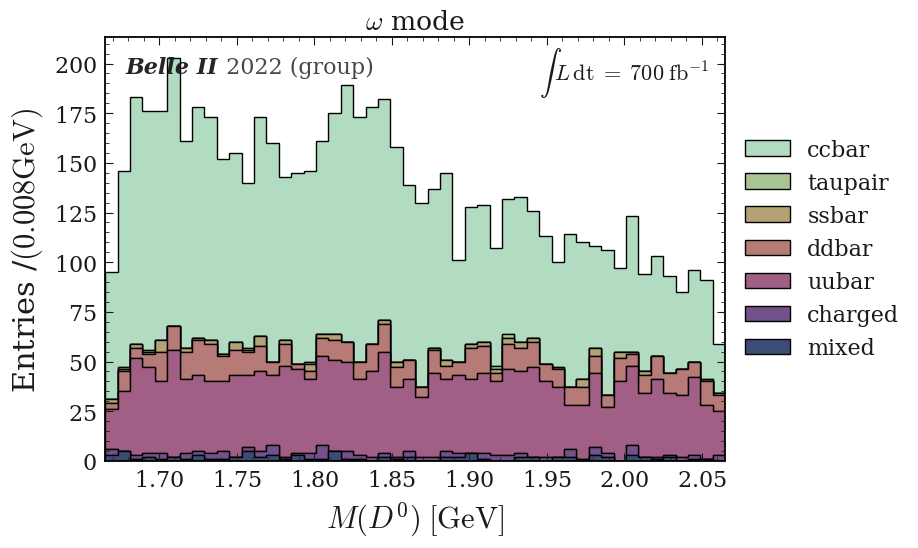

Q
$Q \; [\mathrm{GeV}]$


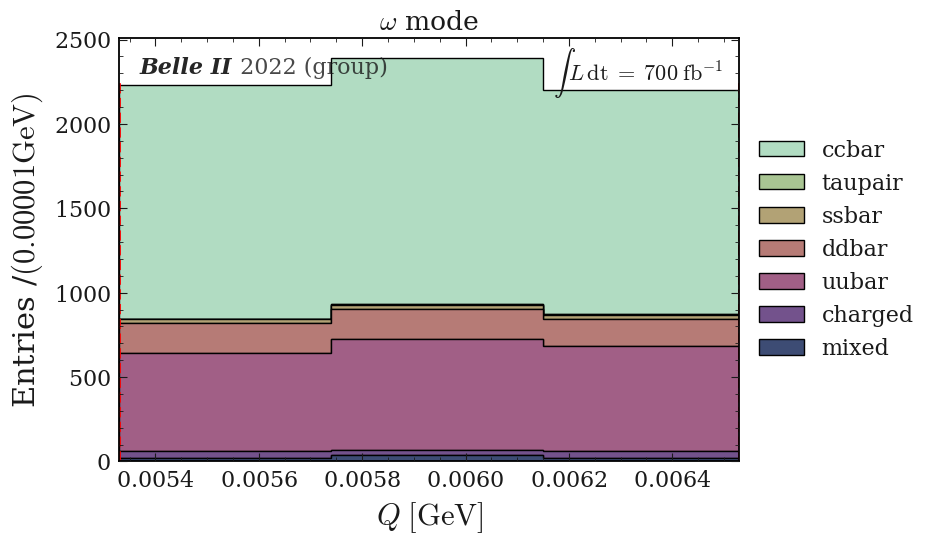

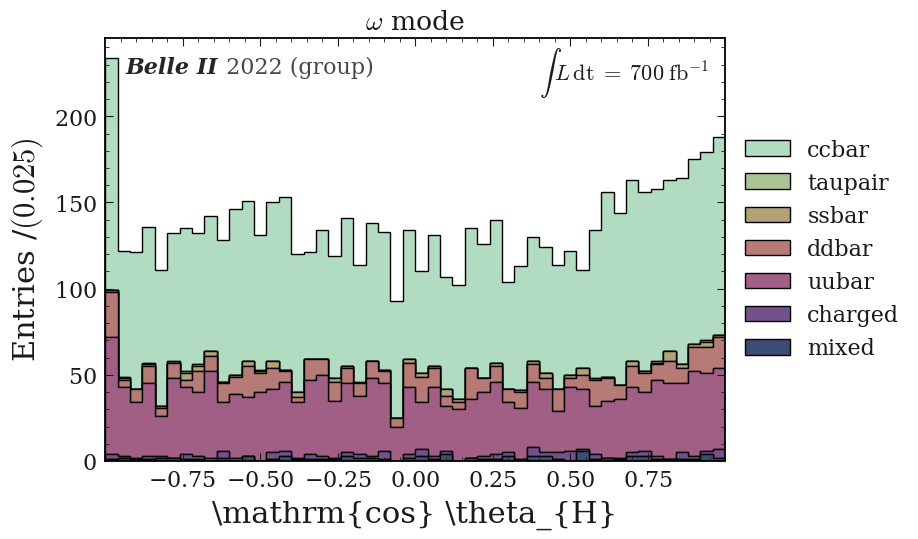

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


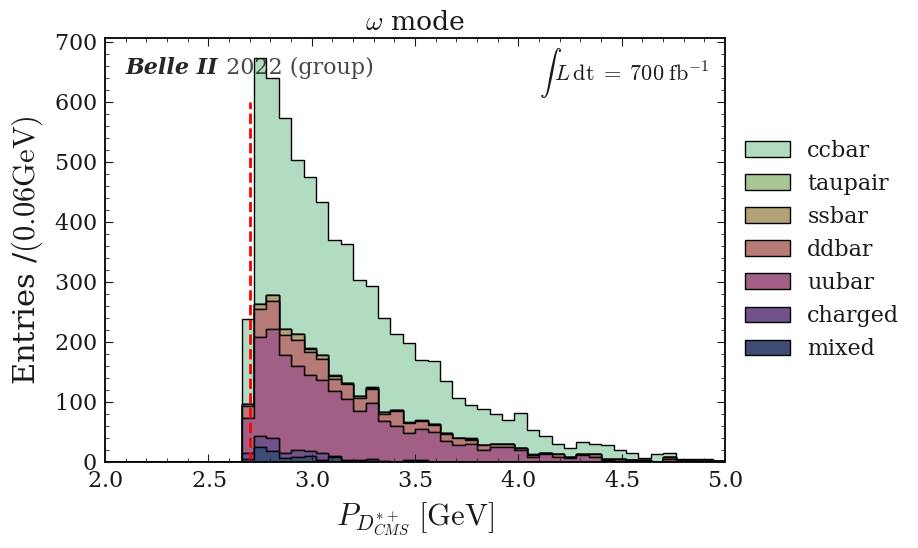

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


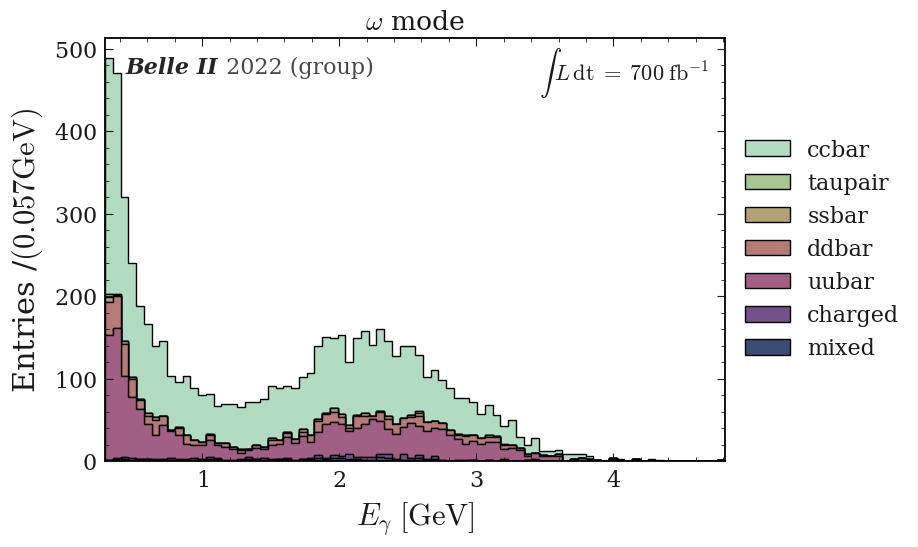

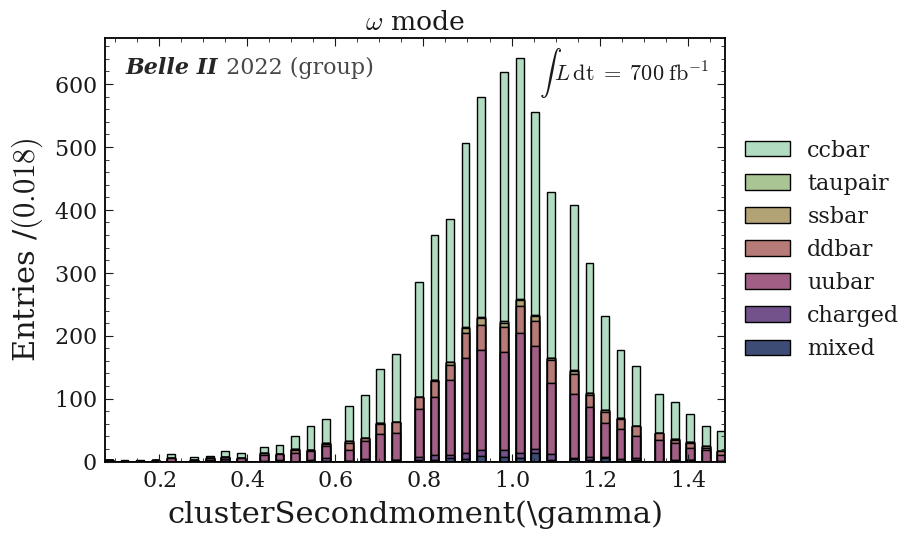

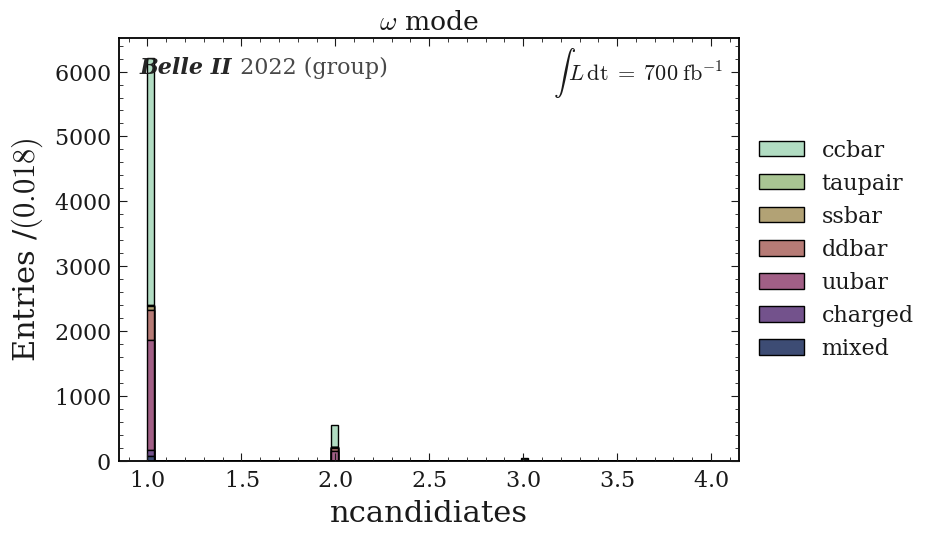

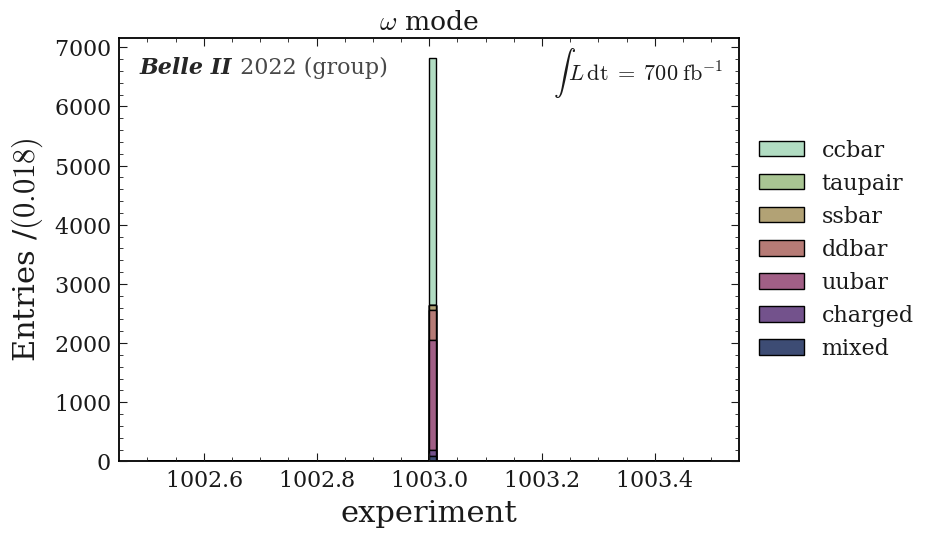

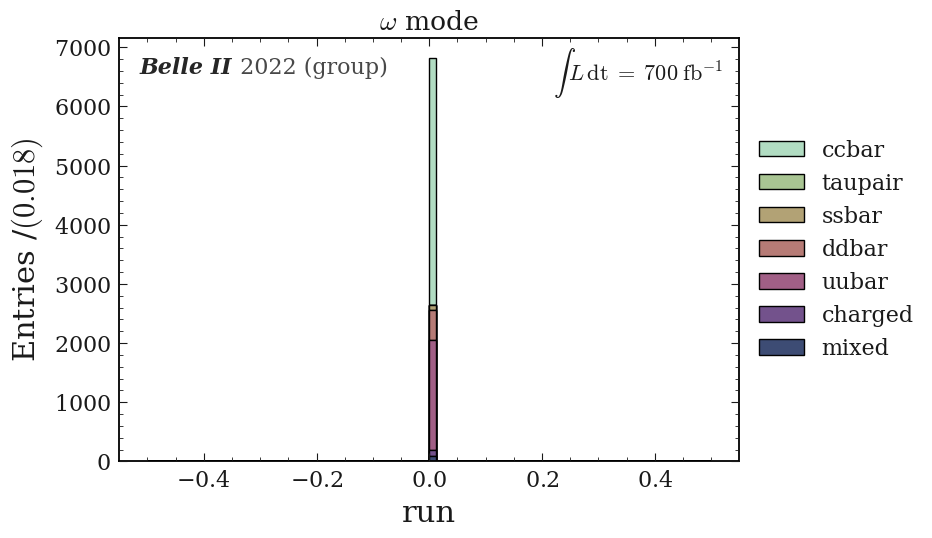

...

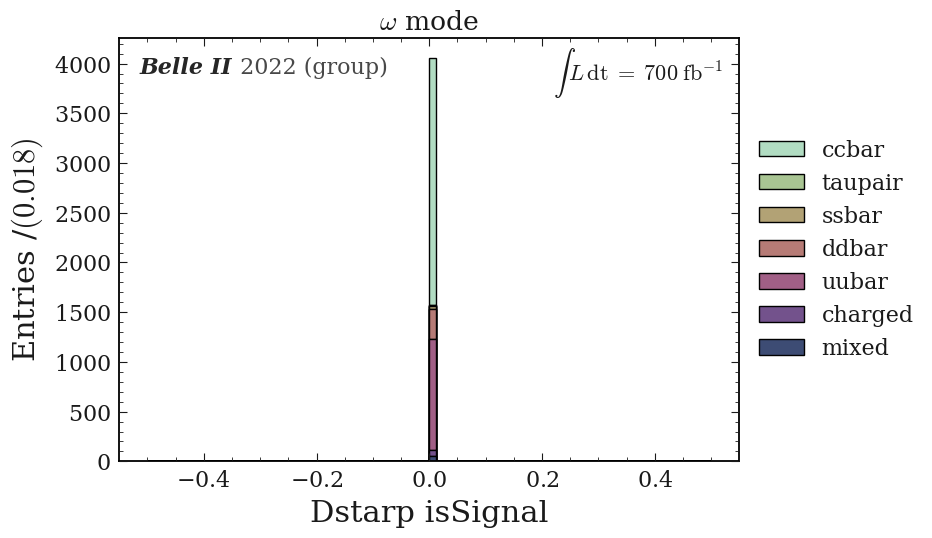

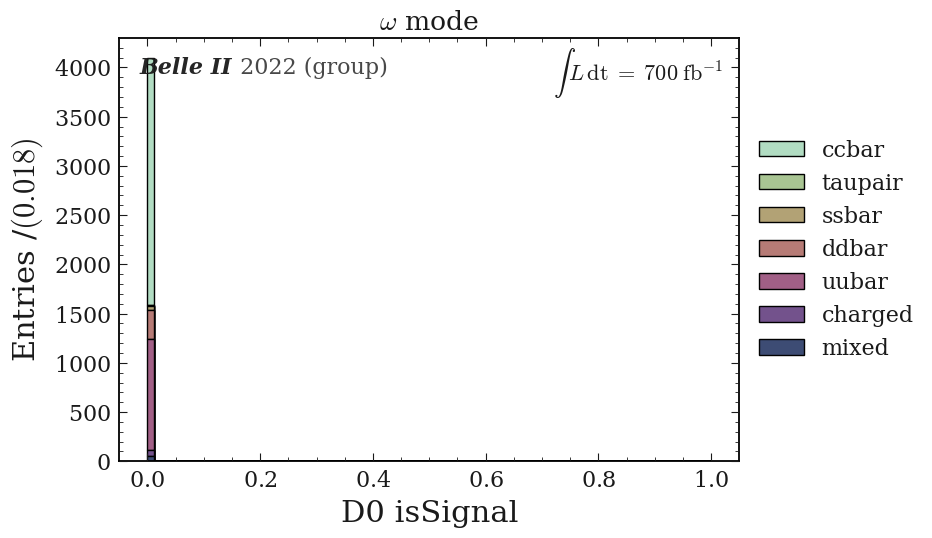

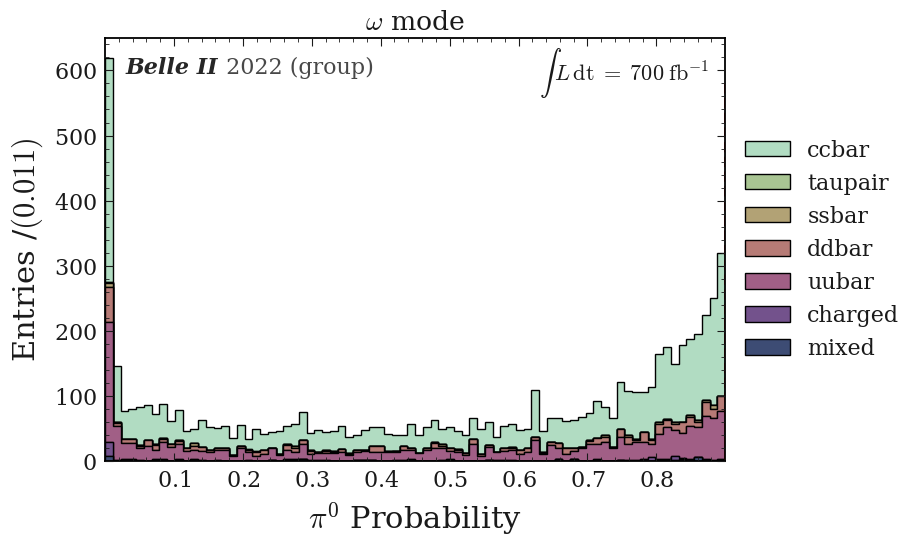

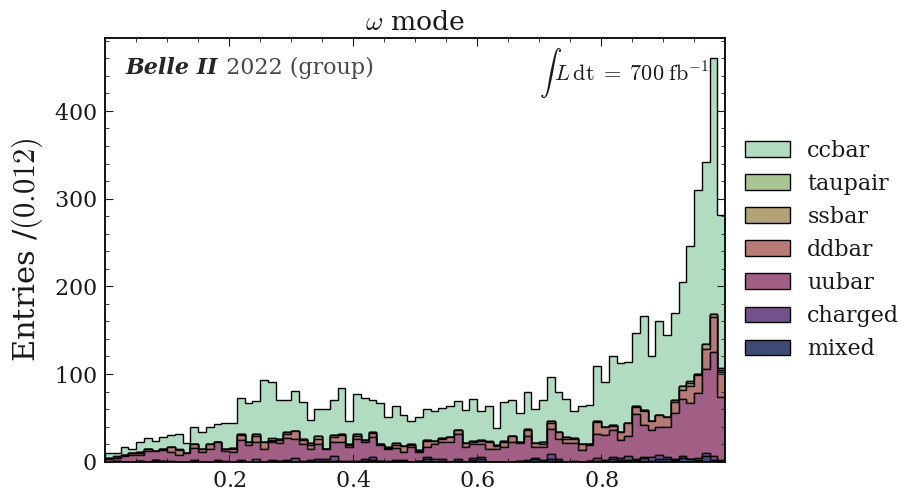

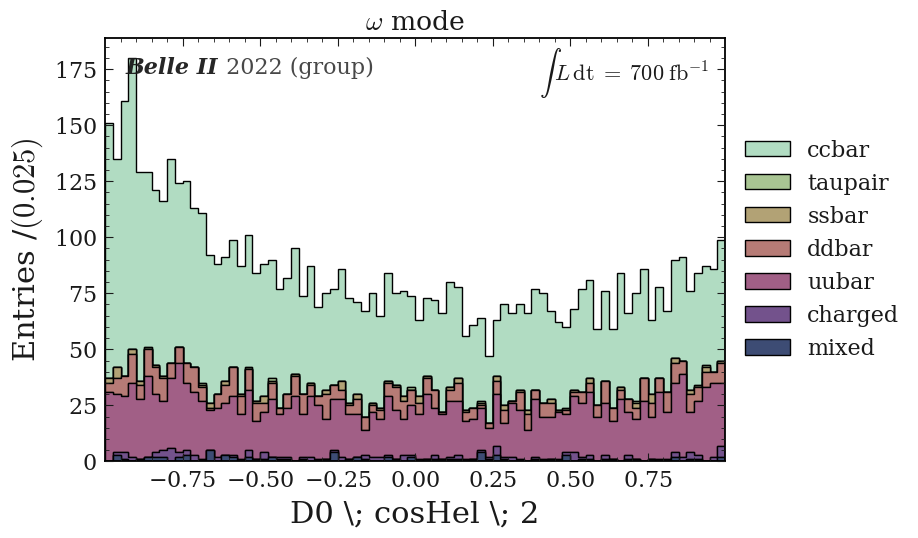

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


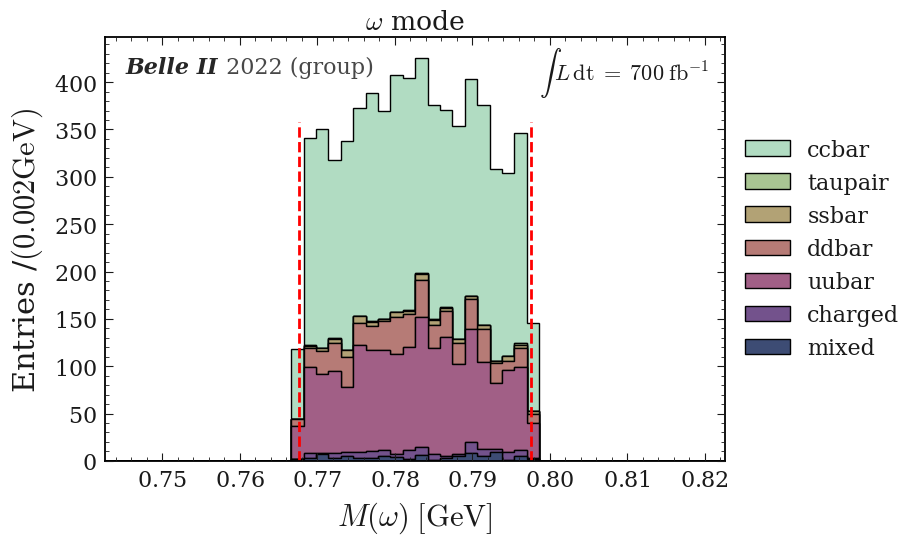

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [54]:
plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(figname="test",df=pd_omega,bins=80, vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


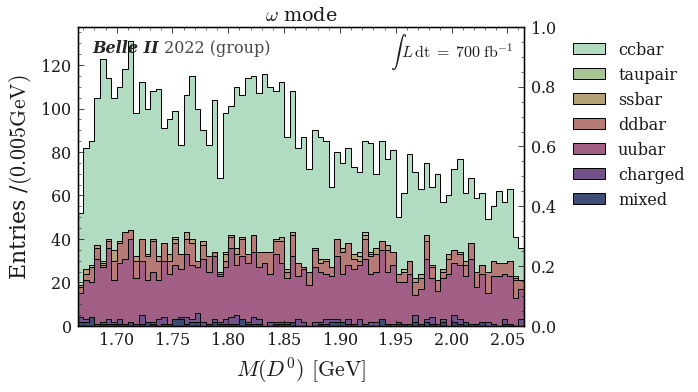

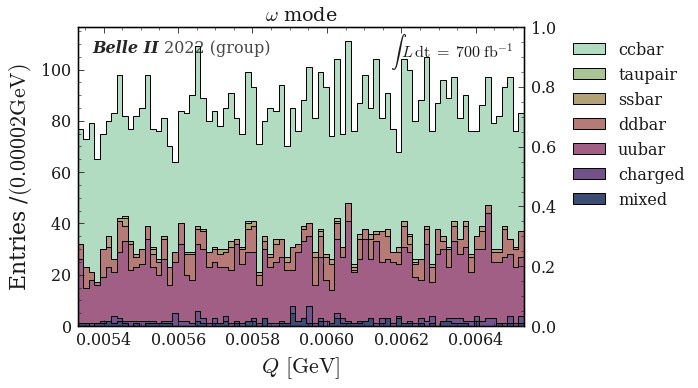

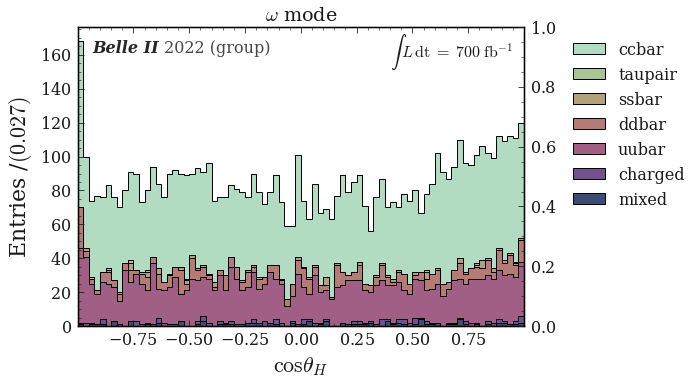

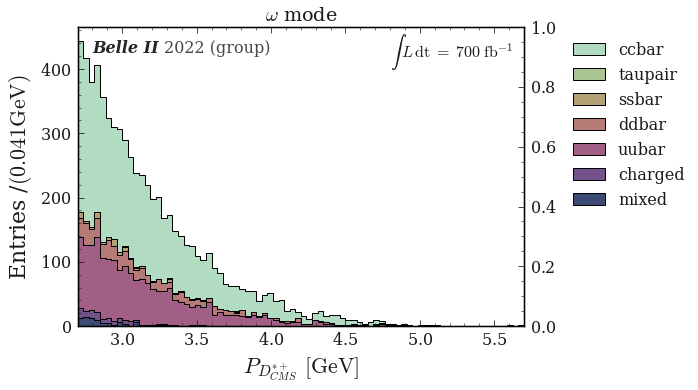

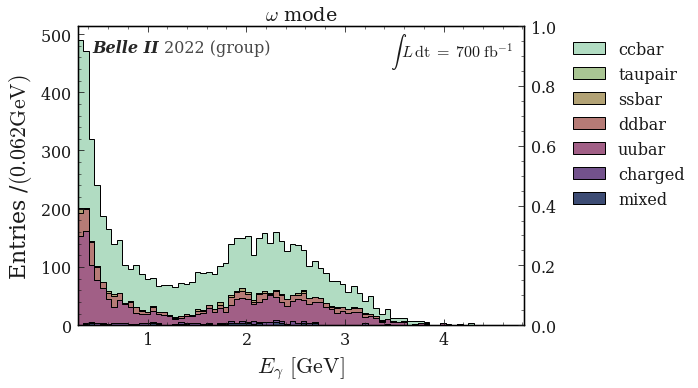

...

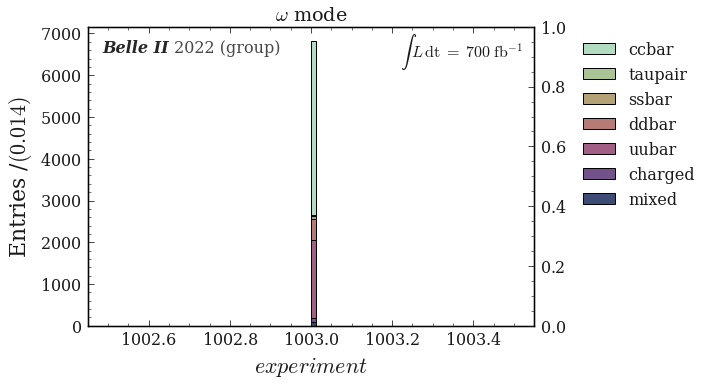

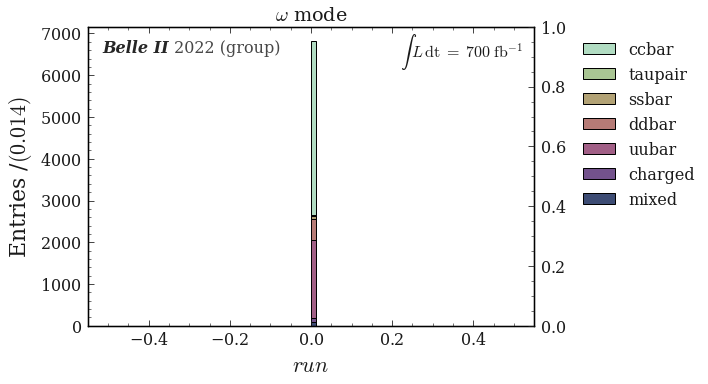

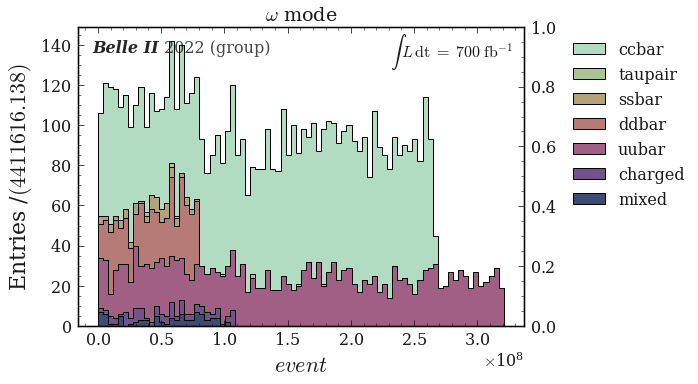

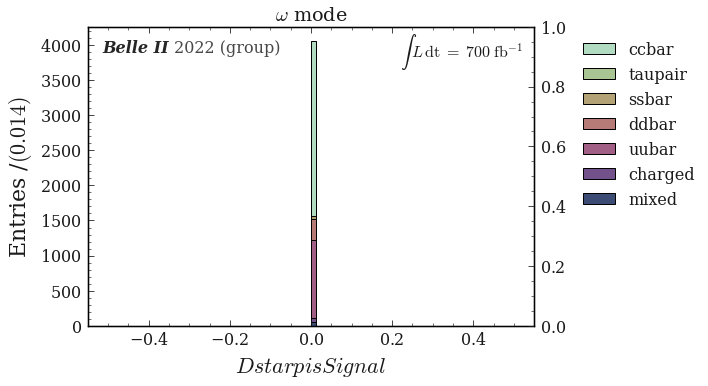

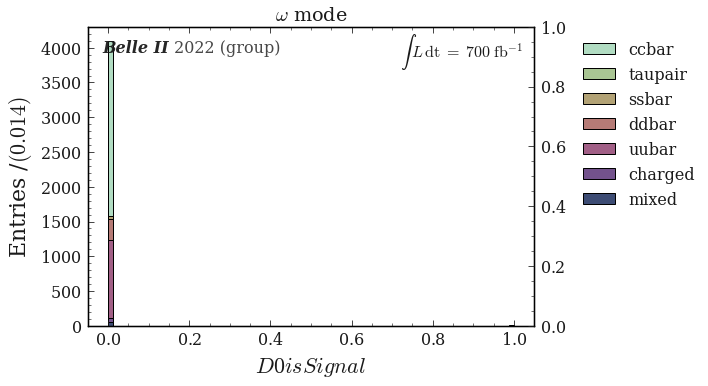

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

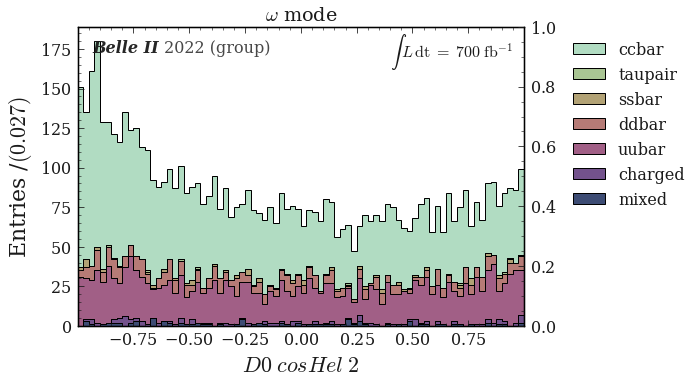

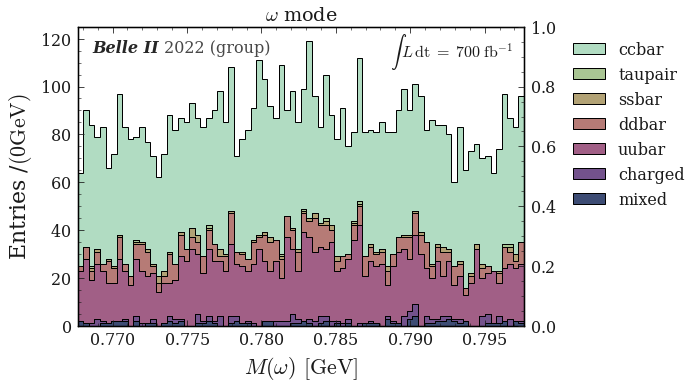

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [18]:
plot_title = r'$\omega$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_omega[pd_omega['Pi0_Prob']<0.9],bins=80, vector='omega', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


(array([109422., 124446., 122111., 118418., 114329., 111489., 108152.,
        103124.,  98302.,  87354.]),
 array([1.6650008 , 1.70500065, 1.74500051, 1.78500036, 1.82500021,
        1.86500007, 1.90499992, 1.94499978, 1.98499963, 2.02499949,
        2.06499934]),
 <BarContainer object of 10 artists>)

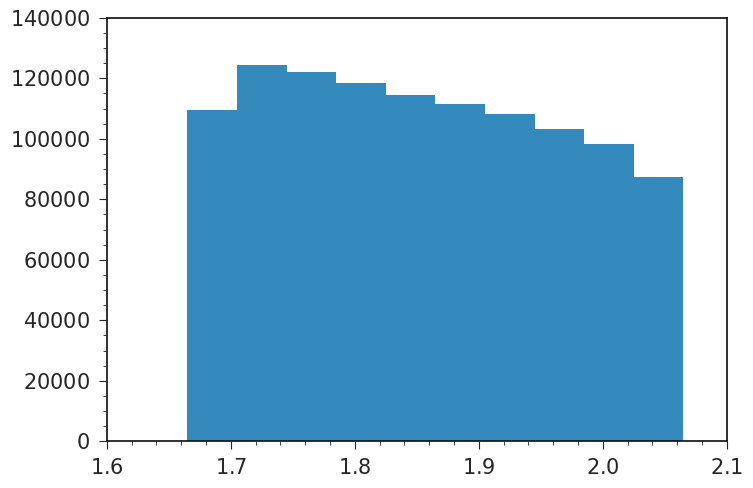

In [78]:
plt.hist(pd_omega['D0_M'])